In [1]:
import os
import sys
import glob
import datetime

import gzip
import pickle

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import biosppy
from biosppy.signals import ecg
from scipy import signal
import pyhrv
import pyhrv.tools as tools
import pyhrv.time_domain as td

# import matplotlib as mpl
# # %matplotlib
# mpl.use('TkAgg')

In [2]:
# current work directory
path = os.path.abspath(os.getcwd())
print('경로:',path)
# directory file list
# file_list = glob.glob(path+ '/**/*.csv')

DEVICES = ['H10', 'VERITY']
PROTOCOL = ['RESTING', 'MAST']

# 시간은 초

RESTING_TIME = [420]
MAST_TIME = [300, 90, 45, 60, 60, 60, 90, 90, 45, 60]

# 데이터 시간, 인덱스, ppg 센서 3개, ambient 센서, 수동 입력 marker
##(중요) ppg 처리 로직 있는지 확인 중!!!!!!!!
VERITY_COL = ['time', 'idx', 'ppg0', 'ppg1', 'ppg2', 'ambient', 'marker']
# 심박 ecg 센서
H10_COL = ['time', 'idx', 'sensor', 'marker']

TIME_FORMAT = "%Y%m%d%H%M%S%f"

# time interval caculation을 위한 
Z_list = [0]

경로: /home/pilab/workspace/Stress_sensor_data_processing


In [3]:
def file_search(path):
    '''
        Mast, Resting csv 파일 찾는 함수
        근데 이거 왜 만듬?
        
        path = 현재 작업 디렉토리 절대 위치
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    try:
        filenames = os.listdir(path)
        for filename in filenames:
            full_filename = os.path.join(path, filename)
            if filename == 'Mast':
                # mast_path = full_filename
                file_list_mast = sorted([f for f in os.listdir(full_filename) if f.startswith('(M)')])
            elif filename == 'Resting':
                # resting_path = full_filename
                file_list_resting = sorted([f for f in os.listdir(full_filename) if f.startswith('(H)')])
            else:
                pass 
        # return file_list_mast, file_list_resting, resting_path, mast_path
        return file_list_mast, file_list_resting
    
    except PermissionError:
        print('file search fail')
        pass
    
# file_list_mast, file_list_resting, resting_path, mast_path = file_search(path)
file_list_mast, file_list_resting = file_search(path)
# file_search(path)

In [4]:
def device_listing(file_list):
    '''
        기기 별 csv 파일 찾는 함수
        기기 별로 찾아야 할지, 피험자 별로 찾아야할지 아직 모르겠음, 둘다 해야겠지?
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    # polar sensor data list
    try:
        if file_list[0][:3] == ('(H)'):
            print('Resting data')
        elif file_list[0][:3] == ('(M)'):
            print('Mast data')
            
        file_list_h10 = sorted([f for f in file_list if f.endswith('H10.csv')])
        file_list_verity = sorted([f for f in file_list if f.endswith('Verity.csv')])
        print('Got list')
    except:
        print('wrong list or files')

    return {'h10':file_list_h10, 'verity': file_list_verity}
    

resting_device_dict = device_listing(file_list_resting)
mast_device_dict = device_listing(file_list_mast)

Resting data
Got list
Mast data
Got list


In [5]:
def id_listing():
    return
# print('*** Rest h10 데이터:',rest_file_list_h10)
print('h10 데이터 개수',len(resting_device_dict['h10']),'개')
# print('*** Rest verity 데이터:',rest_file_list_verity)
print('verity 데이터 개수',len(resting_device_dict['verity']),'개')

# 파일 별  분석하려고 대충 보고 있는 for loop
if len(resting_device_dict['h10']) == len(resting_device_dict['verity']):
    print('Number of Data equl')
#     i = 1
#     for h10, verity in zip(rest_file_list_h10, rest_file_list_verity):
        
#         print()
#         print(f'{i}-1:',h10)
#         print('ID:',h10[3:6])
#         print('Date:',h10[7:22])

#         print(f'{i}-2:',verity)
#         print('ID:',verity[3:6])
#         print('Date:',verity[7:22])
        
#         i += 1
else:
    print('expected data missing')

h10 데이터 개수 39 개
verity 데이터 개수 40 개
expected data missing


In [6]:
def date_data_load(device_file_dict = {}, date = '20230101', task = 'resting'):
    date_h10_dict = {}
    date_verity_dict = {}
    if task == 'resting':
        task_path = path + '/Resting/'
    else:
        task_path = path + '/Mast/'
    
    for i in device_file_dict:
        if i == 'h10':
            date_h10 = [data for data in device_file_dict[i] if date in data]
        elif i == 'verity':
            date_verity = [data for data in device_file_dict[i] if date in data]
        else:
            print('someting is wrong')
            
    print('Data Loading...')
    for df in  date_h10:
        date_h10_dict[df] = pd.read_csv(task_path + df, names = H10_COL)
    for df in  date_verity:
        date_verity_dict[df] = pd.read_csv(task_path + df, names = VERITY_COL)
    print('Data Load complete')

    print(f'{date} - H10 데이터: {len(date_h10_dict)} 개')
    print(f'{date} - Verity 데이터: {len(date_verity_dict)} 개')
            
    return {'h10_dict': date_h10_dict, 'verity_dict': date_verity_dict}


# rest_h10_dict, rest_verity_dict =  date_listing(rest_file_list_h10, rest_file_list_verity)
# dir(rest_file_list_h10)
resting_date_dict_list = date_data_load(resting_device_dict, '20230506')

Data Loading...
Data Load complete
20230506 - H10 데이터: 18 개
20230506 - Verity 데이터: 19 개


In [7]:
with gzip.open(f'h10_dicttask.pickle','rb') as f:
    df = pickle.load(f)
print(df)

     id             date protocol device                      start   
0   001  20230429_091641        H    H10 2023-04-29 09:16:41.348517  \
1   002  20230429_102726        H    H10 2023-04-29 10:27:26.020477   
2   003  20230429_105826        H    H10 2023-04-29 10:58:26.132409   
3   004  20230429_100701        H    H10 2023-04-29 10:07:01.448371   
4   005  20230429_120717        H    H10 2023-04-29 12:07:17.070825   
5   006  20230429_115029        H    H10 2023-04-29 11:50:29.634417   
6   007  20230429_115342        H    H10 2023-04-29 11:53:42.055732   
7   008  20230429_111204        H    H10 2023-04-29 11:12:04.273611   
8   009  20230429_112014        H    H10 2023-04-29 11:20:14.607300   
9   010  20230429_114546        H    H10 2023-04-29 11:45:46.576317   
10  011  20230429_122611        H    H10 2023-04-29 12:26:11.472811   
11  012  20230429_091307        H    H10 2023-04-29 09:13:07.630257   
12  013  20230429_130300        H    H10 2023-04-29 13:03:00.180001   
13  01

In [8]:
# Data check 1
for i in resting_date_dict_list:

    with gzip.open(f'{i}task.pickle','rb') as f:
        df = pickle.load(f)

    if len(df) == 0 :
        df = pd.DataFrame(columns = ['id', 'date', 'protocol', 'device', 'start', 'end', 'total', 'avg', 'fs'])
    
    for j in resting_date_dict_list[i]:
        # print(j)
        if j.endswith('H10.csv'):
            # print('H10 모양 :', resting_date_dict_list[i][j].shape)
            h10_rows, h10_columns = resting_date_dict_list[i][j].shape
            if h10_columns == 4:
                # print('H10 Data columns length is correct')
                pass
            else:
                break
                print('H10 Data columns length is Not correct')
        elif j.endswith('Verity.csv'):
            # print('verity 모양 :', resting_date_dict_list[i][j].shape)
            verity_rows, verity_columns = resting_date_dict_list[i][j].shape
            if verity_columns == 7:
                # print('Verity sensor Data columns length is correct')
                pass
            else:
                break
                print('Verity sensor Data columns length is Not correct')
    print(i + ' OK!')
    
    for j in resting_date_dict_list[i]:
        print(j)
        resting_date_dict_list[i][j]['times'] = pd.to_datetime(resting_date_dict_list[i][j]['time'], 
                                                               format = TIME_FORMAT)
        resting_date_dict_list[i][j]['interval'] = \
            Z_list + [resting_date_dict_list[i][j]['times'].loc[k+1]-resting_date_dict_list[i][j]['times'].loc[k] 
                      for k in range(len(resting_date_dict_list[i][j])-1)]
        
        resting_start_time = resting_date_dict_list[i][j].iloc[0][-2]
        resting_end_time = resting_date_dict_list[i][j].iloc[-1][-2]
        resting_total_time = resting_end_time-resting_start_time
        resting_time_resolution = (resting_end_time-resting_start_time)/ len(resting_date_dict_list[i][j])
        resting_fs = 1/ resting_time_resolution.total_seconds()
        
        print('Time domain window')
        print('시작 시간:',resting_start_time, '종료 시간:',resting_end_time, '총 측정 시간:', resting_total_time)
        
        if 20 <= abs(resting_total_time.total_seconds()-RESTING_TIME[0]):
            print('Wrong measurement time')

        print('해상도:', resting_time_resolution, 'fs:', resting_fs)

        row = pd.DataFrame({'id':[j[3:6]], 'date':[j[7:22]], 'protocol':[j[1:2]], 'device':[j[23:-4]], 
                        'start':[resting_start_time], 'end':[resting_end_time], 'total':[resting_total_time],
                        'avg':[resting_time_resolution], 'fs':[resting_fs]})
        df = pd.concat([df, row]).drop_duplicates().reset_index(drop=True)
        
#         if 'h10' in i:

#             if resting_fs <= 0.07693 and resting_fs >= 0.07692:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
#         else:
#             print('해상도:', resting_time_resolution, 'fs:', resting_fs)
#             if rest_h10_fs <= 0.018182 and rest_h10_fs >= 18181:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
        # print('interval data...')
        # print(resting_date_dict_list[i][j]['interval'])
            # time col datatype cast to datetime 

        print('----------------------------------------------------------------------')

    if 'h10' in i:
        resting_h10_dict = resting_date_dict_list[i]
    else:
        resting_verity_dict = resting_date_dict_list[i]
    
    with gzip.open(f'{i}task.pickle', 'wb') as f:
        pickle.dump(df, f)

h10_dict OK!
(H)021_20230506_091434_H10.csv
Time domain window
시작 시간: 2023-05-06 09:14:34.521366 종료 시간: 2023-05-06 09:21:48.325326 총 측정 시간: 0 days 00:07:13.803960
해상도: 0 days 00:00:00.007697564 fs: 129.92074834351047
----------------------------------------------------------------------
(H)022_20230506_090752_H10.csv
Time domain window
시작 시간: 2023-05-06 09:07:52.406296 종료 시간: 2023-05-06 09:14:52.713640 총 측정 시간: 0 days 00:07:00.307344
해상도: 0 days 00:00:00.007697372 fs: 129.92074834351047
----------------------------------------------------------------------
(H)023_20230506_091654_H10.csv
Time domain window
시작 시간: 2023-05-06 09:16:54.864576 종료 시간: 2023-05-06 09:23:56.240945 총 측정 시간: 0 days 00:07:01.376369
해상도: 0 days 00:00:00.007696372 fs: 129.93762993762994
----------------------------------------------------------------------
(H)024_20230506_101829_H10.csv
Time domain window
시작 시간: 2023-05-06 10:18:29.229189 종료 시간: 2023-05-06 10:25:31.233467 총 측정 시간: 0 days 00:07:02.004278
해상도: 0 days 

In [9]:
# pd.set_option('display.max_row', None)
# pd.set_option('display.max_columns', None)
# print(resting_h10['interval'])

In [10]:
# index to time 사실 필요없고 오히려 방해됨... 수정 필수
# resting_h10 = resting_h10.set_index('times')
# resting_verity = resting_verity.set_index('times')
# sns.set(rc={'figure.figsize':(11, 4)})

(H)021_20230506_091434_H10.csv
56356


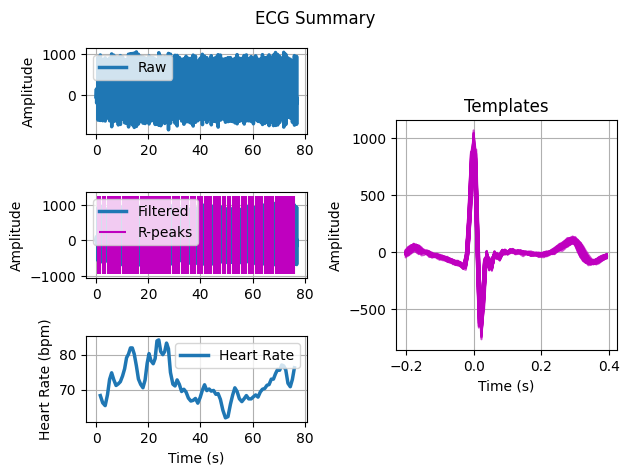

(H)022_20230506_090752_H10.csv
54604


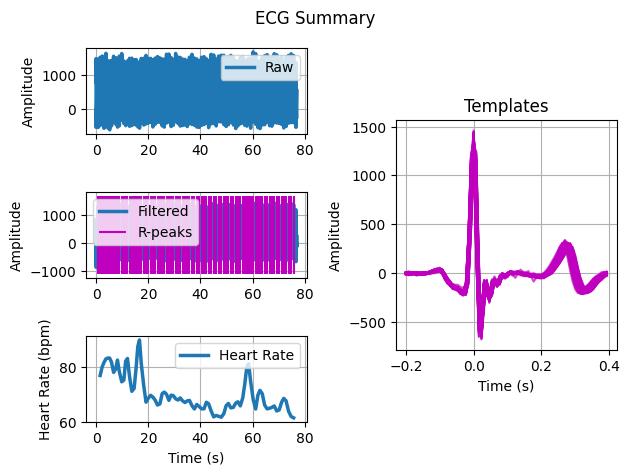

(H)023_20230506_091654_H10.csv
54750


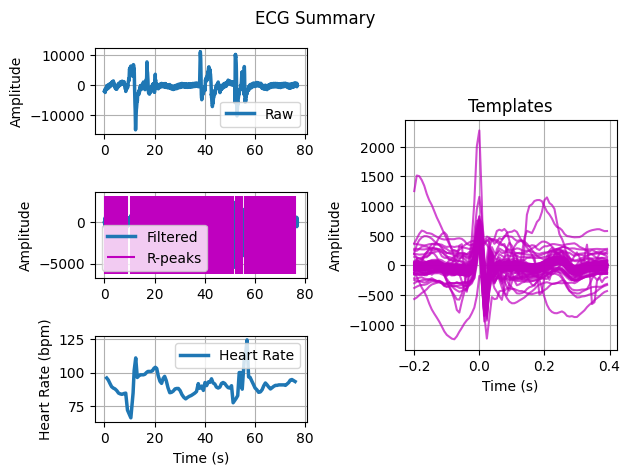

(H)024_20230506_101829_H10.csv
54823


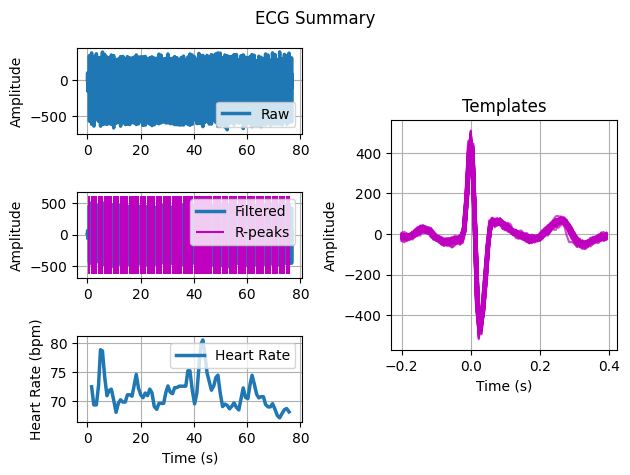

(H)025_20230506_105034_H10.csv
53874


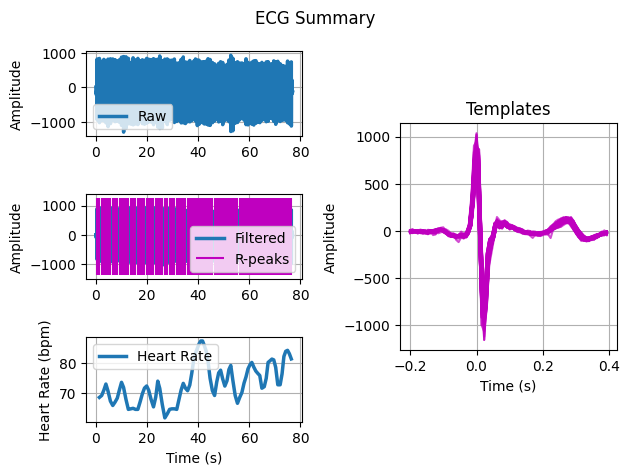

(H)026_20230506_100534_H10.csv
54604


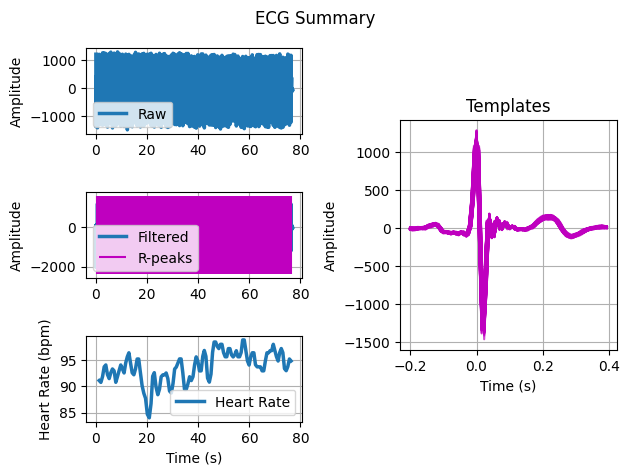

(H)027_20230506_103109_H10.csv
54750


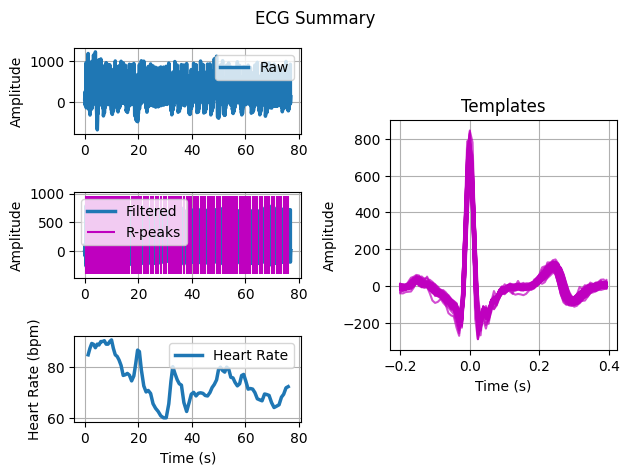

(H)028_20230506_103256_H10.csv
54604


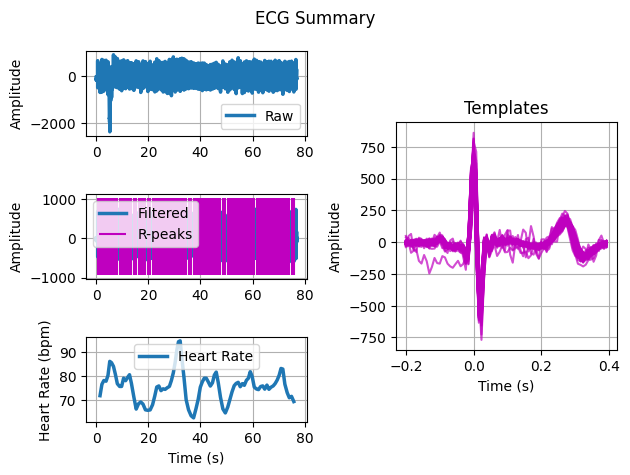

(H)029_20230506_110428_H10.csv
54604


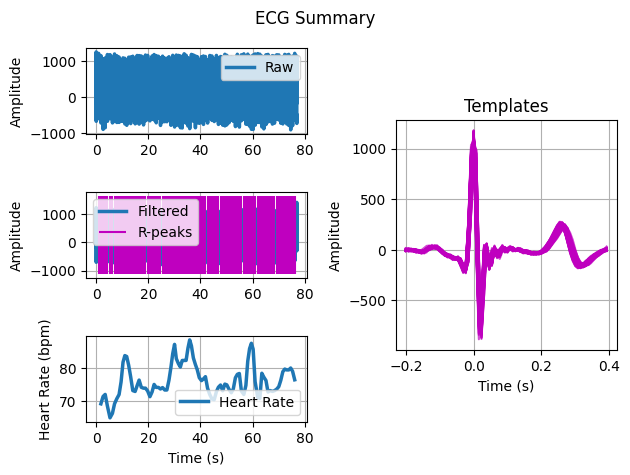

(H)030_20230506_111835_H10.csv
55115


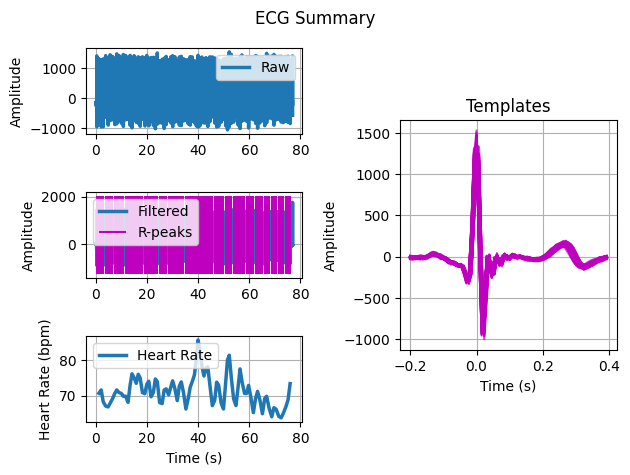

(H)031_20230506_115214_H10.csv
54604


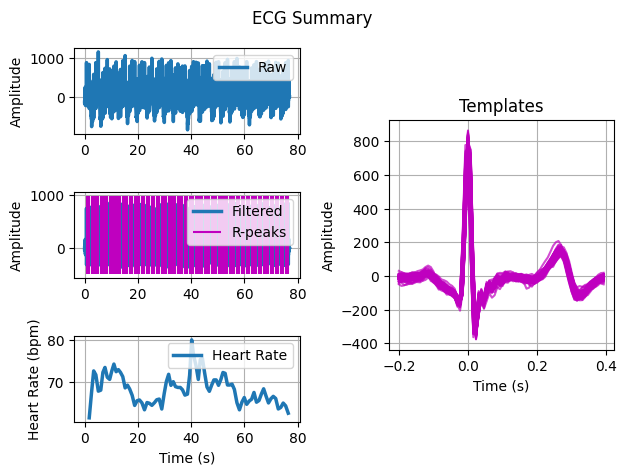

(H)032_20230506_110936_H10.csv
54677


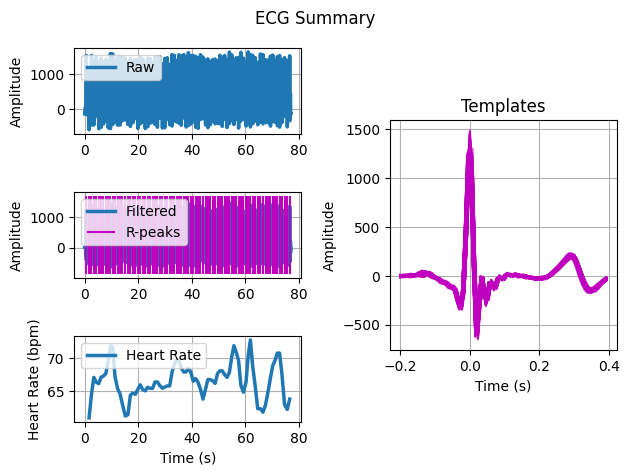

(H)033_20230506_113121_H10.csv
54677


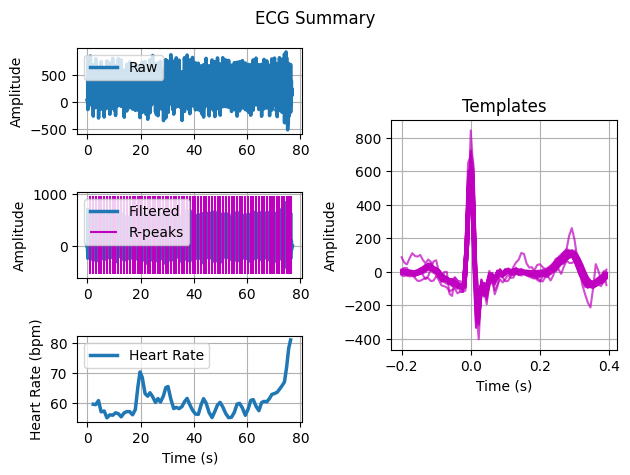

(H)034_20230506_113727_H10.csv
54604


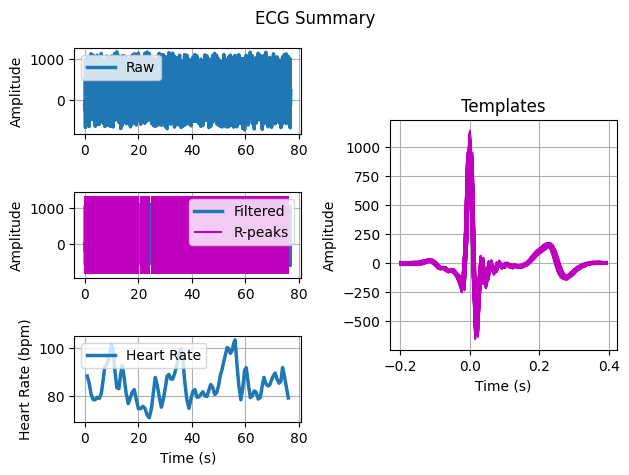

(H)035_20230506_120250_H10.csv
54677


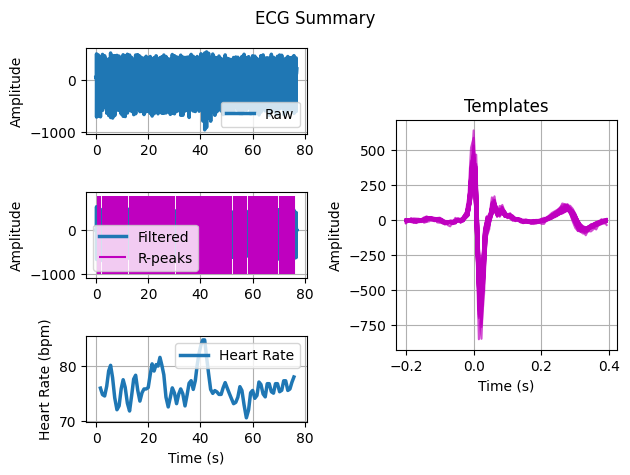

(H)036_20230506_125632_H10.csv
54604


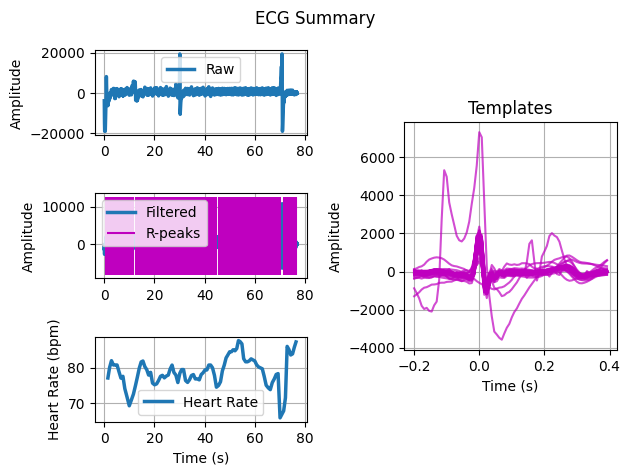

(H)037_20230506_123958_H10.csv
54677


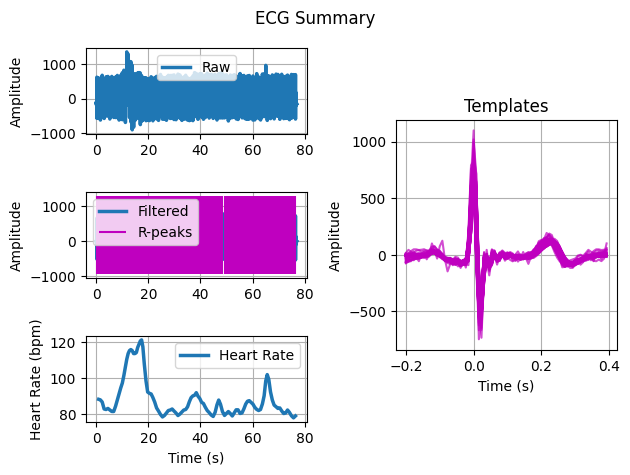

(H)039_20230506_122927_H10.csv
54677


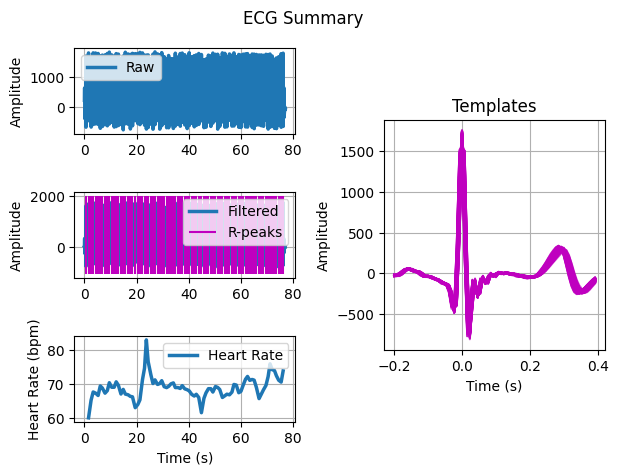

In [11]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor'][10000:20000]
    out = ecg.ecg(signal=signal, 
                  sampling_rate=130., 
                  show=False
                 )
    ecg_data = out.as_dict()
    biosppy.plotting.plot_ecg(
                          ts = ecg_data['ts'],
                          raw=signal, 
                          filtered = ecg_data['filtered'], 
                          rpeaks = ecg_data['rpeaks'],
                          templates_ts = ecg_data['templates_ts'],
                          templates = ecg_data['templates'],
                          heart_rate_ts = ecg_data['heart_rate_ts'],
                          heart_rate = ecg_data['heart_rate'],
                          # sampling_rate=130., 
                          show=True
                          )
    

(H)021_20230506_091434_H10.csv
56356


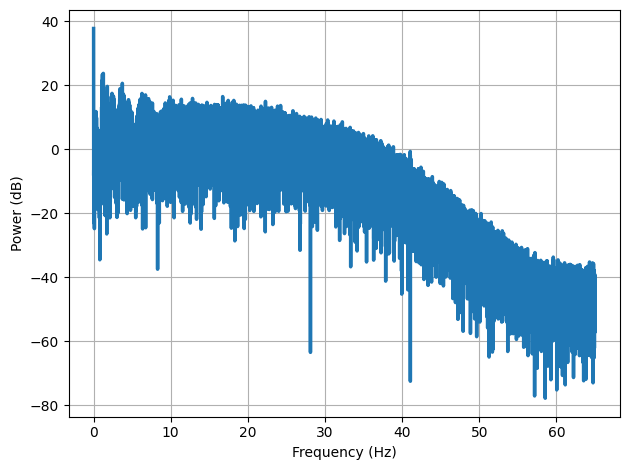

(H)022_20230506_090752_H10.csv
54604


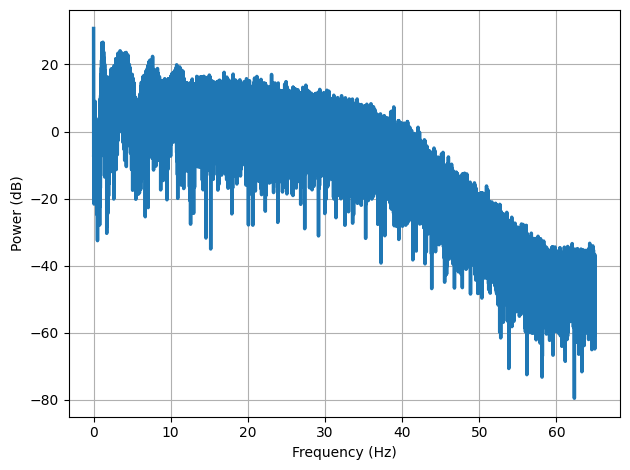

(H)023_20230506_091654_H10.csv
54750


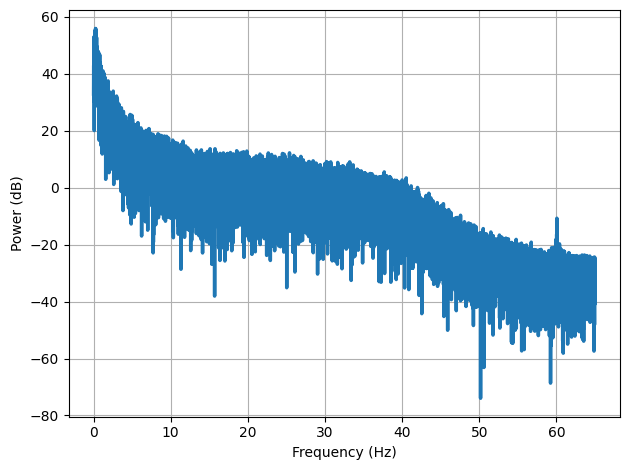

(H)024_20230506_101829_H10.csv
54823


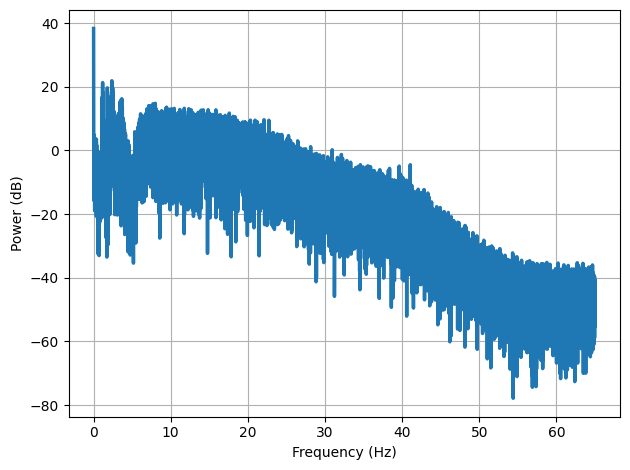

(H)025_20230506_105034_H10.csv
53874


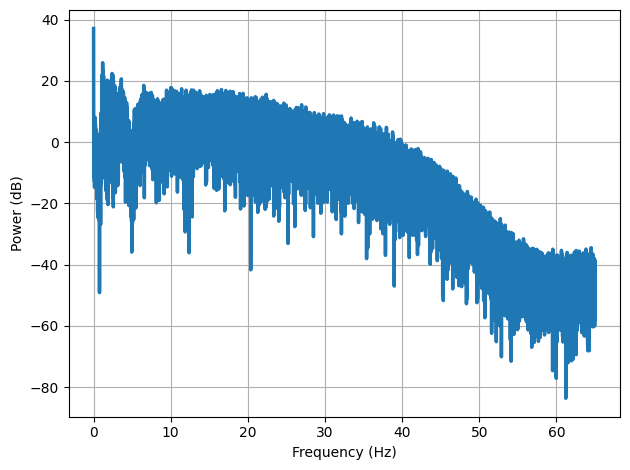

(H)026_20230506_100534_H10.csv
54604


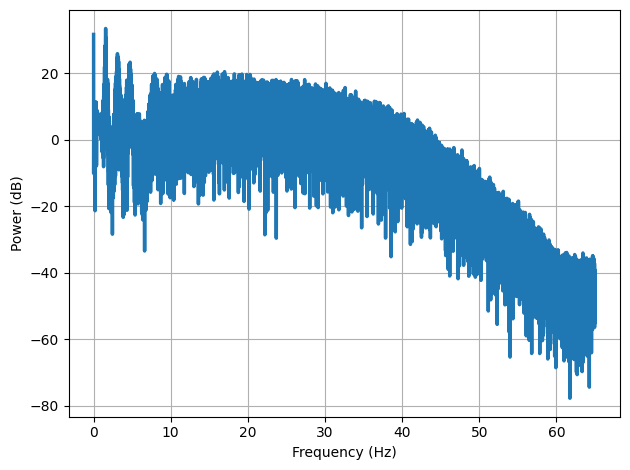

(H)027_20230506_103109_H10.csv
54750


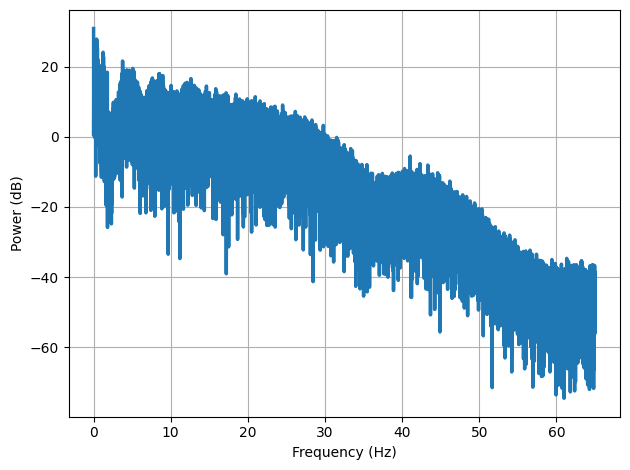

(H)028_20230506_103256_H10.csv
54604


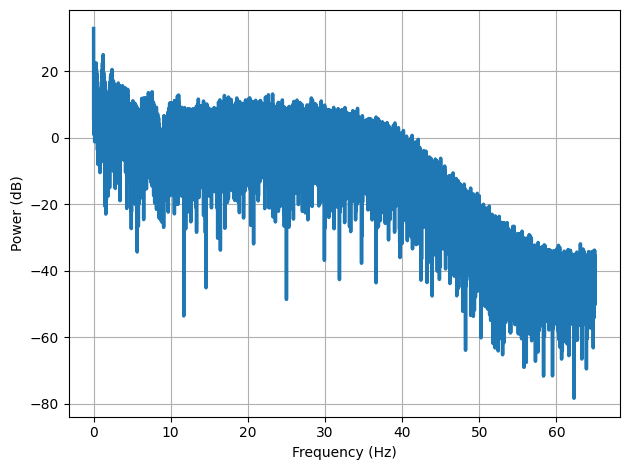

(H)029_20230506_110428_H10.csv
54604


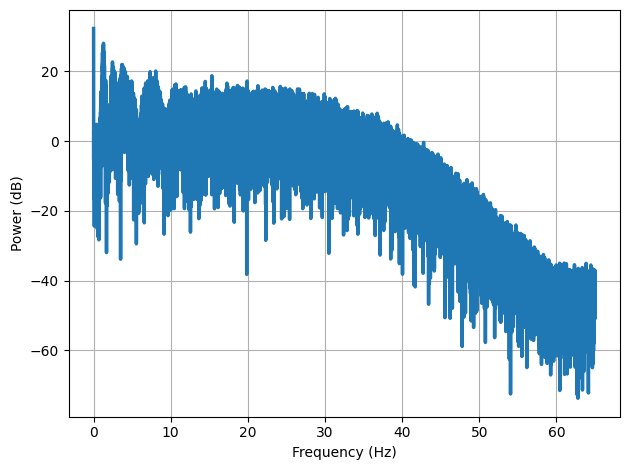

(H)030_20230506_111835_H10.csv
55115


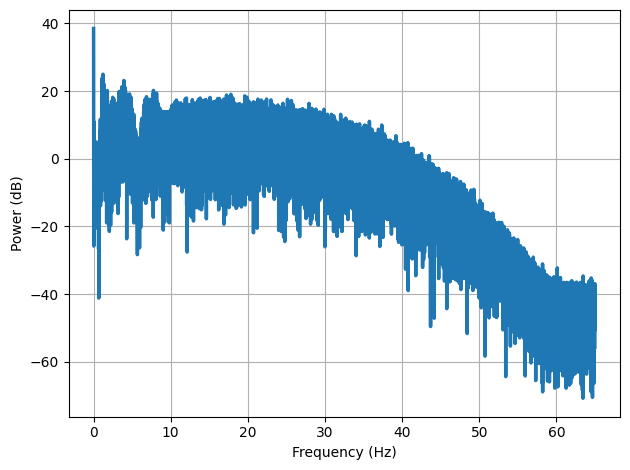

(H)031_20230506_115214_H10.csv
54604


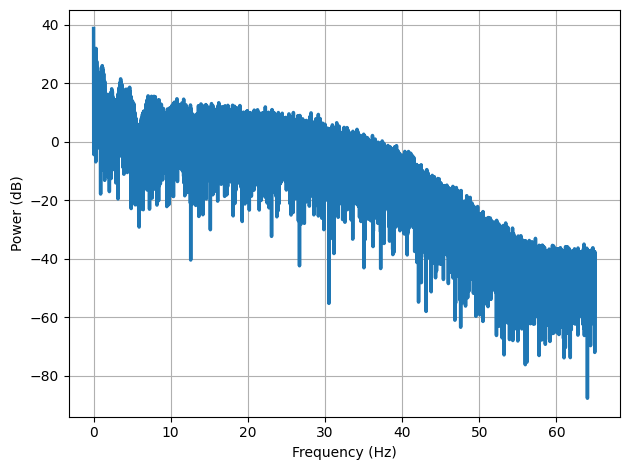

(H)032_20230506_110936_H10.csv
54677


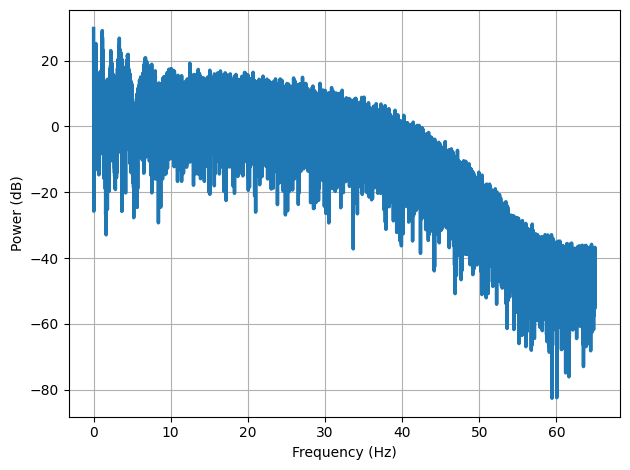

(H)033_20230506_113121_H10.csv
54677


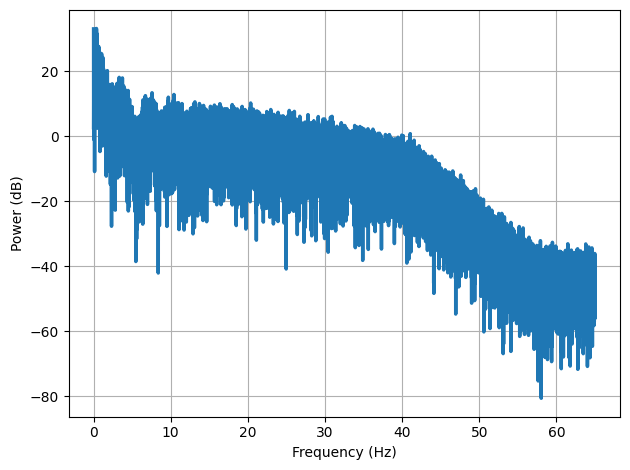

(H)034_20230506_113727_H10.csv
54604


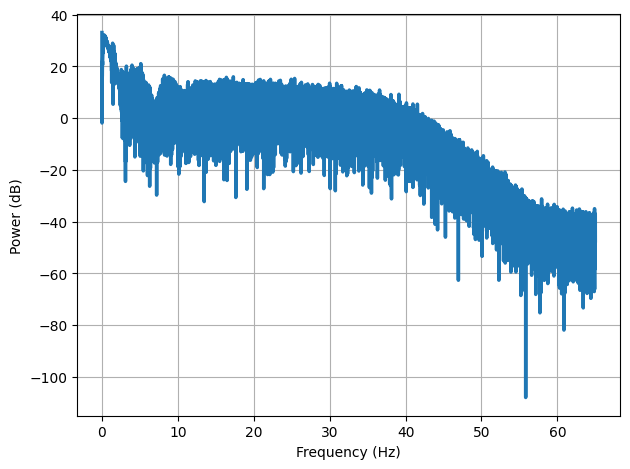

(H)035_20230506_120250_H10.csv
54677


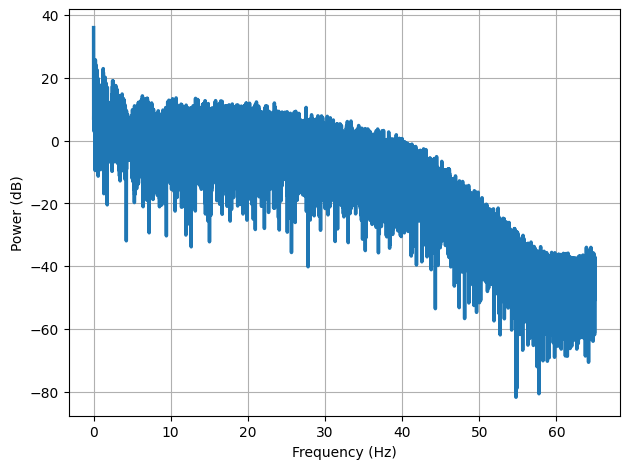

(H)036_20230506_125632_H10.csv
54604


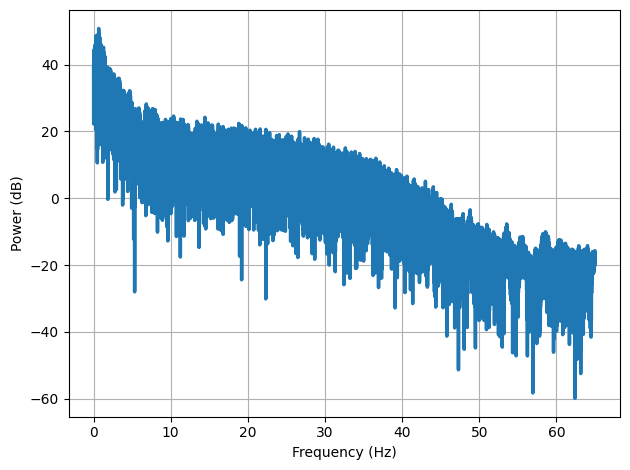

(H)037_20230506_123958_H10.csv
54677


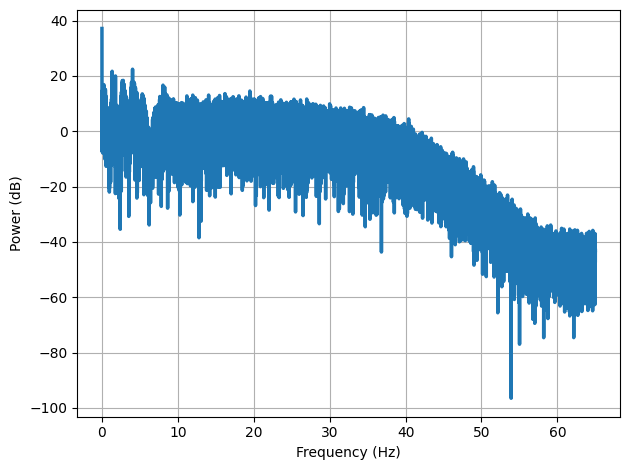

(H)039_20230506_122927_H10.csv
54677


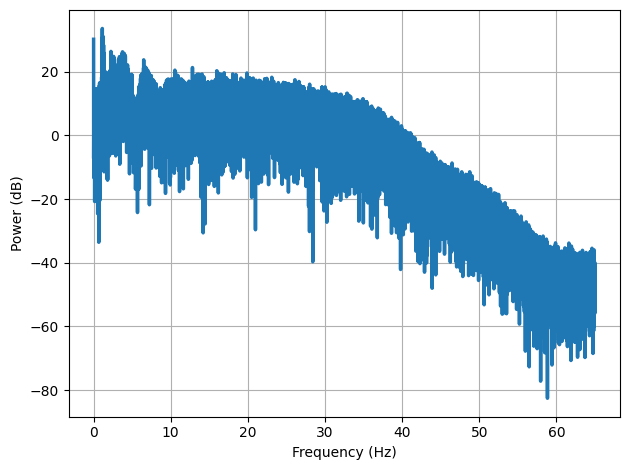

In [12]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    out = biosppy.plotting.plot_spectrum(signal = signal, sampling_rate = 130)

(H)021_20230506_091434_H10.csv
56356


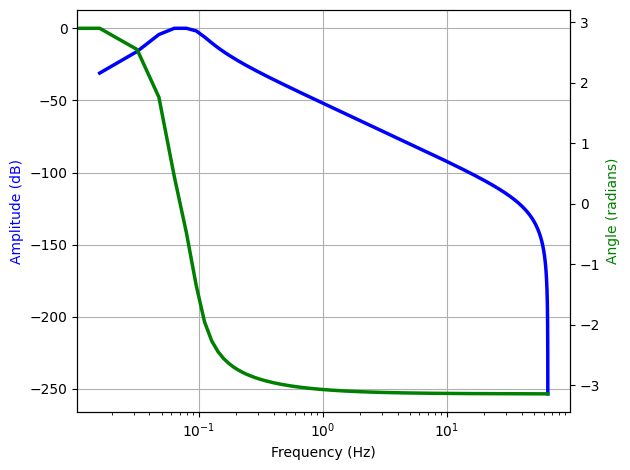

(H)022_20230506_090752_H10.csv
54604


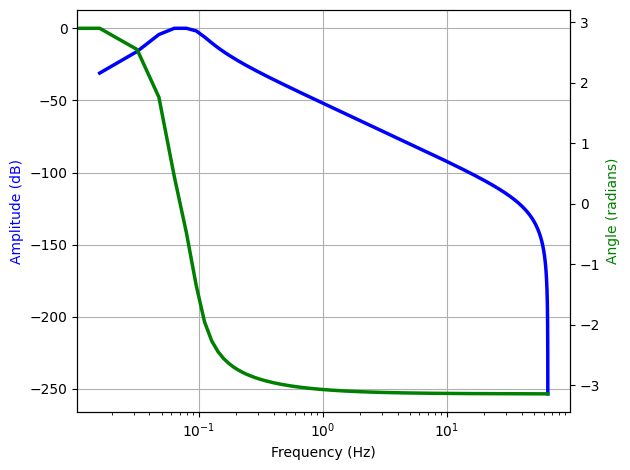

(H)023_20230506_091654_H10.csv
54750


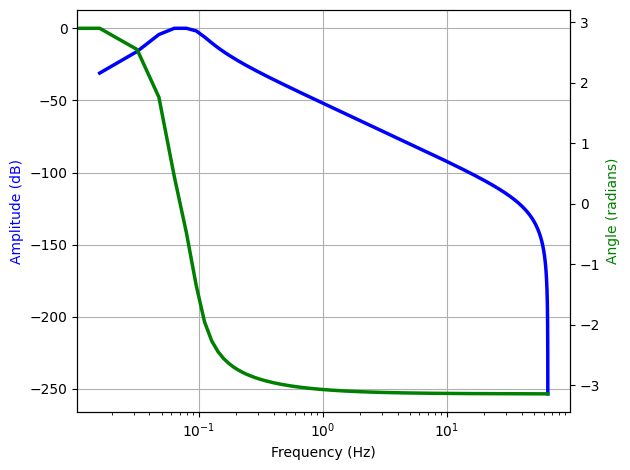

(H)024_20230506_101829_H10.csv
54823


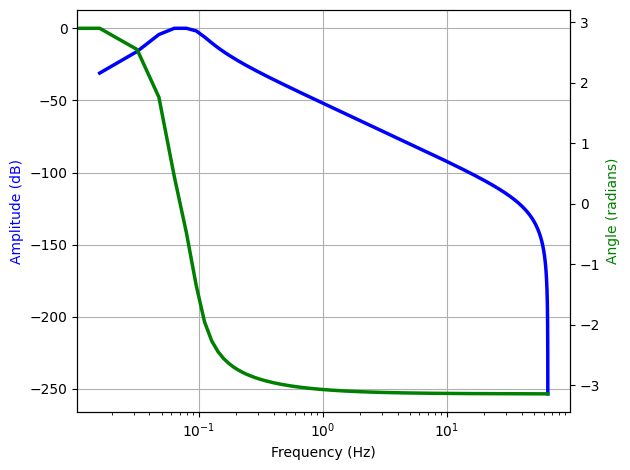

(H)025_20230506_105034_H10.csv
53874


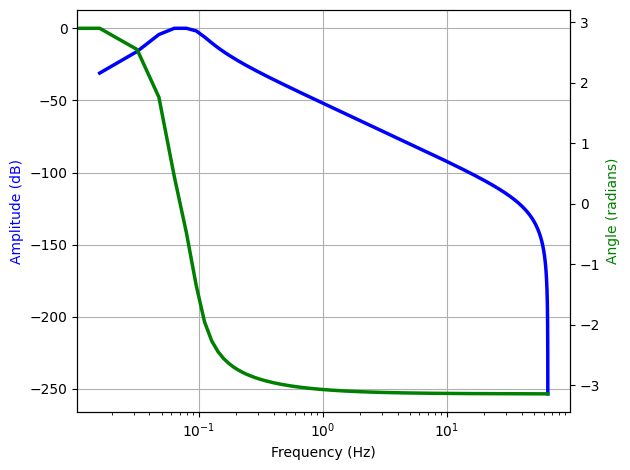

(H)026_20230506_100534_H10.csv
54604


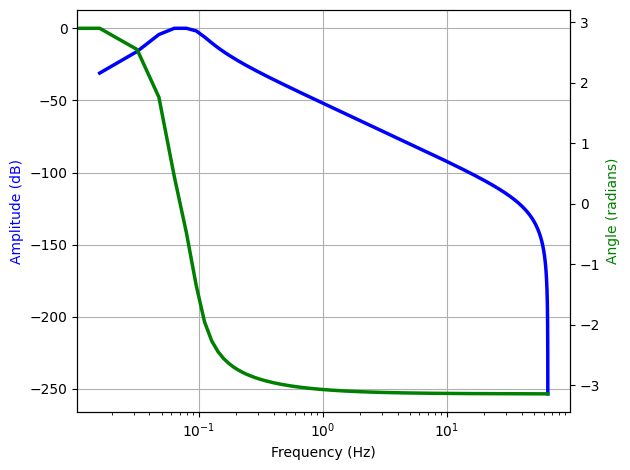

(H)027_20230506_103109_H10.csv
54750


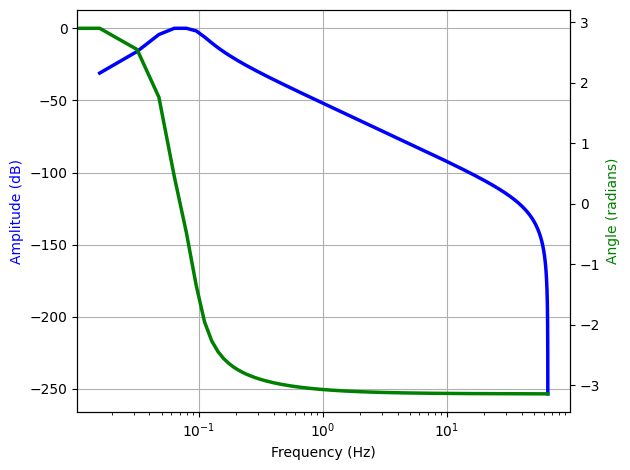

(H)028_20230506_103256_H10.csv
54604


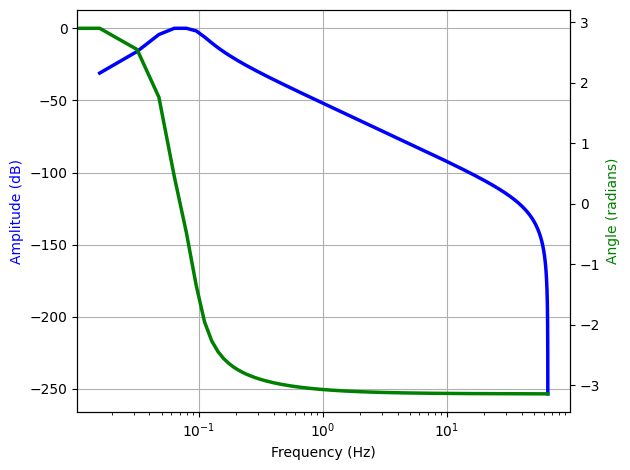

(H)029_20230506_110428_H10.csv
54604


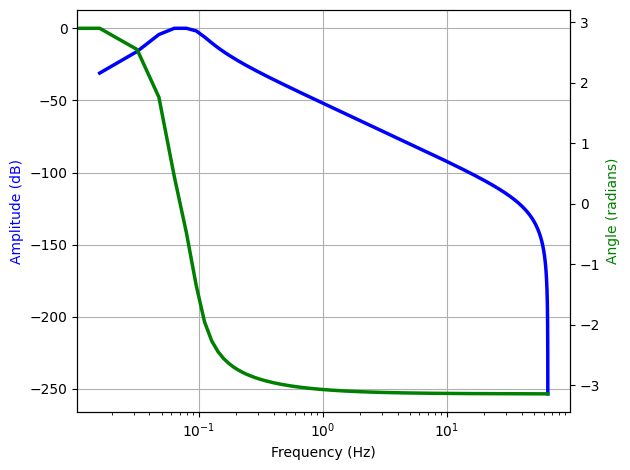

(H)030_20230506_111835_H10.csv
55115


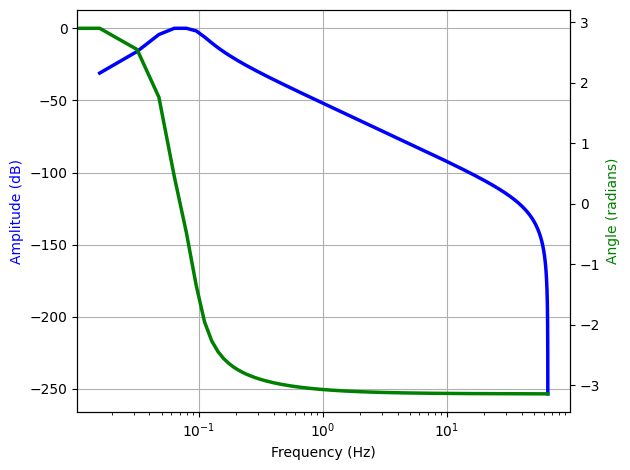

(H)031_20230506_115214_H10.csv
54604


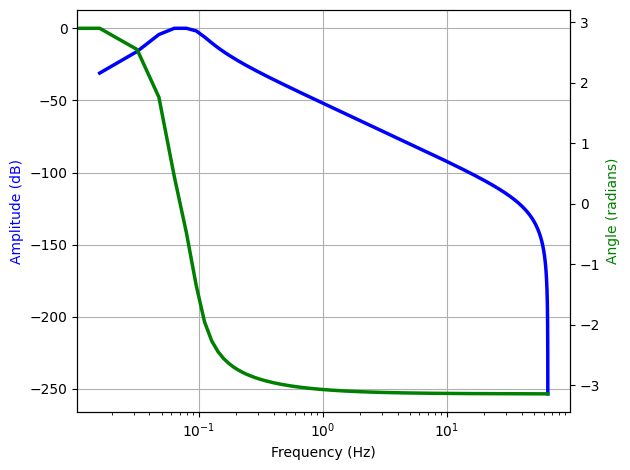

(H)032_20230506_110936_H10.csv
54677


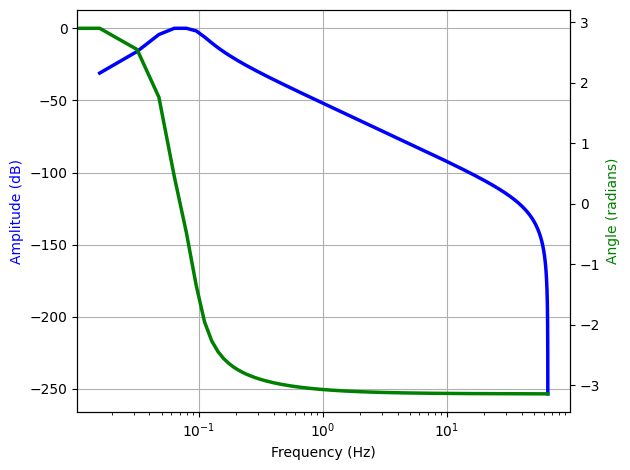

(H)033_20230506_113121_H10.csv
54677


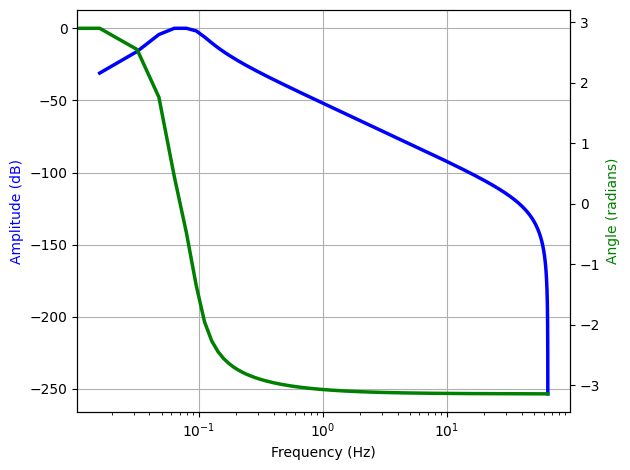

(H)034_20230506_113727_H10.csv
54604


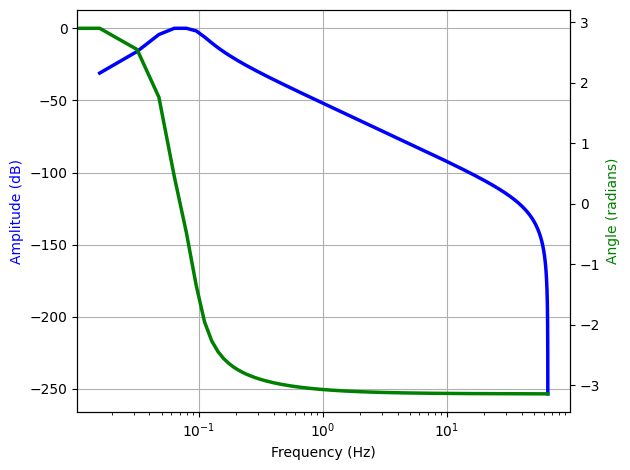

(H)035_20230506_120250_H10.csv
54677


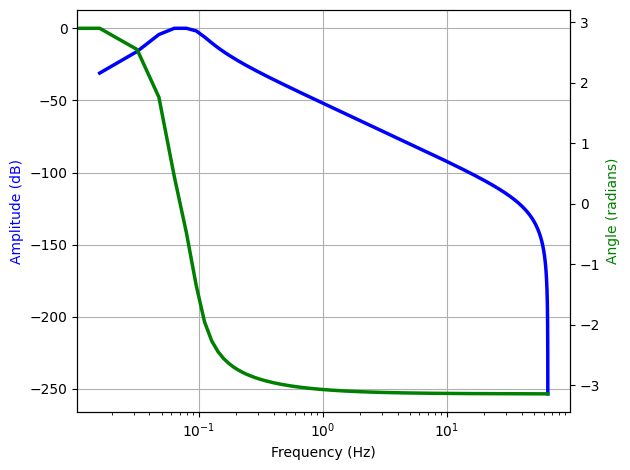

(H)036_20230506_125632_H10.csv
54604


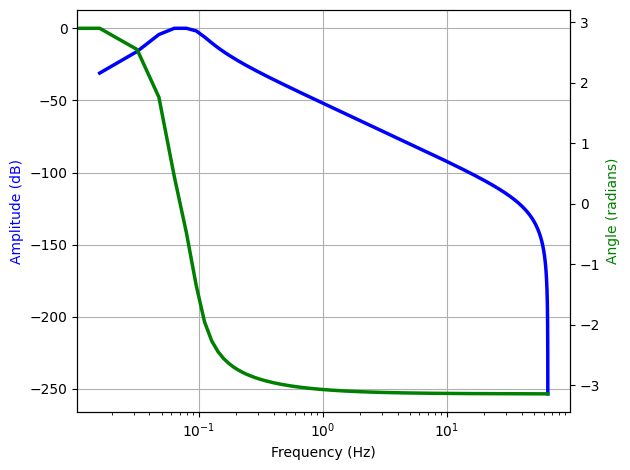

(H)037_20230506_123958_H10.csv
54677


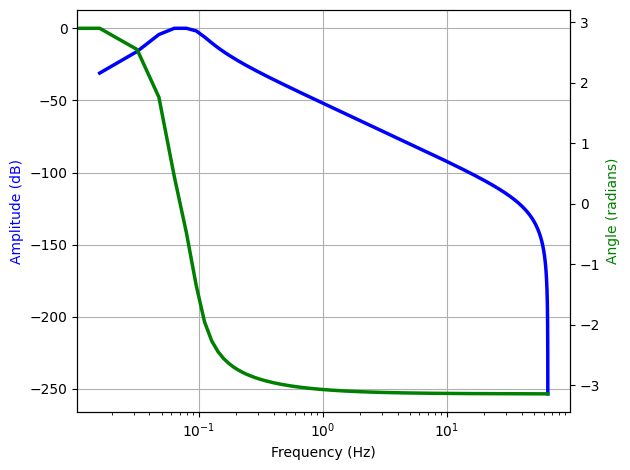

(H)039_20230506_122927_H10.csv
54677


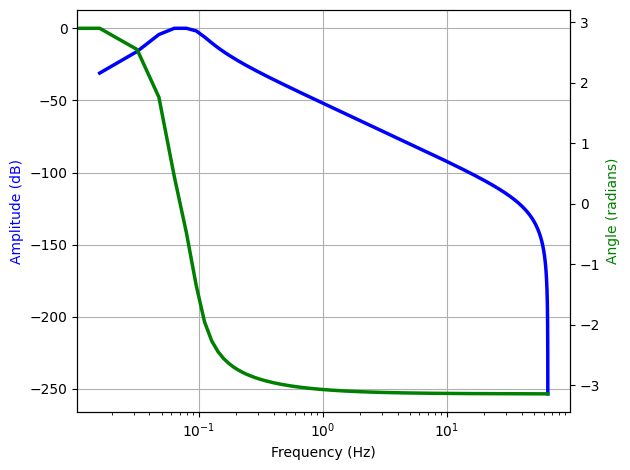

In [13]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    out = biosppy.plotting.plot_filter(ftype='butter', 
                                       band='bandpass', 
                                       order=2, 
                                       frequency= [0.05, 0.1], 
                                       sampling_rate = 130)

In [14]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    signal, rpeaks = biosppy.signals.ecg.ecg(signal= signal, 
                                             sampling_rate = 130, 
                                             show=False)[1:3]
    nni = tools.nn_intervals(rpeaks)
    # print(rpeaks)
    # print(nni)
    # print(len(nni))

(H)021_20230506_091434_H10.csv
56356
(H)022_20230506_090752_H10.csv
54604
(H)023_20230506_091654_H10.csv
54750
(H)024_20230506_101829_H10.csv
54823
(H)025_20230506_105034_H10.csv
53874
(H)026_20230506_100534_H10.csv
54604
(H)027_20230506_103109_H10.csv
54750
(H)028_20230506_103256_H10.csv
54604
(H)029_20230506_110428_H10.csv
54604
(H)030_20230506_111835_H10.csv
55115
(H)031_20230506_115214_H10.csv
54604
(H)032_20230506_110936_H10.csv
54677
(H)033_20230506_113121_H10.csv
54677
(H)034_20230506_113727_H10.csv
54604
(H)035_20230506_120250_H10.csv
54677
(H)036_20230506_125632_H10.csv
54604
(H)037_20230506_123958_H10.csv
54677
(H)039_20230506_122927_H10.csv
54677


(H)021_20230506_091434_H10.csv
56356


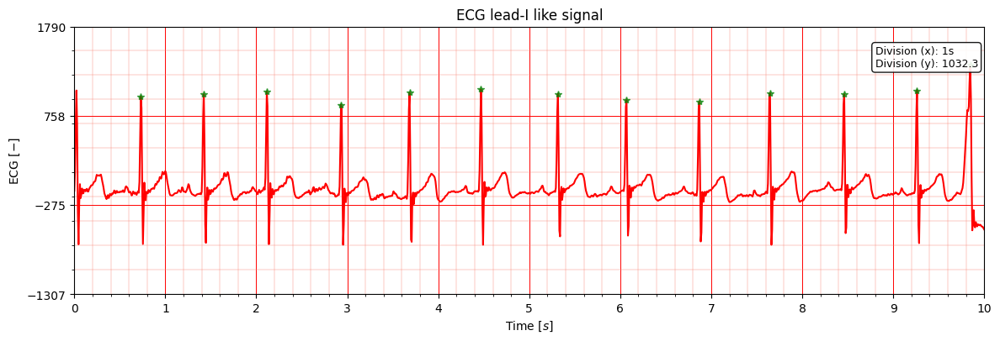

(H)022_20230506_090752_H10.csv
54604


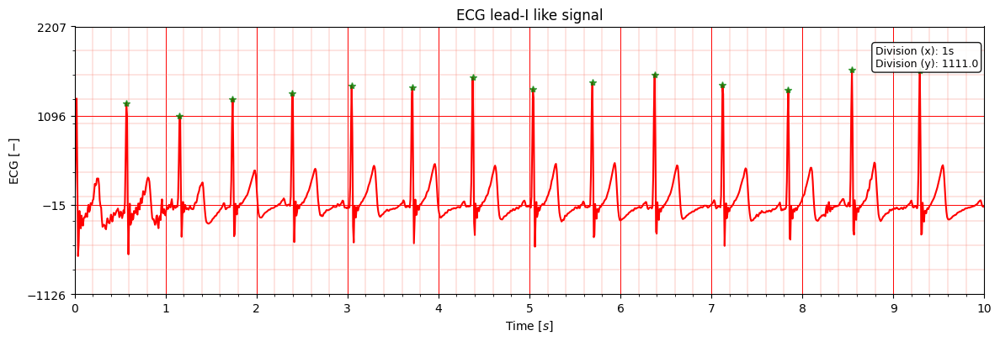

(H)023_20230506_091654_H10.csv
54750


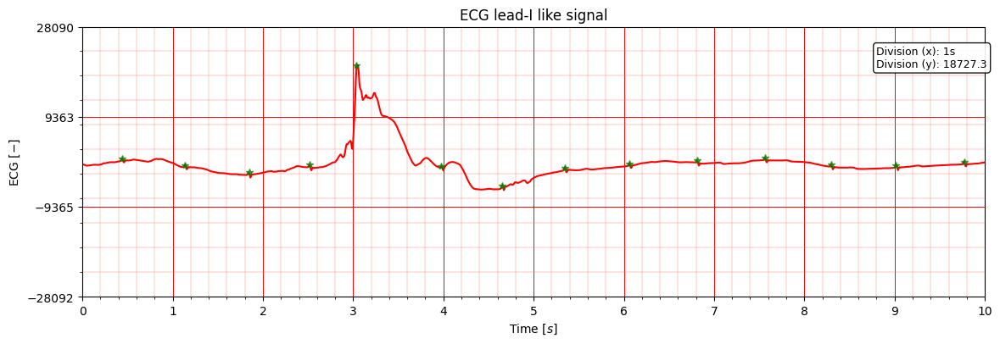

(H)024_20230506_101829_H10.csv
54823


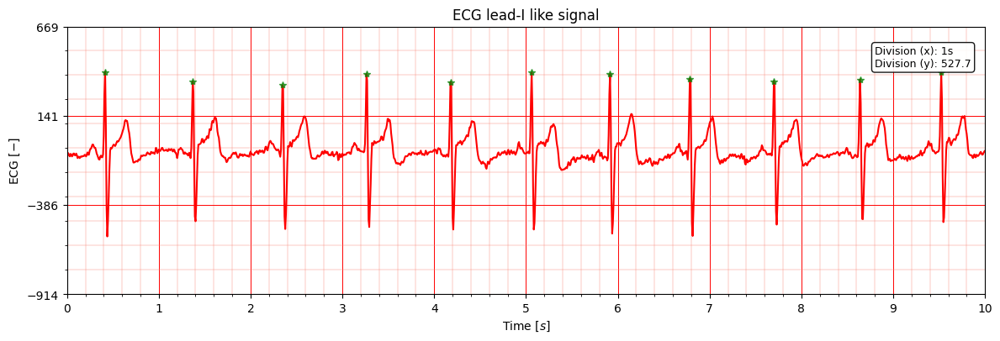

(H)025_20230506_105034_H10.csv
53874


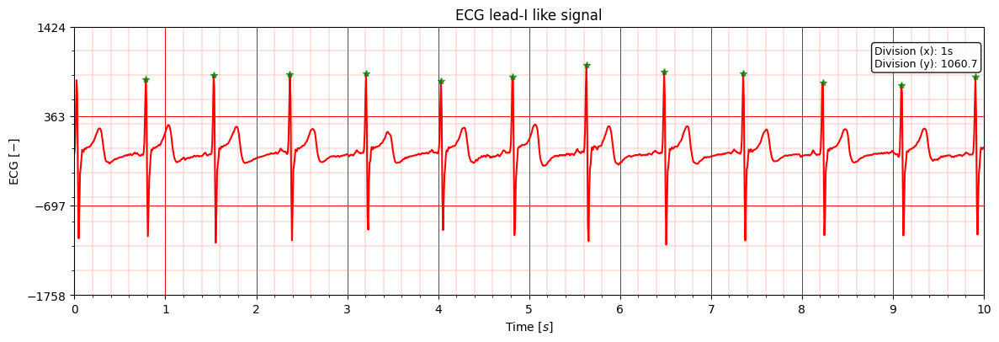

(H)026_20230506_100534_H10.csv
54604


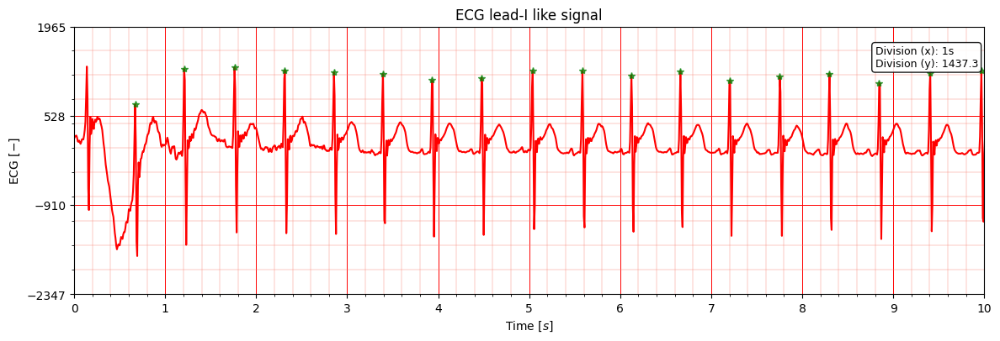

(H)027_20230506_103109_H10.csv
54750


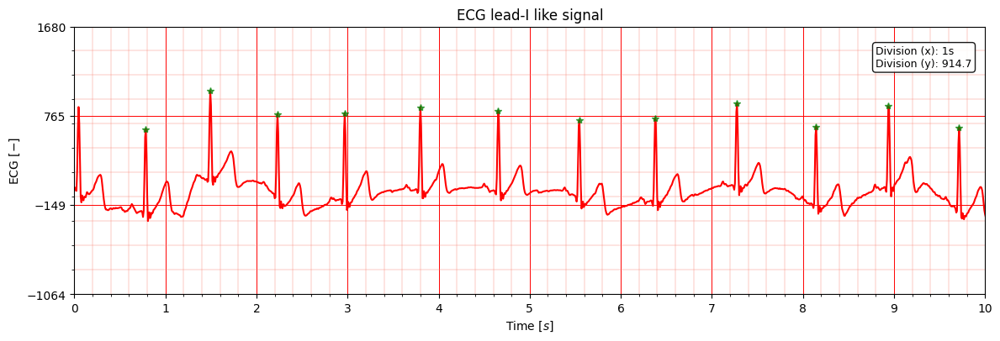

(H)028_20230506_103256_H10.csv
54604


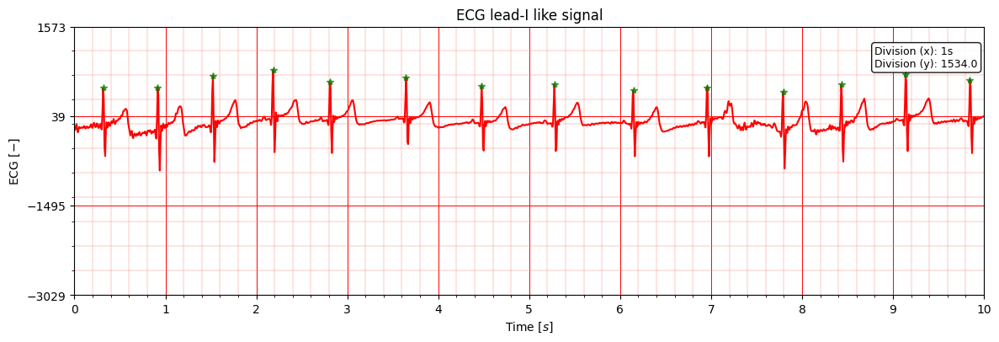

(H)029_20230506_110428_H10.csv
54604


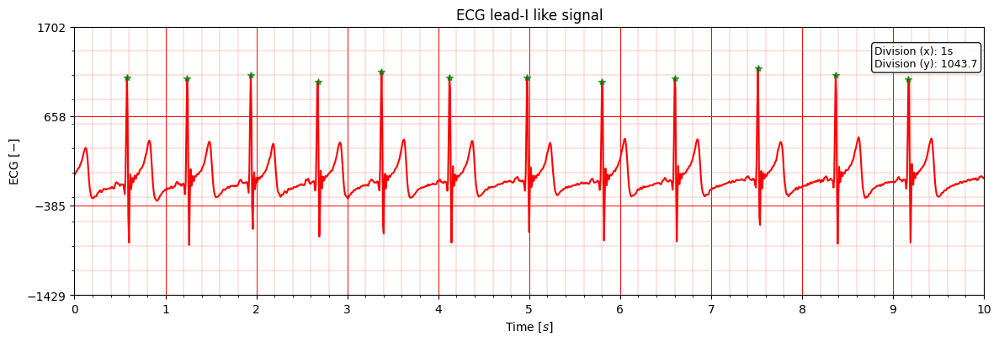

(H)030_20230506_111835_H10.csv
55115


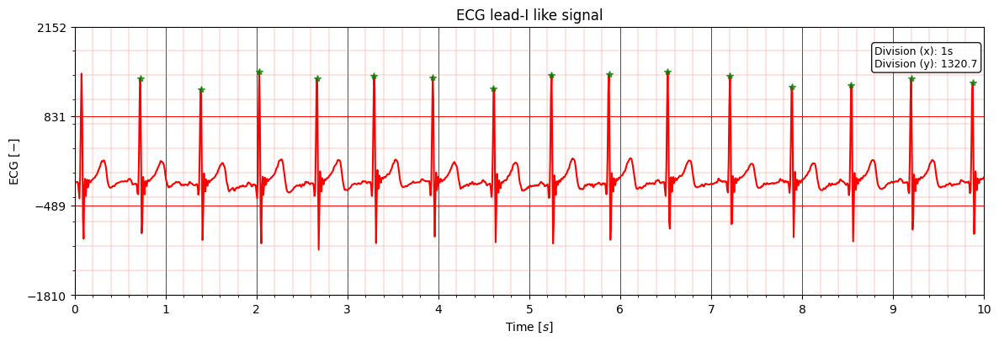

(H)031_20230506_115214_H10.csv
54604


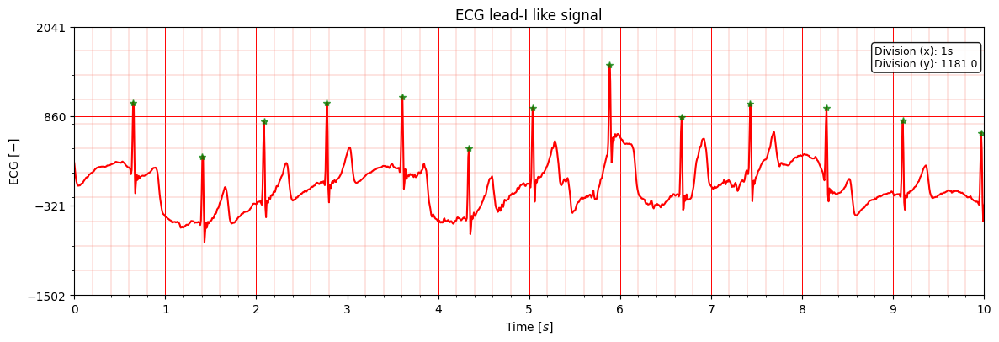

(H)032_20230506_110936_H10.csv
54677


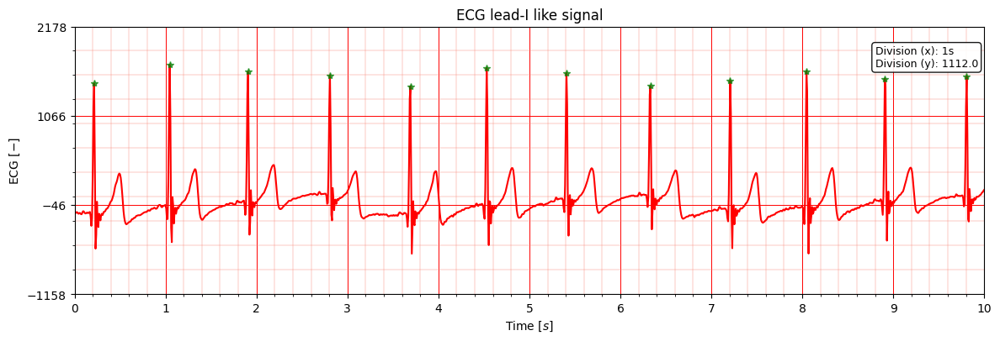

(H)033_20230506_113121_H10.csv
54677


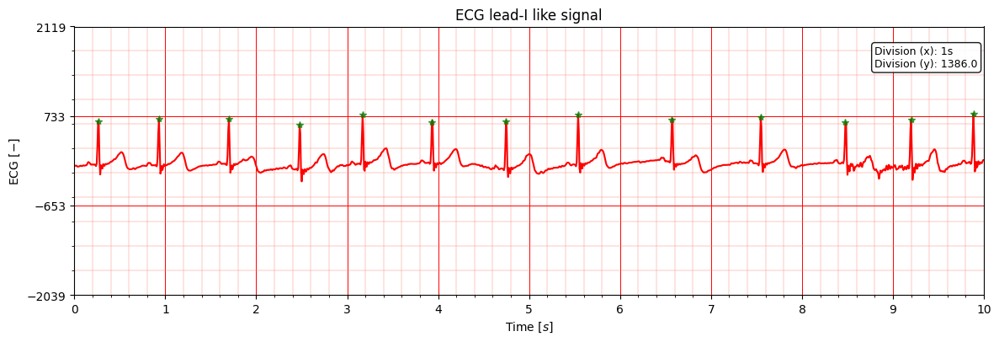

(H)034_20230506_113727_H10.csv
54604


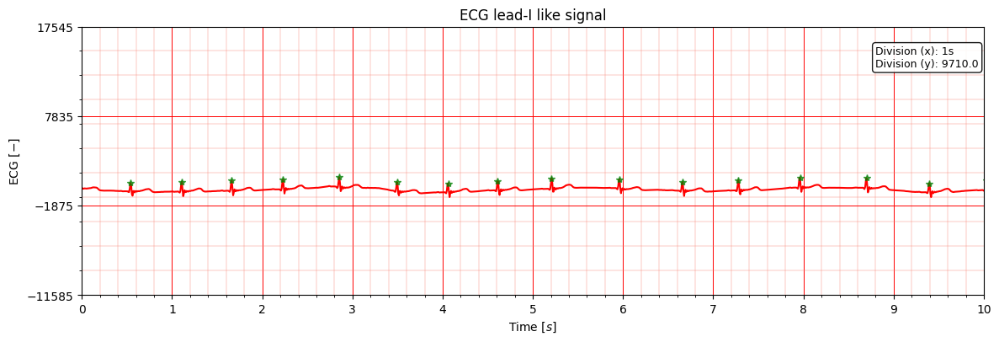

(H)035_20230506_120250_H10.csv
54677


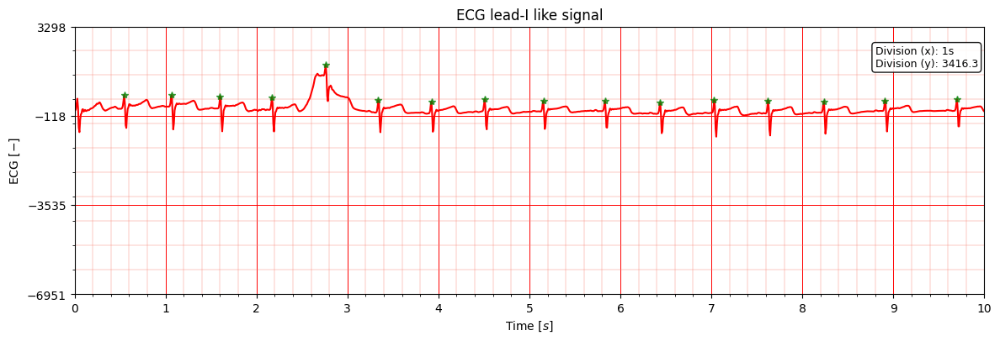

(H)036_20230506_125632_H10.csv
54604


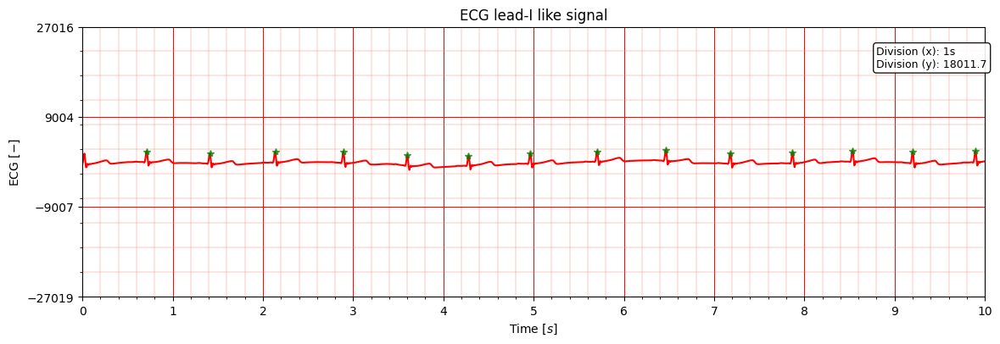

(H)037_20230506_123958_H10.csv
54677


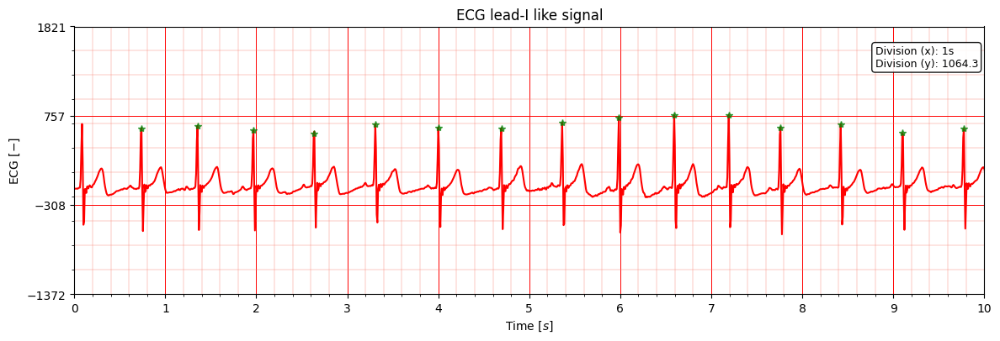

(H)039_20230506_122927_H10.csv
54677


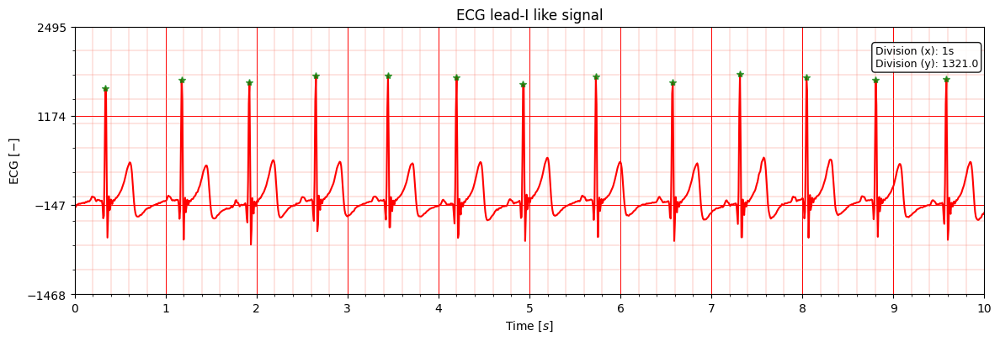

In [15]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    fig = tools.plot_ecg(signal = signal, sampling_rate = 130)

(H)021_20230506_091434_H10.csv
56356


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 56.153]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


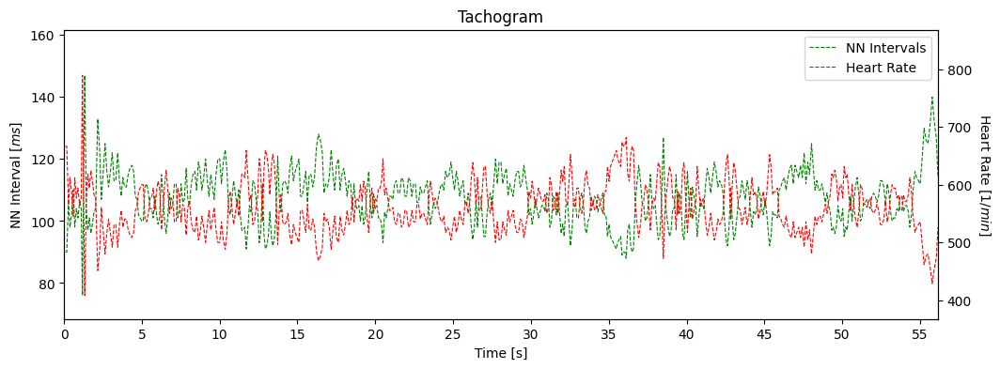

(H)022_20230506_090752_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.412]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


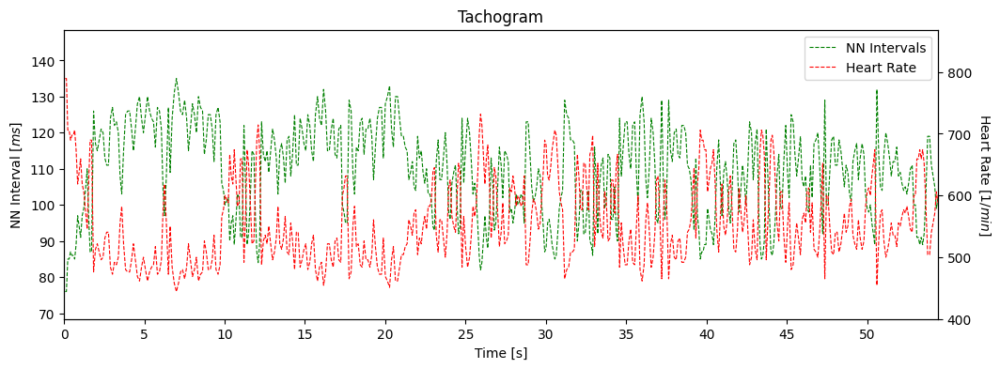

(H)023_20230506_091654_H10.csv
54750


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.566]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


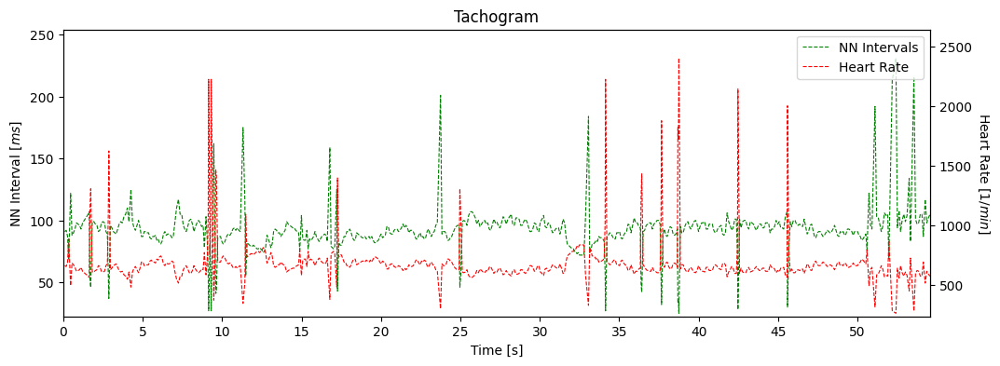

(H)024_20230506_101829_H10.csv
54823


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.712]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


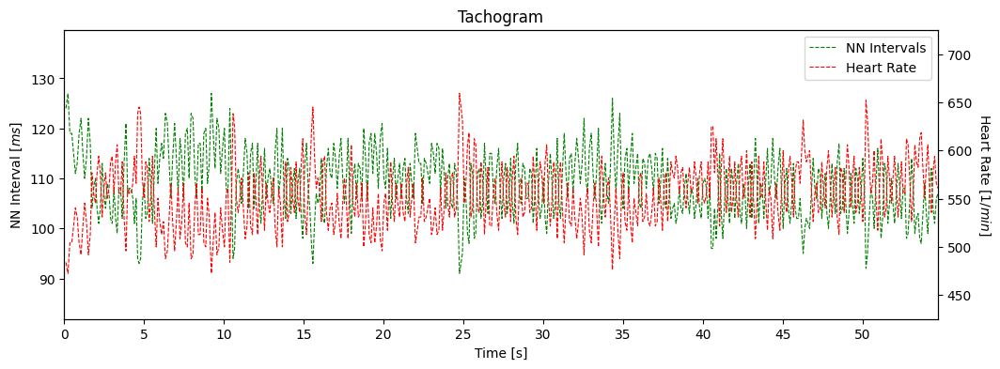

(H)025_20230506_105034_H10.csv
53874


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 53.659]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


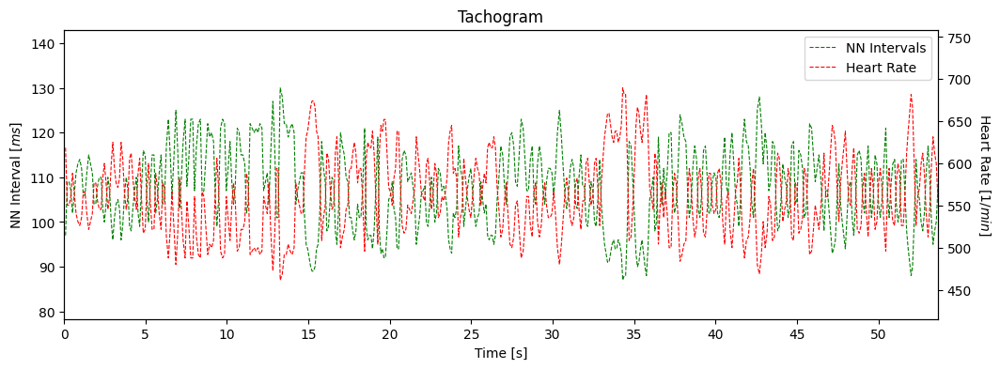

(H)026_20230506_100534_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.456]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


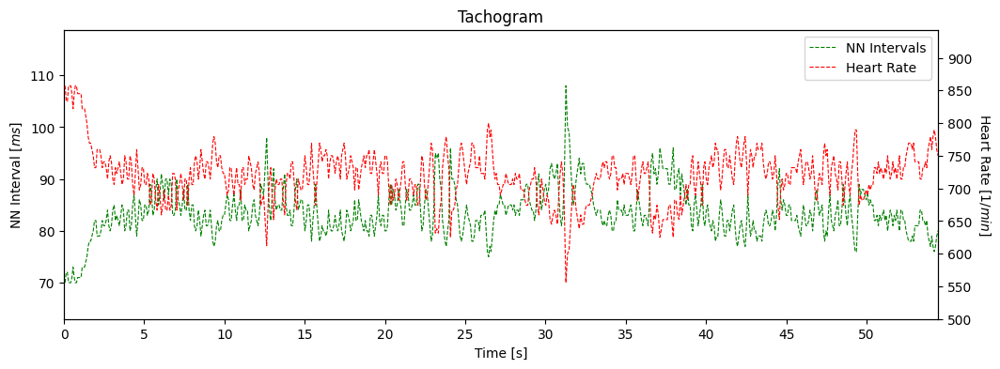

(H)027_20230506_103109_H10.csv
54750


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.565]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


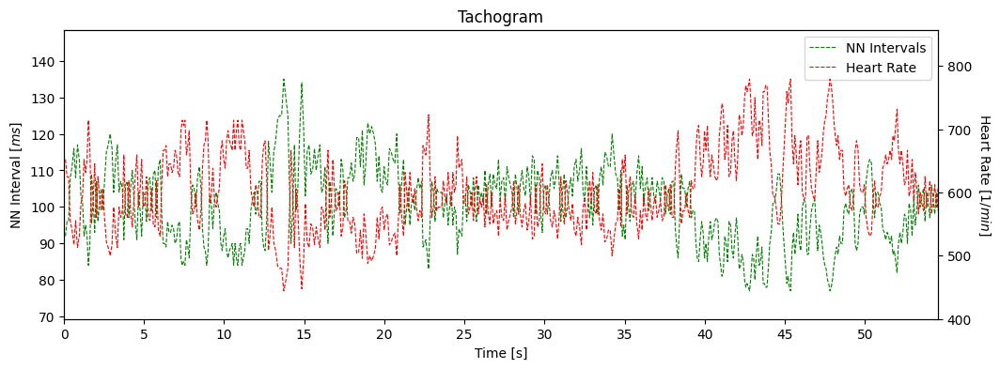

(H)028_20230506_103256_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.451]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


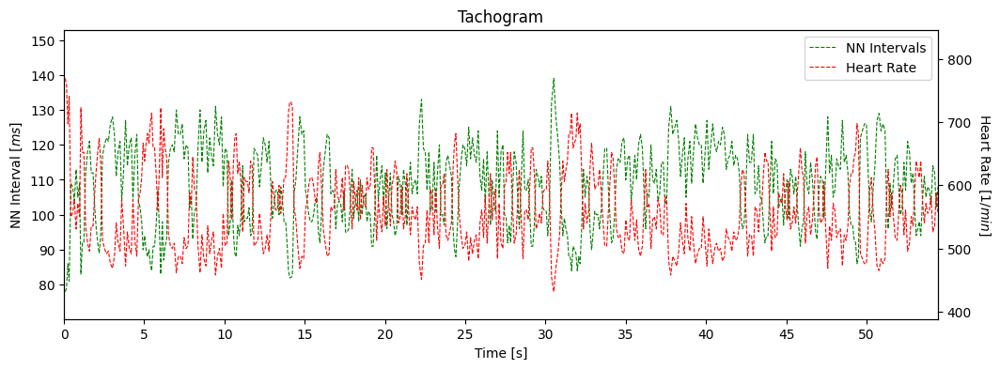

(H)029_20230506_110428_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.453]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


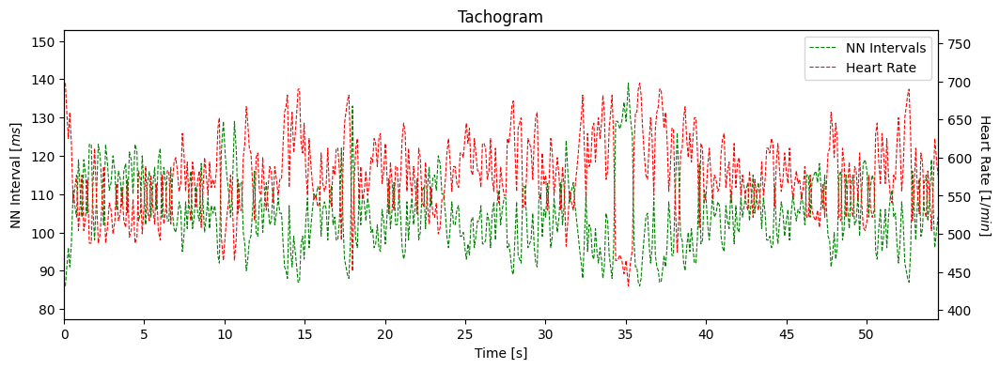

(H)030_20230506_111835_H10.csv
55115


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.933]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


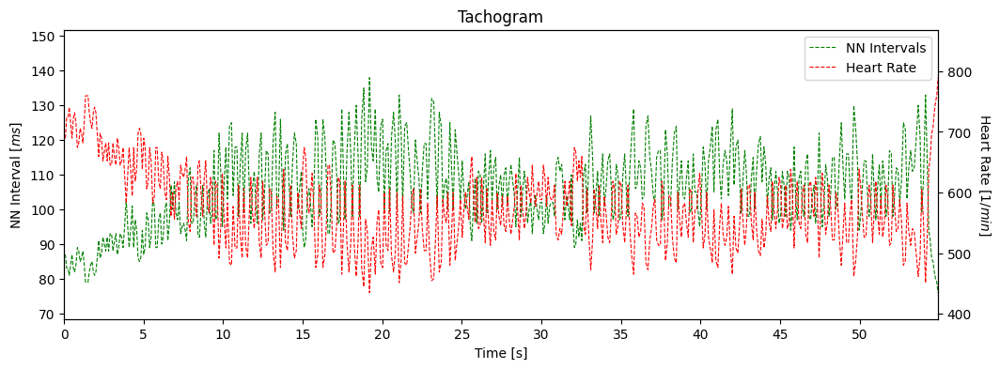

(H)031_20230506_115214_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.385]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


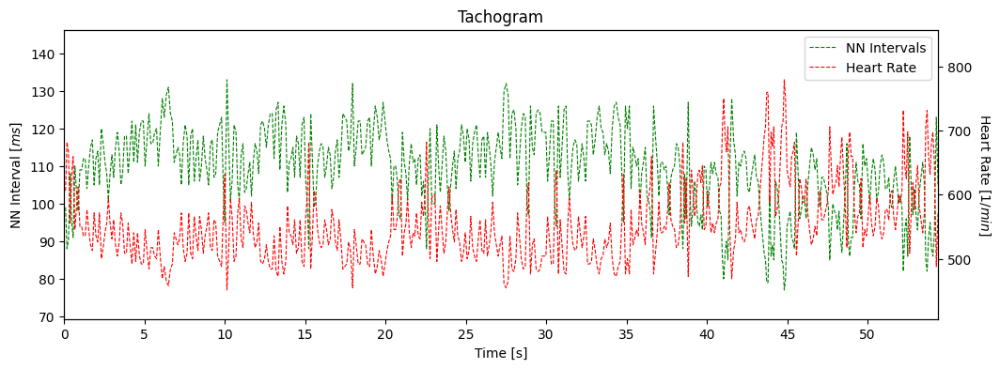

(H)032_20230506_110936_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.56]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


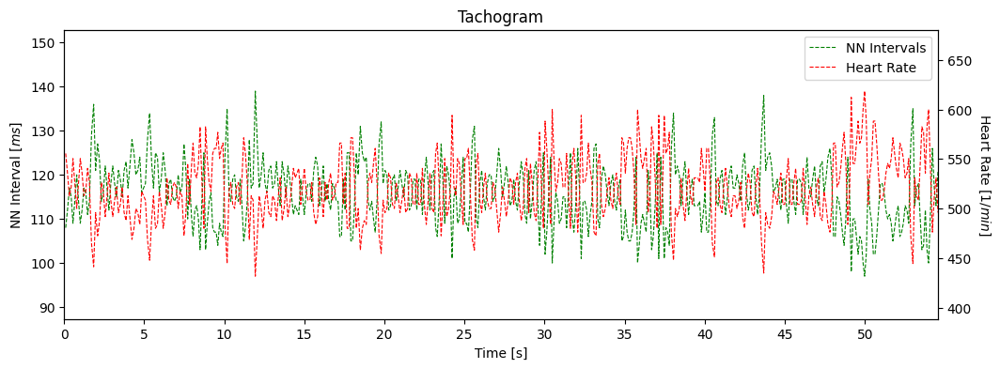

(H)033_20230506_113121_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.53]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


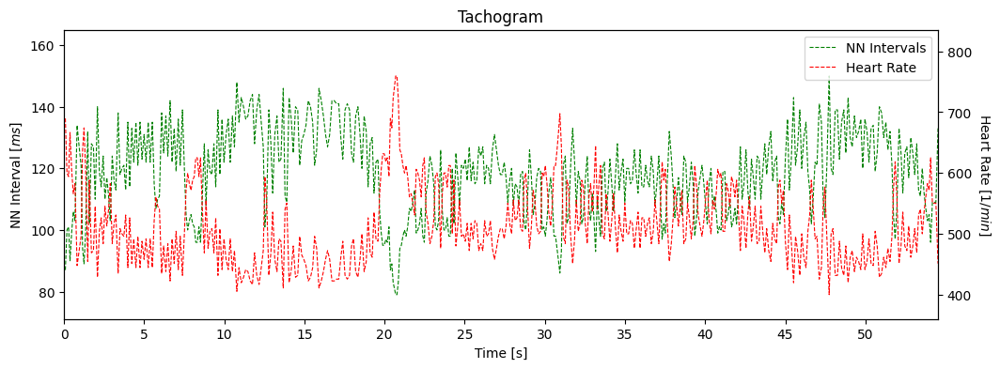

(H)034_20230506_113727_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.414]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


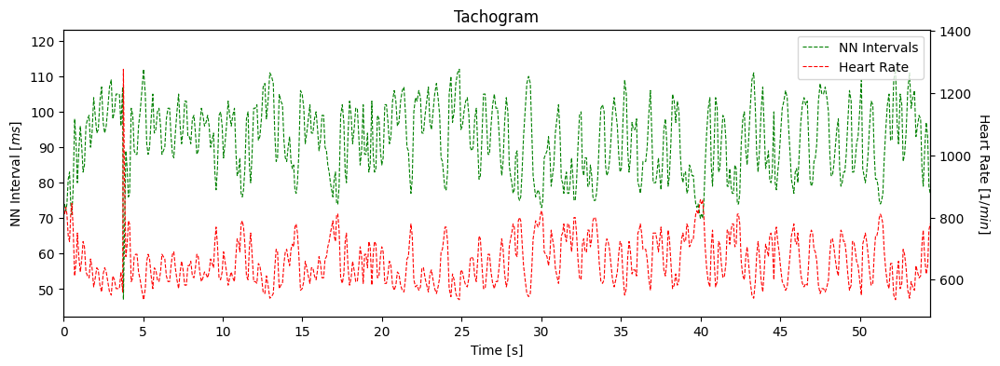

(H)035_20230506_120250_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.506]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


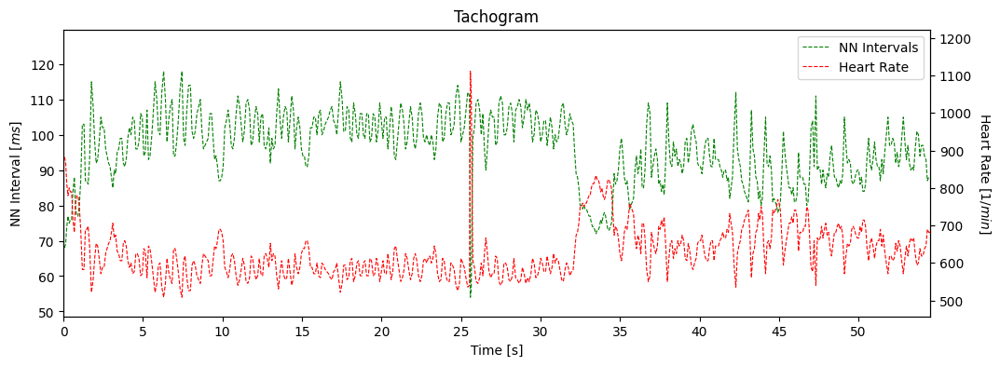

(H)036_20230506_125632_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.427]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


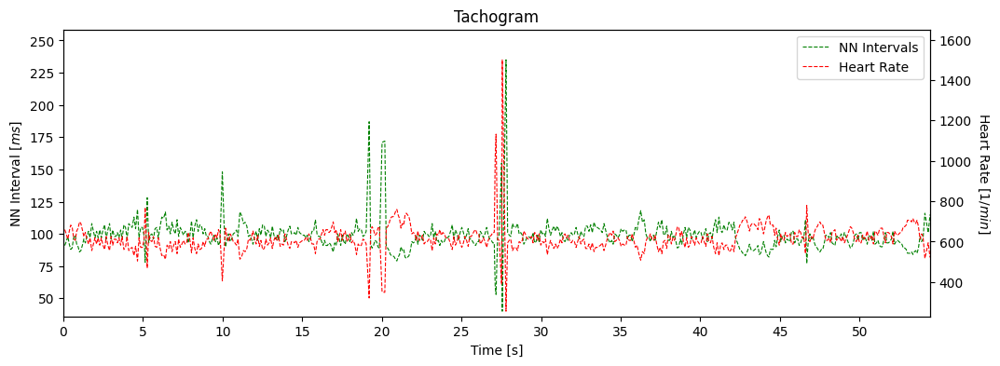

(H)037_20230506_123958_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.519]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


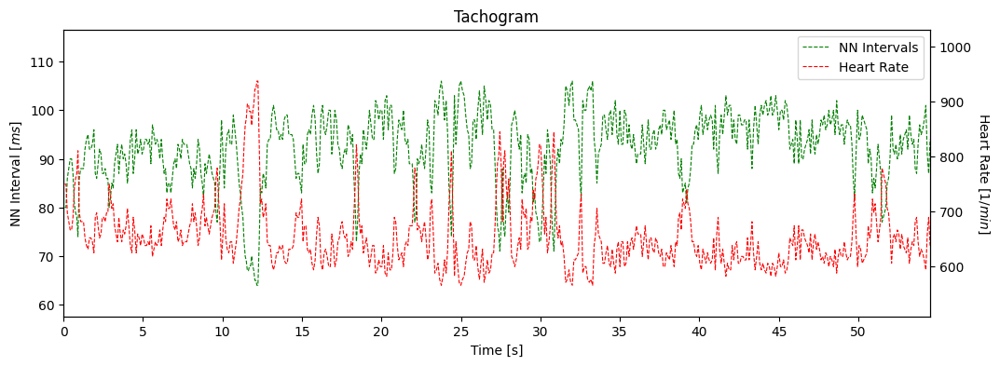

(H)039_20230506_122927_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/tools.py:375: UserWarning: Interval limits out of boundaries. Interval set to: [0, 54.54]
  interval = pyhrv.utils.check_interval(interval, limits=[0, t[-1]], default=[0, 10])


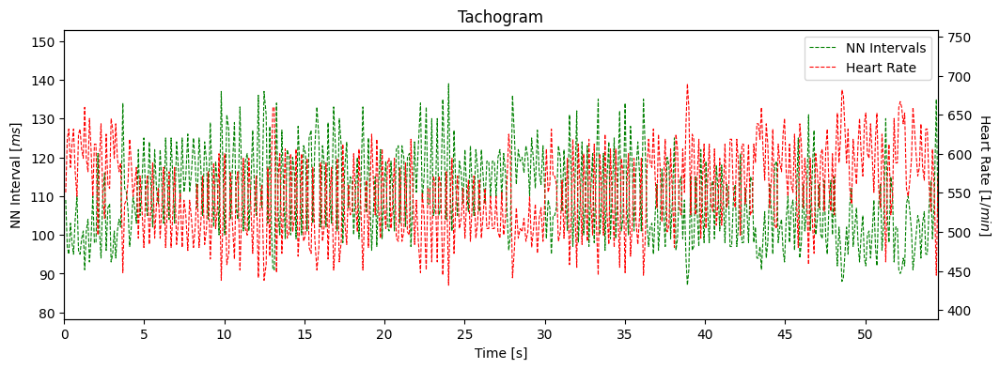

In [16]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    signal, rpeaks = biosppy.signals.ecg.ecg(signal= signal, sampling_rate = 130, show=False)[1:3]
    nni = tools.nn_intervals(rpeaks)
    try:
        tools.tachogram(signal = signal, 
                    nni = nni, 
                    rpeaks = rpeaks, 
                    sampling_rate = 130,
                    interval=[0, 600]
                   )
    except:
        print('fail')

(H)021_20230506_091434_H10.csv
56356


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


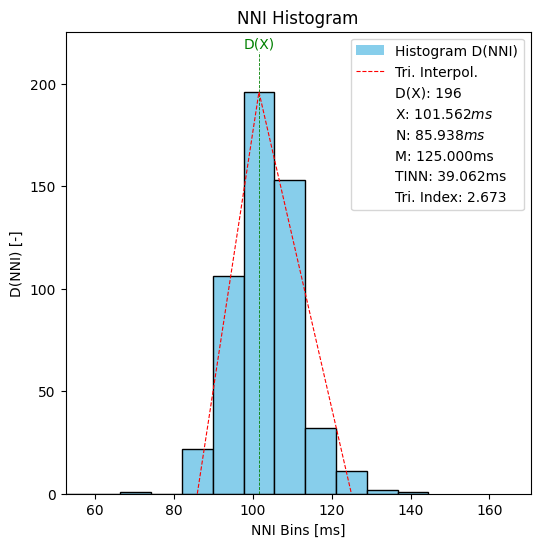

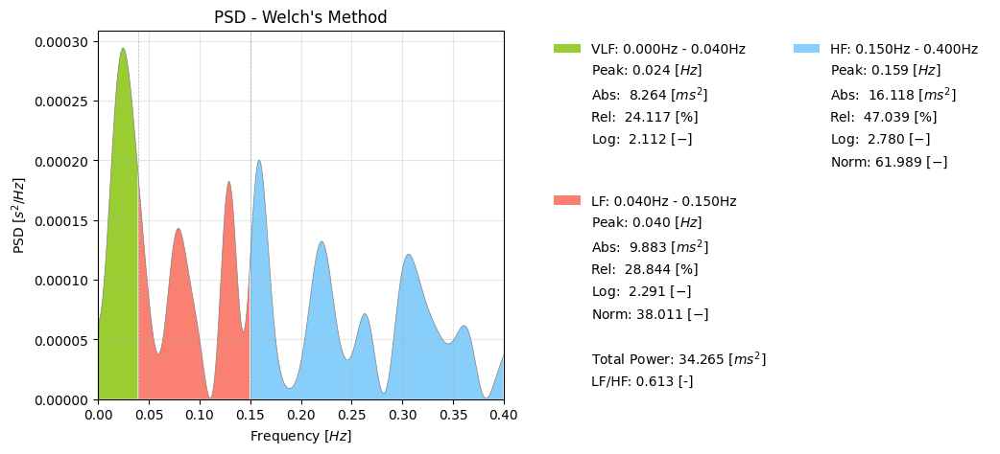

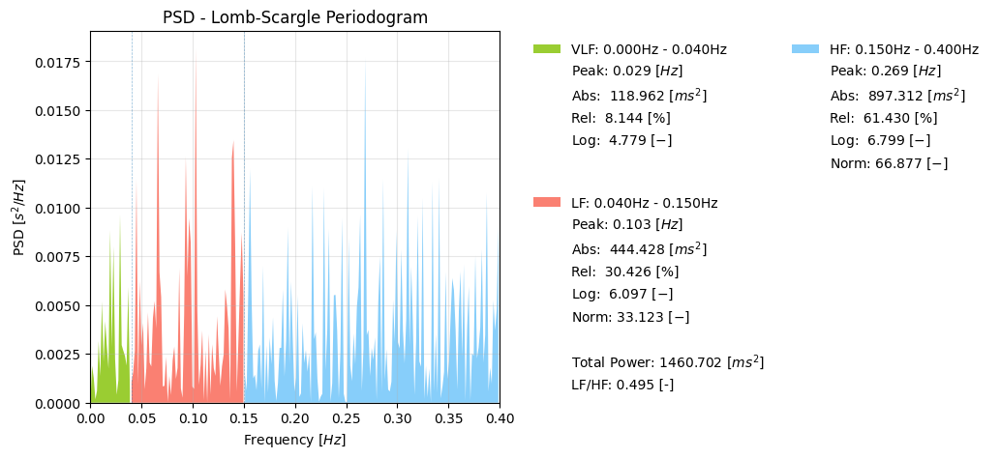

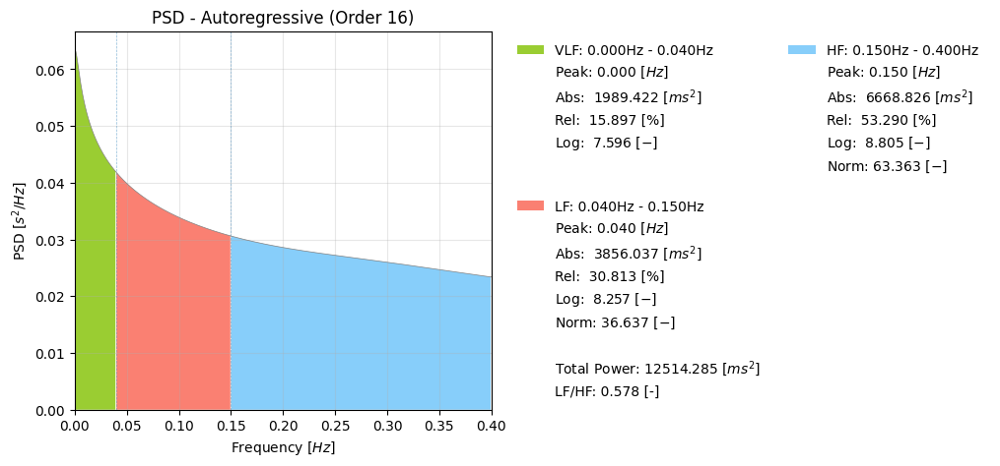

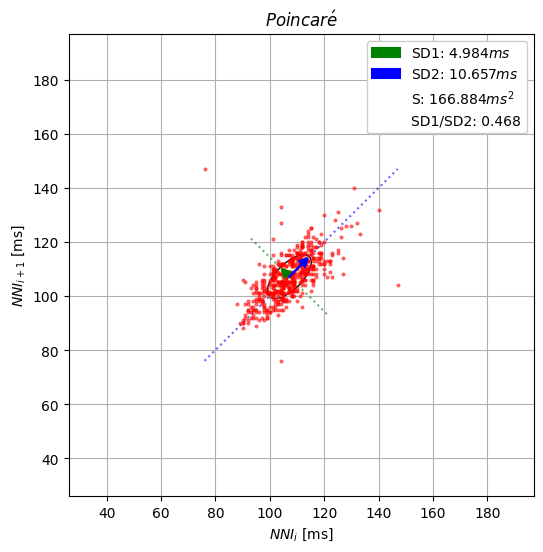

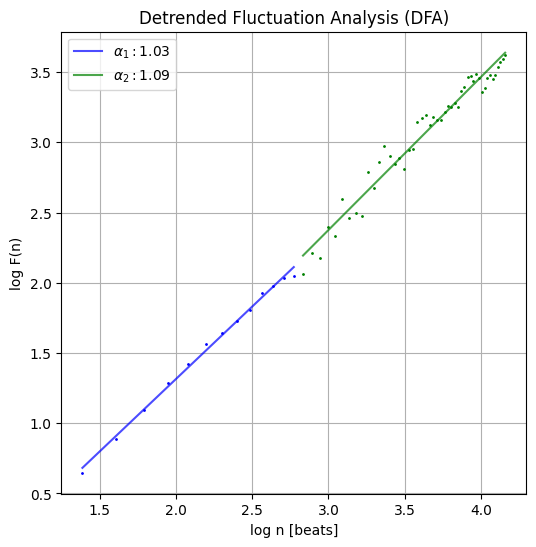

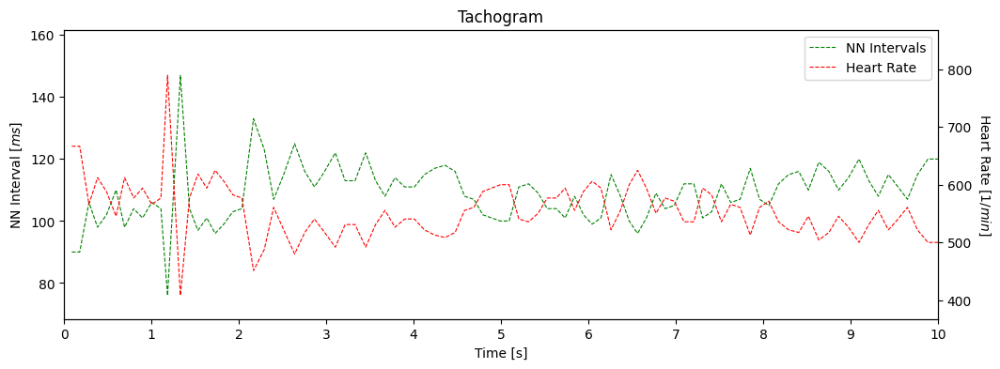

(H)022_20230506_090752_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


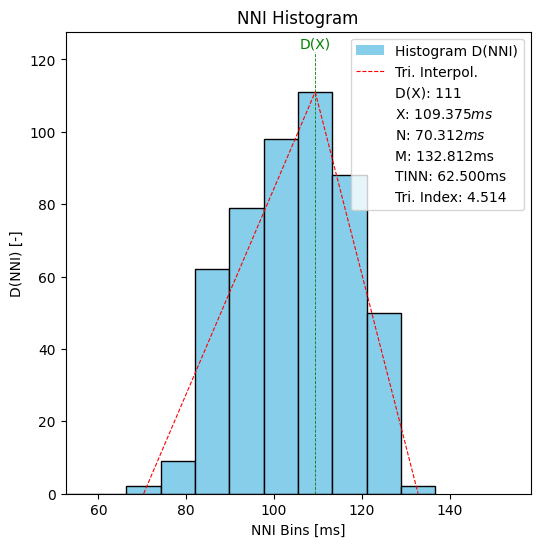

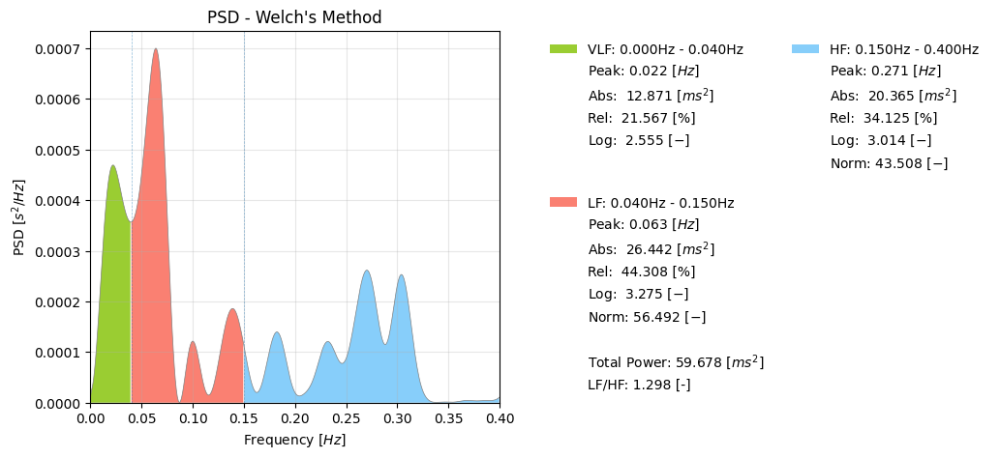

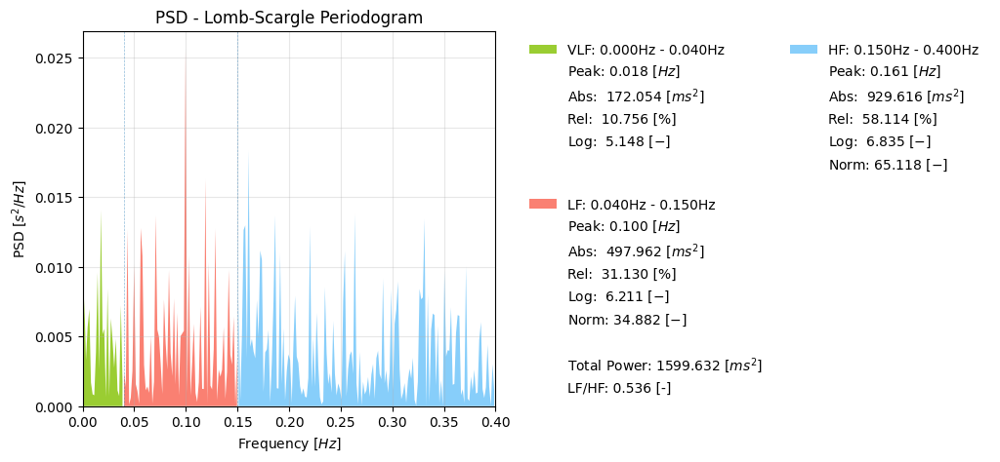

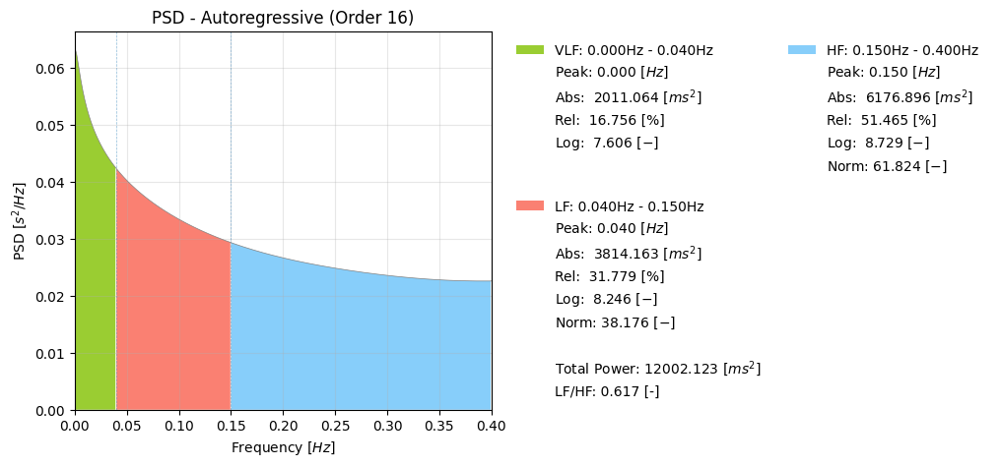

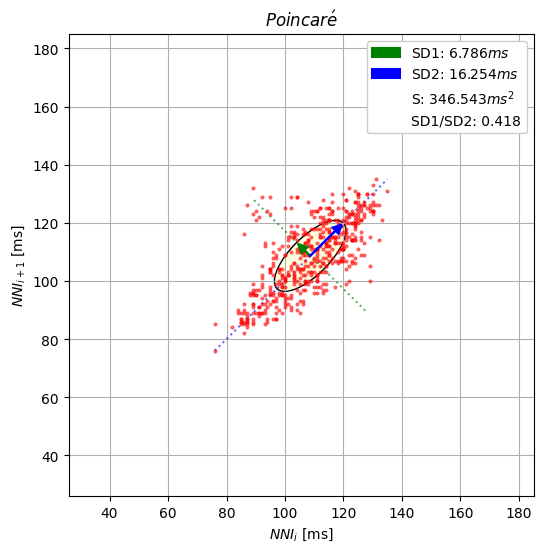

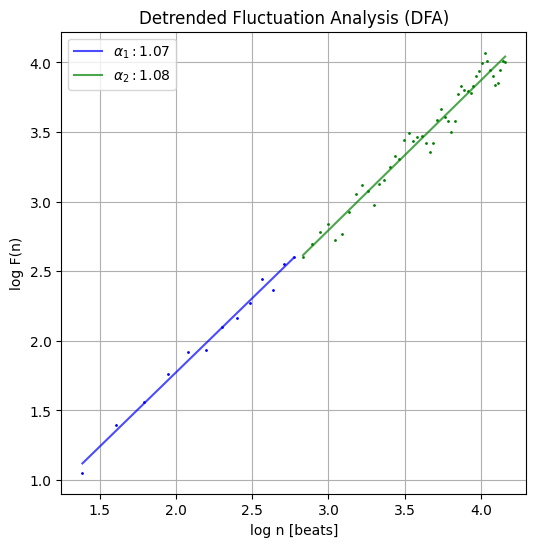

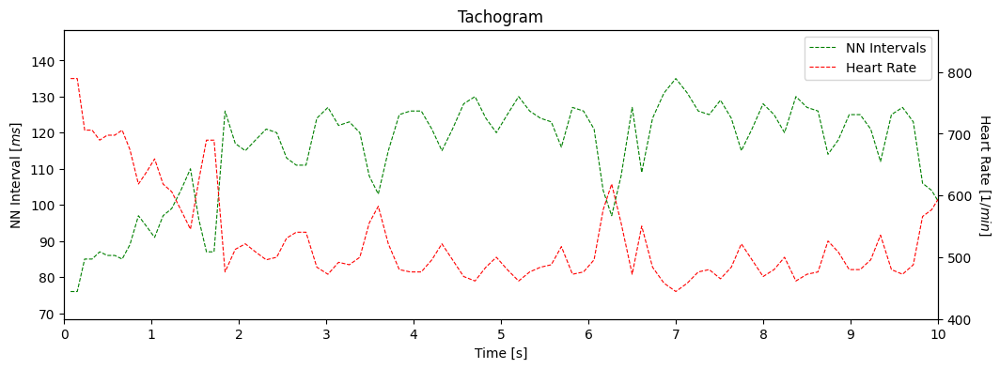

(H)023_20230506_091654_H10.csv
54750


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


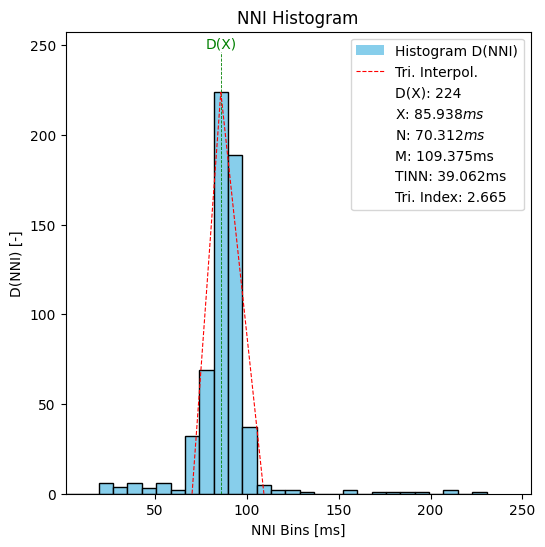

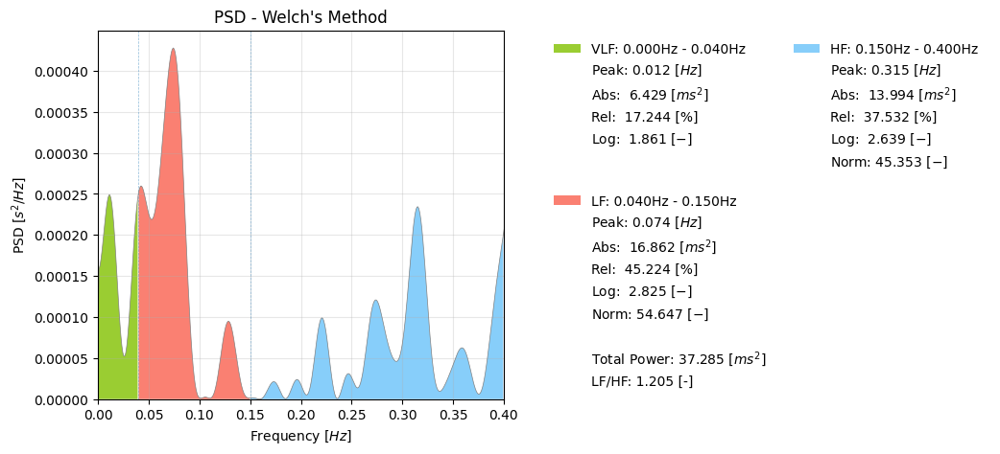

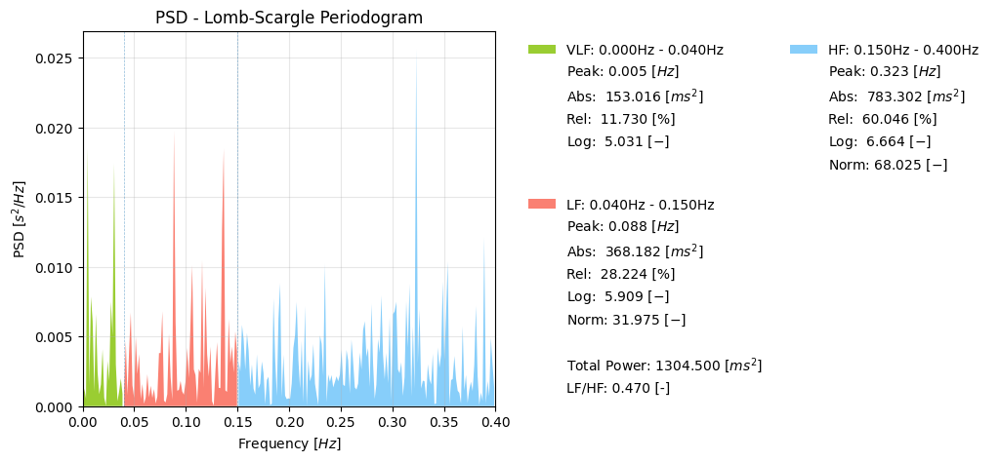

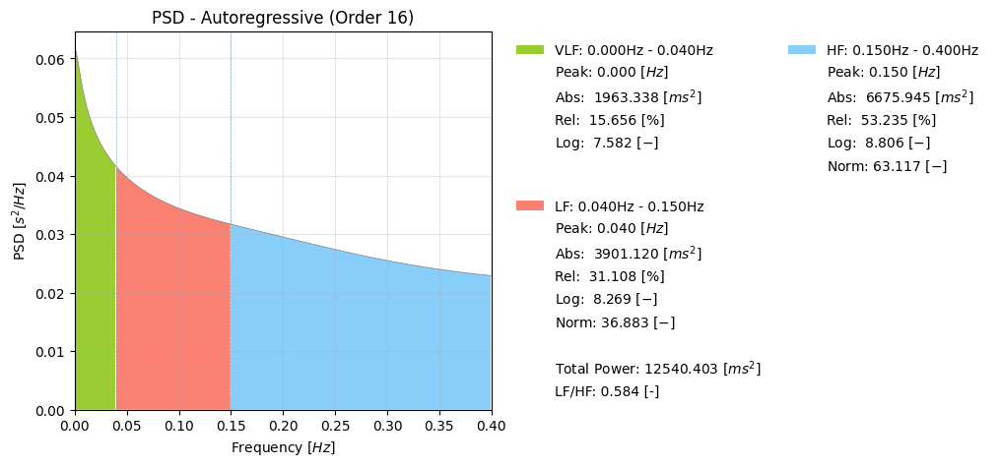

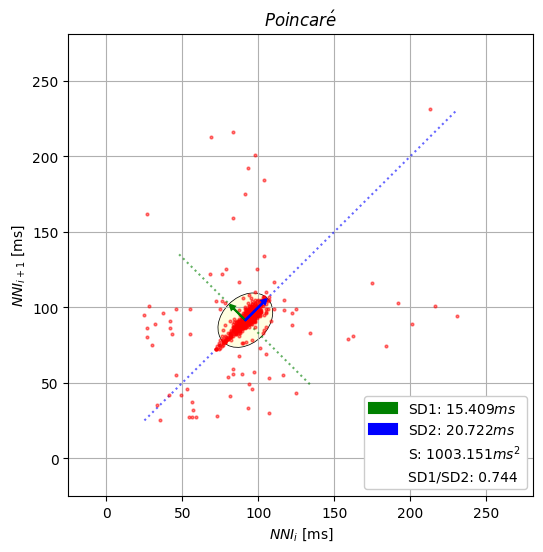

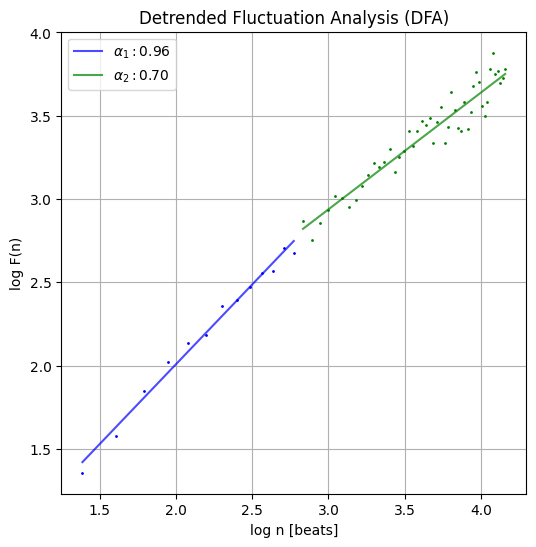

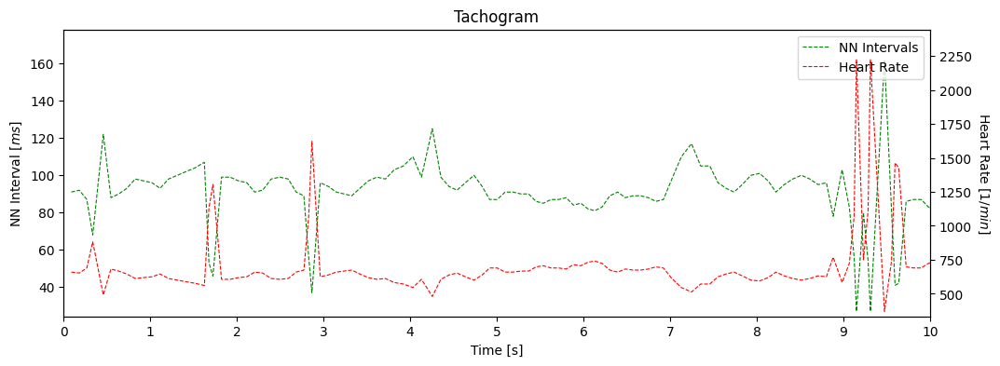

(H)024_20230506_101829_H10.csv
54823


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


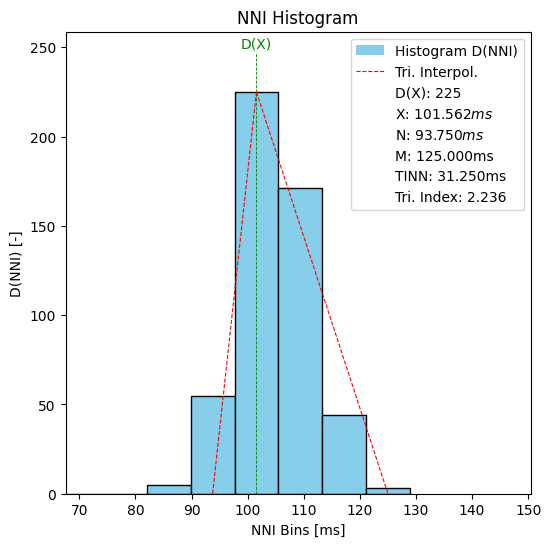

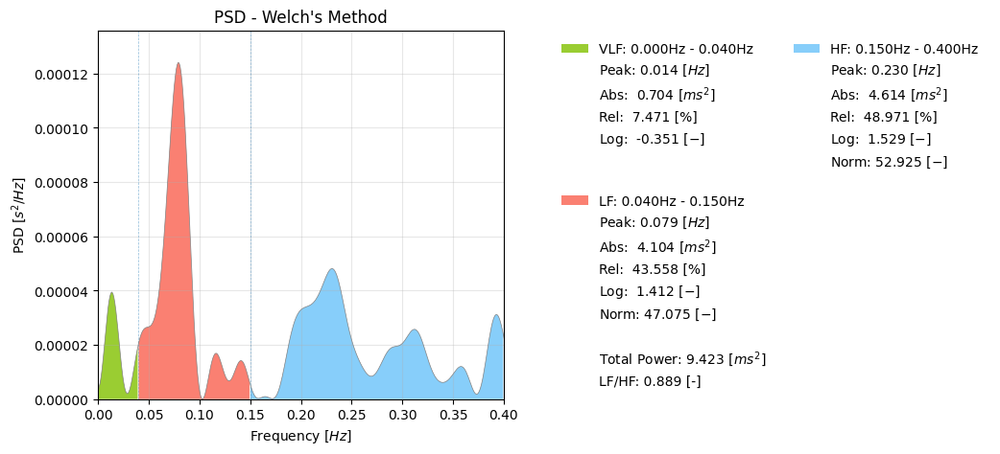

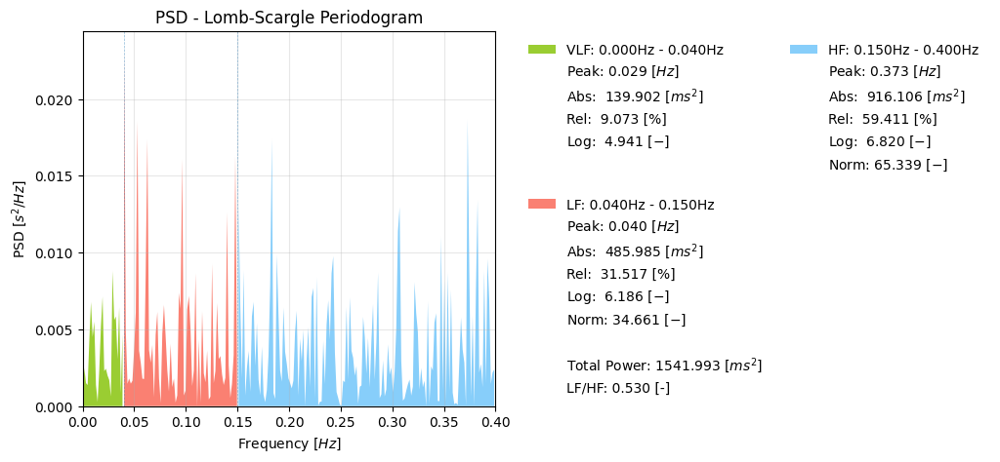

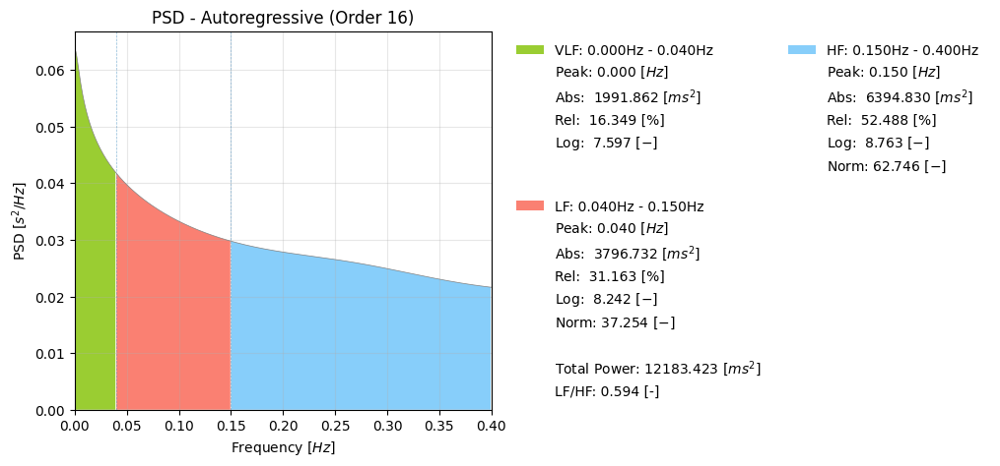

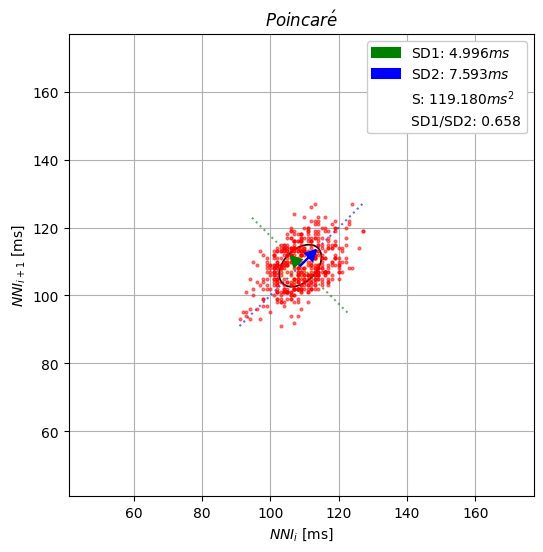

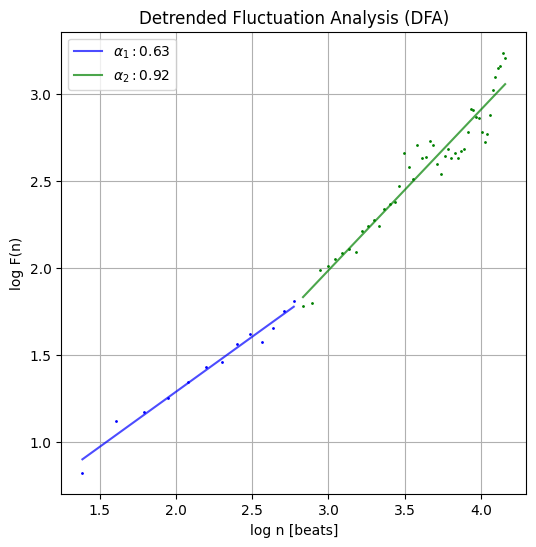

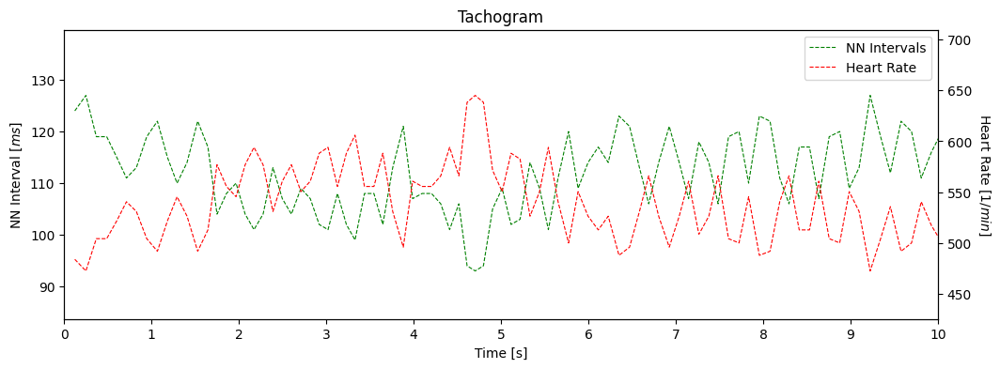

(H)025_20230506_105034_H10.csv
53874


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


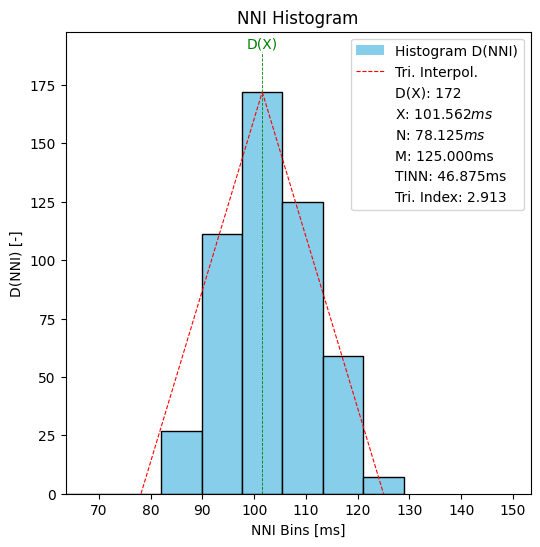

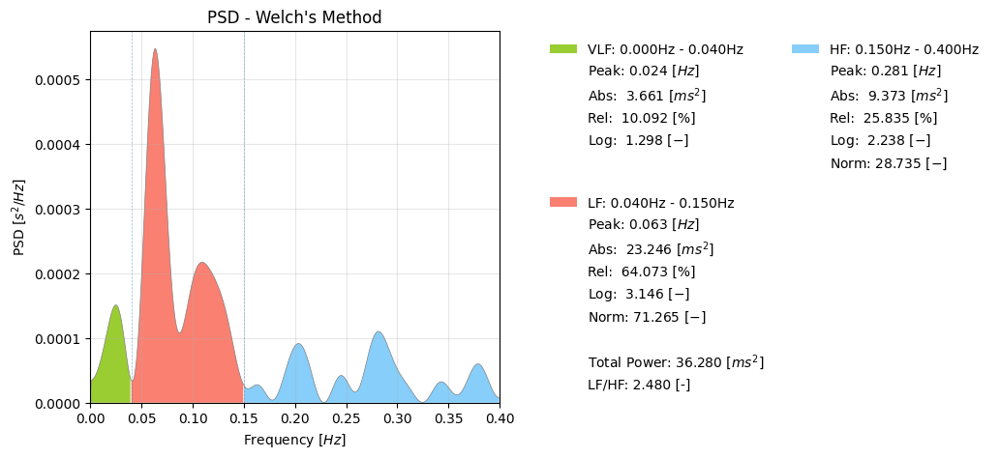

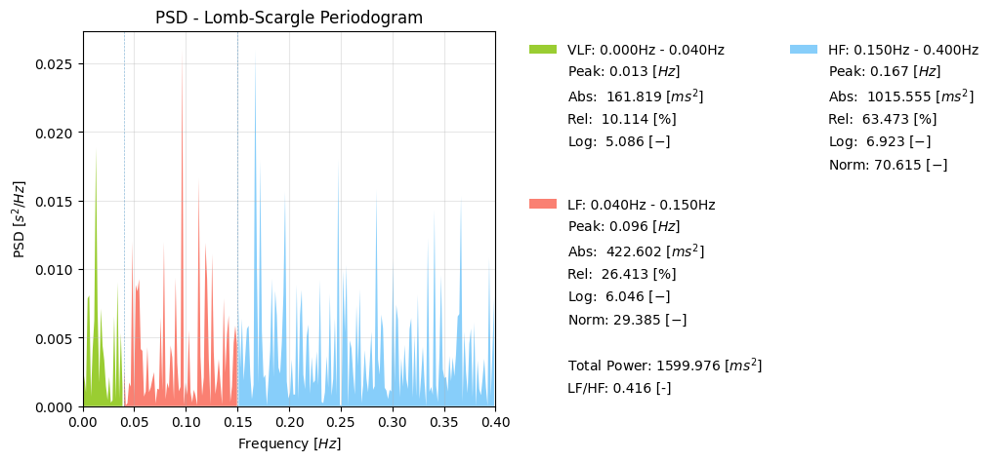

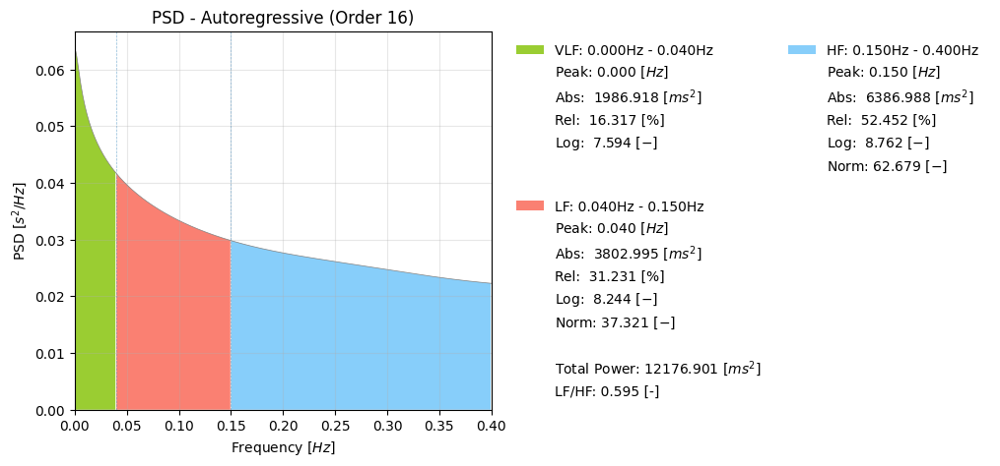

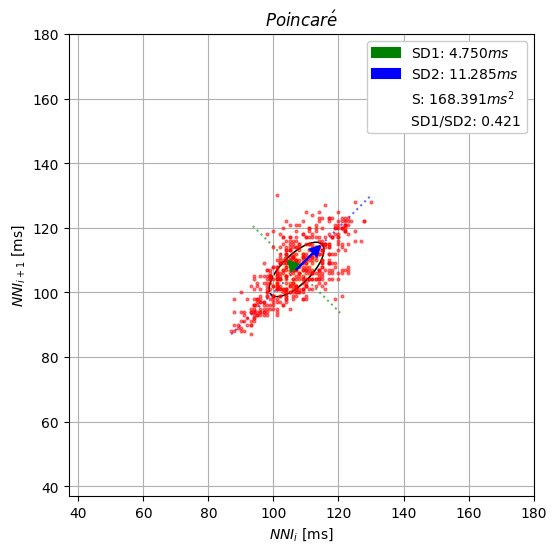

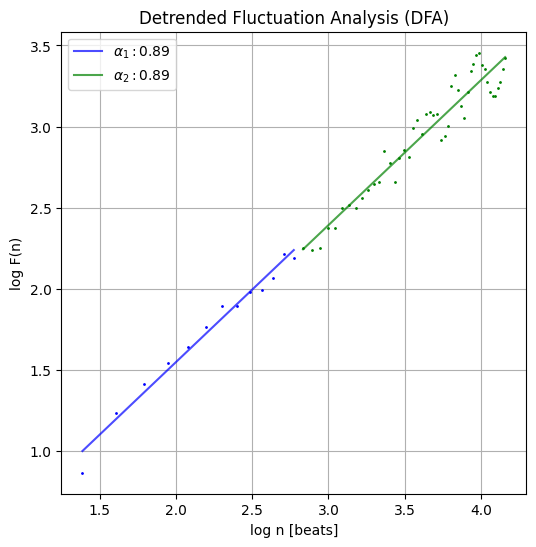

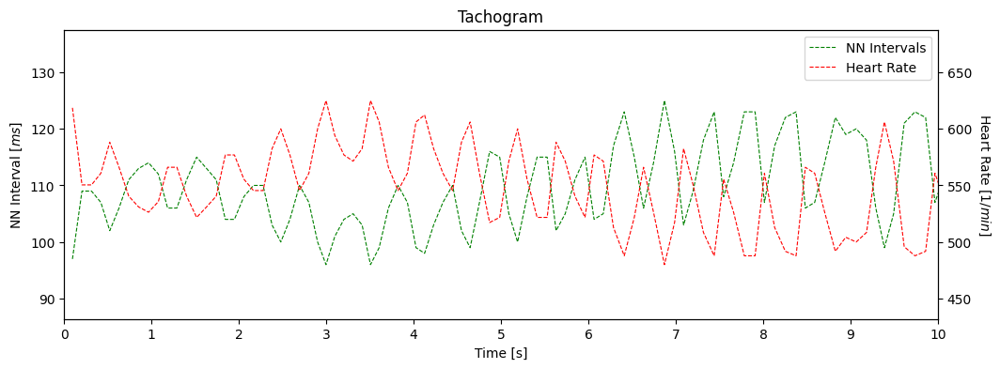

(H)026_20230506_100534_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


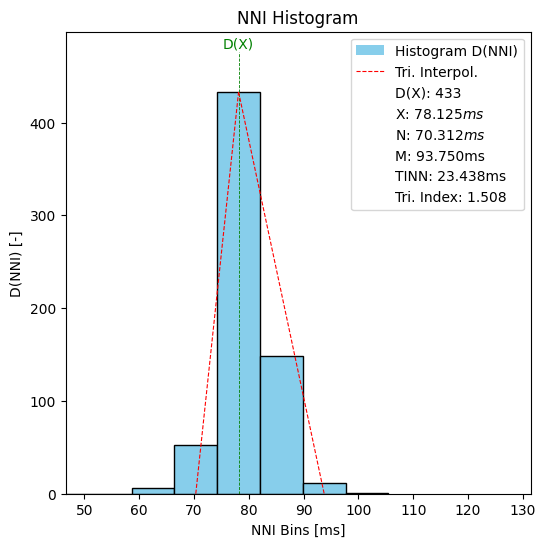

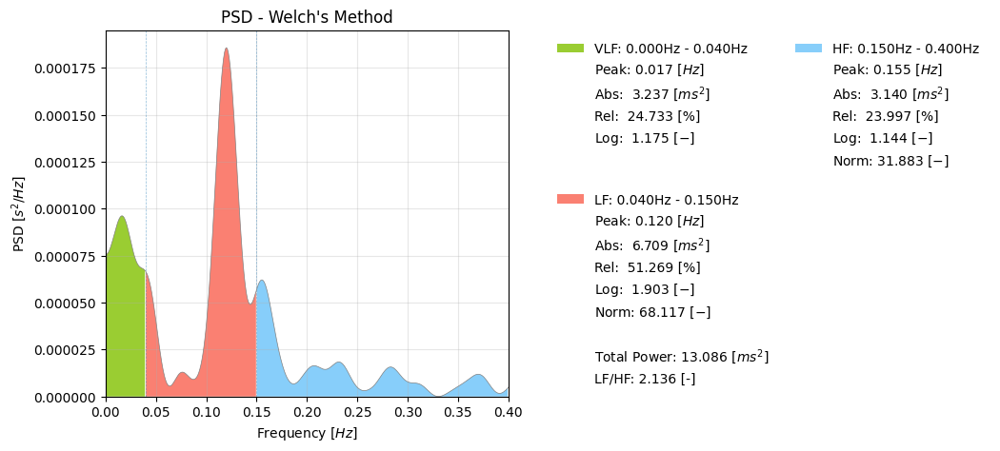

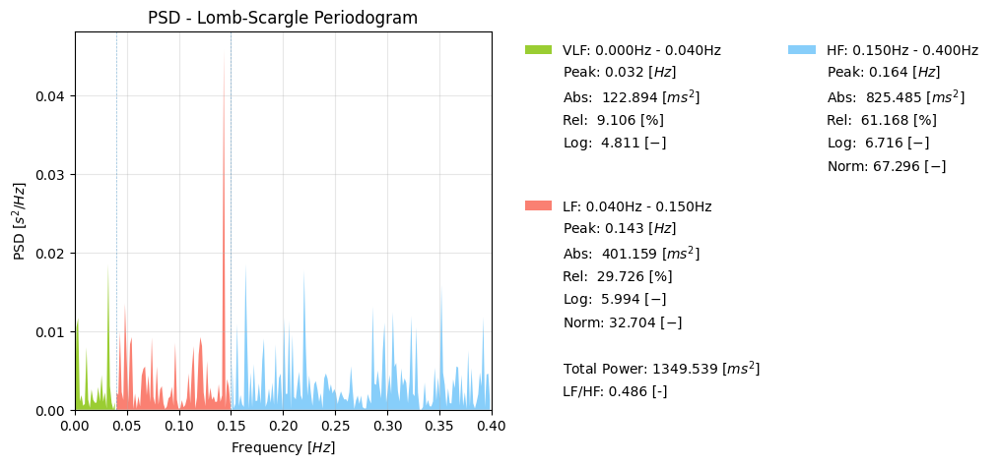

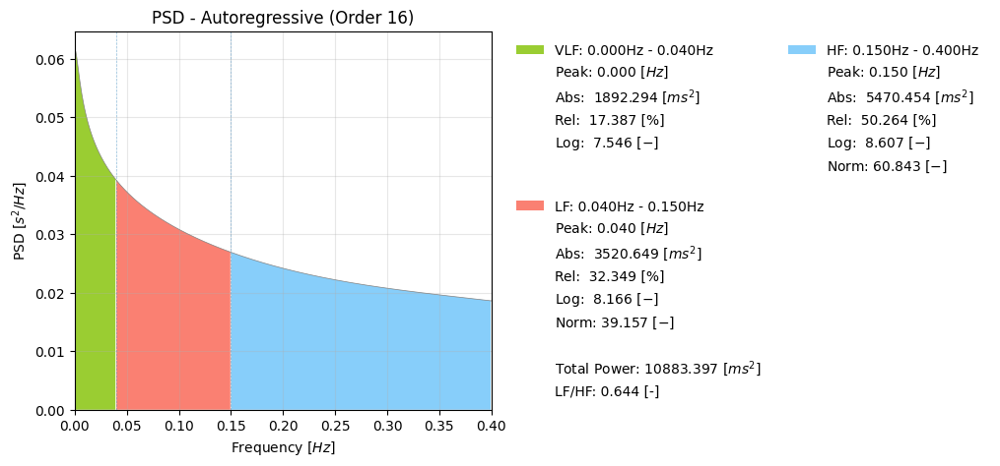

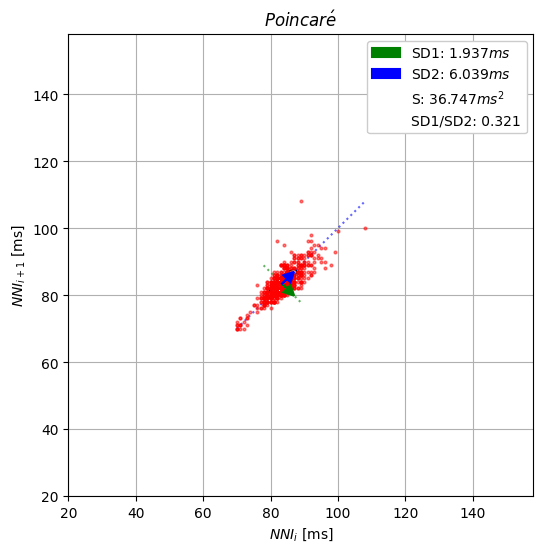

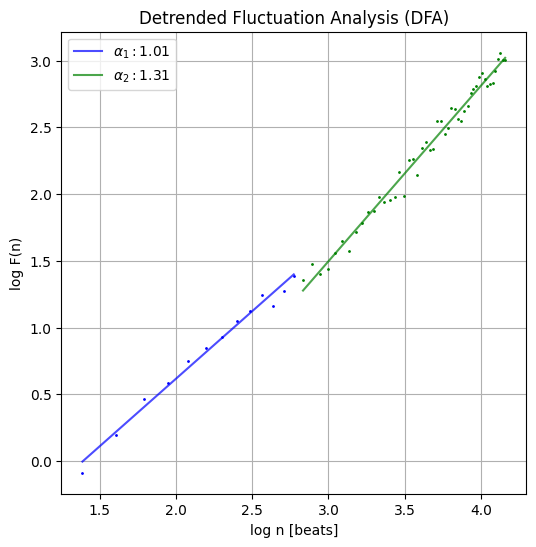

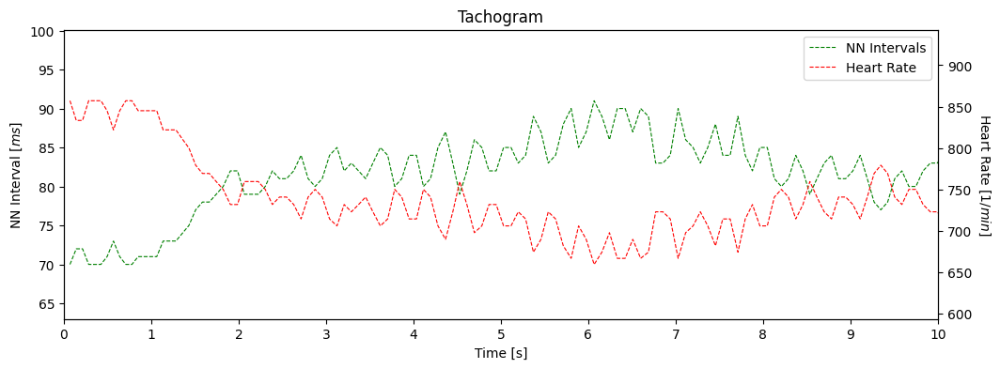

(H)027_20230506_103109_H10.csv
54750


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


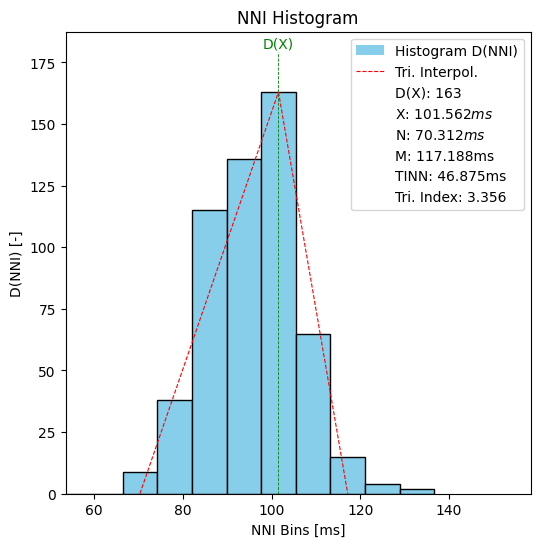

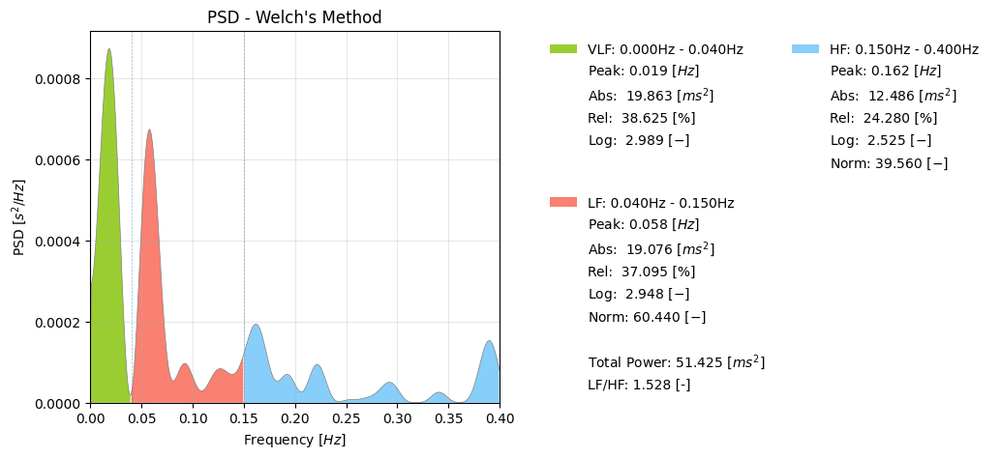

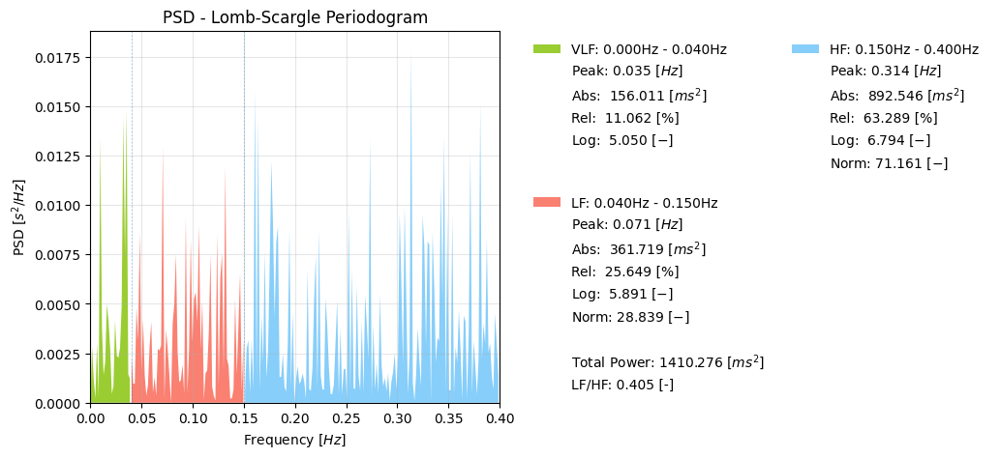

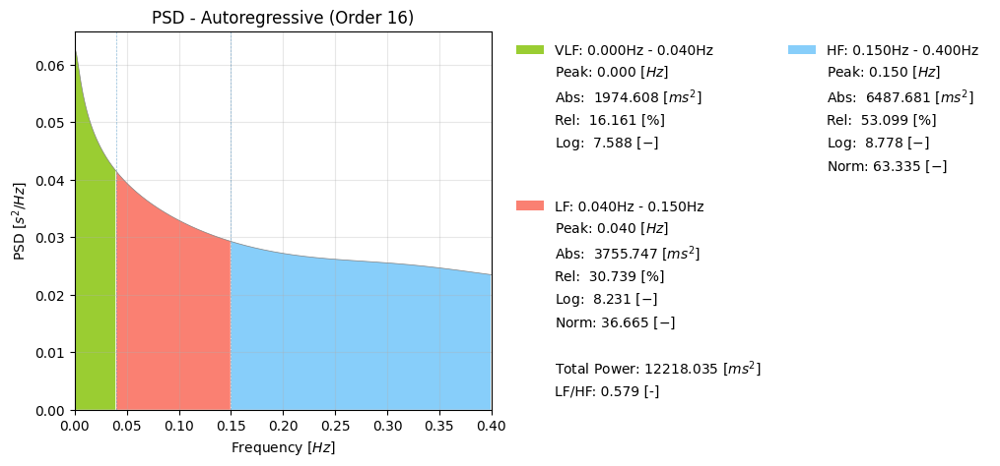

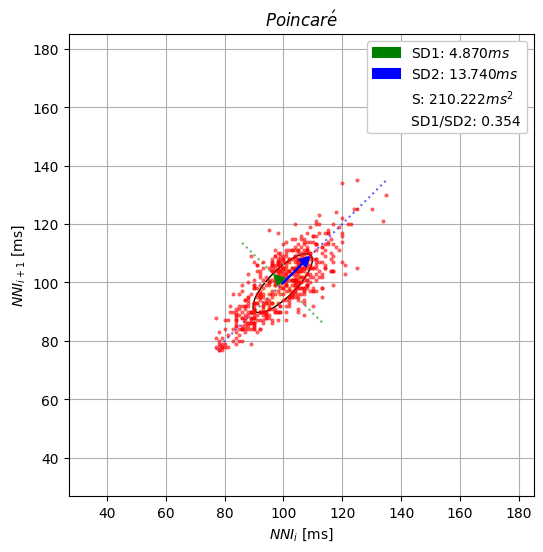

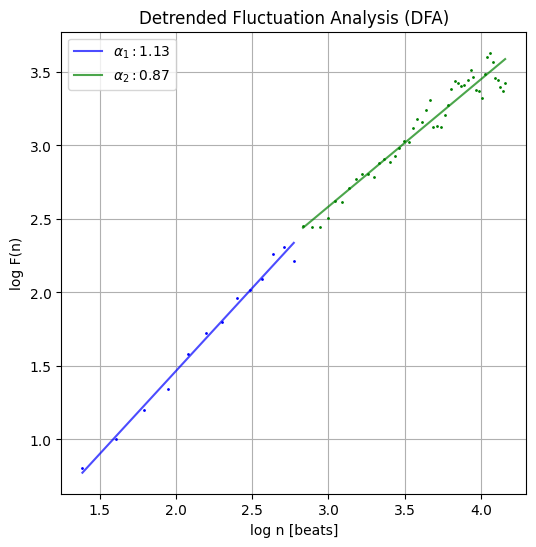

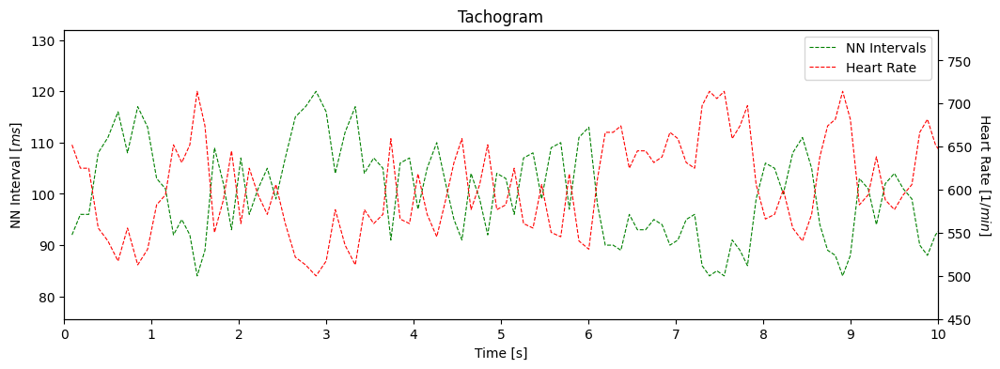

(H)028_20230506_103256_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


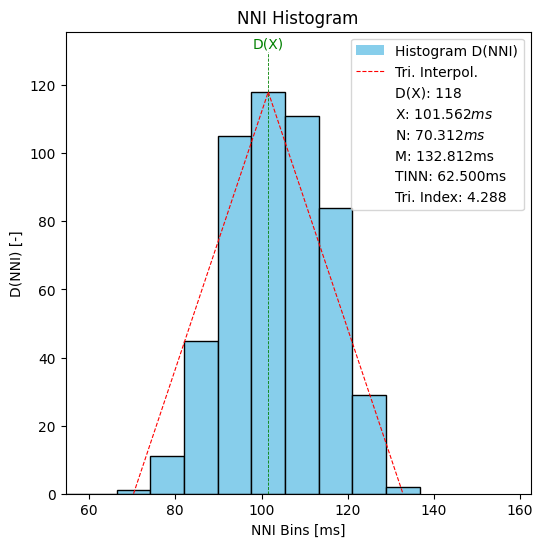

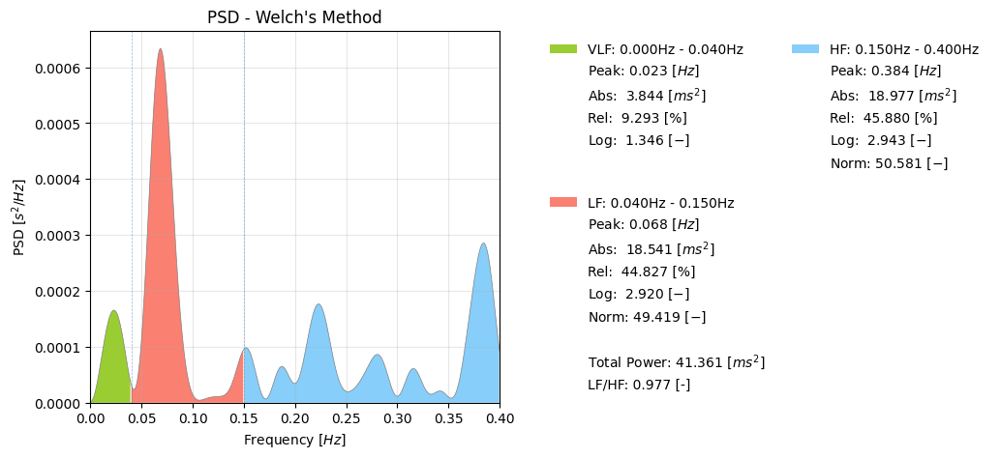

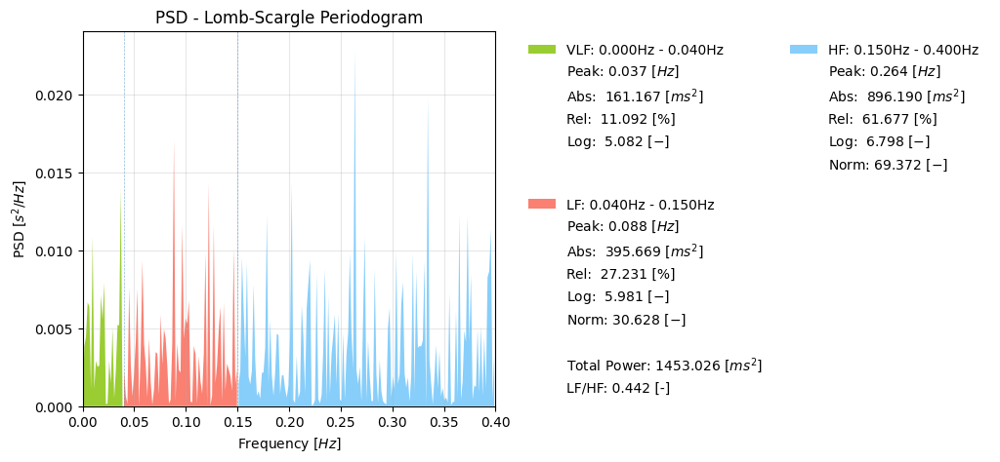

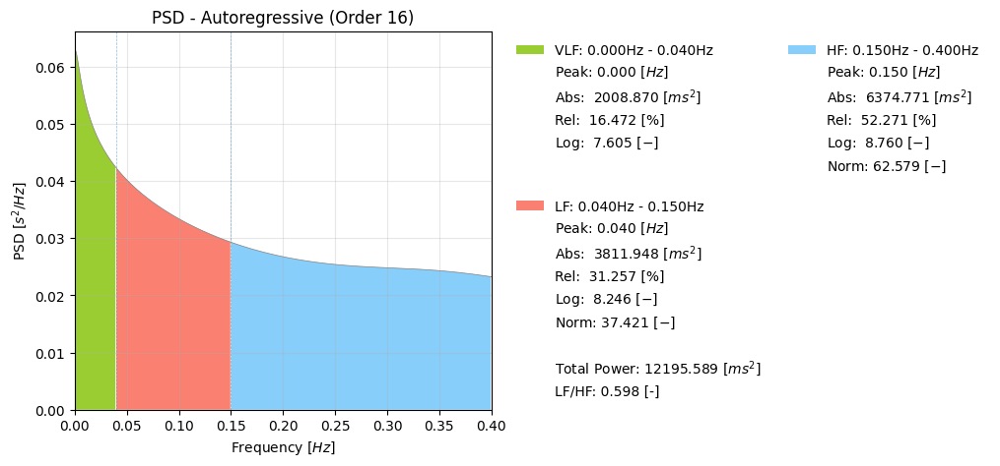

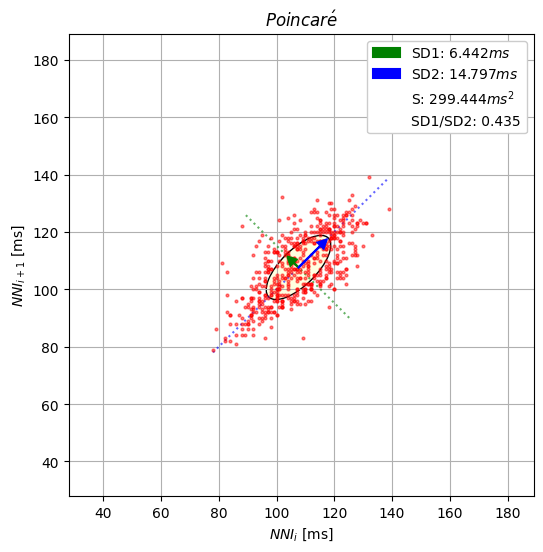

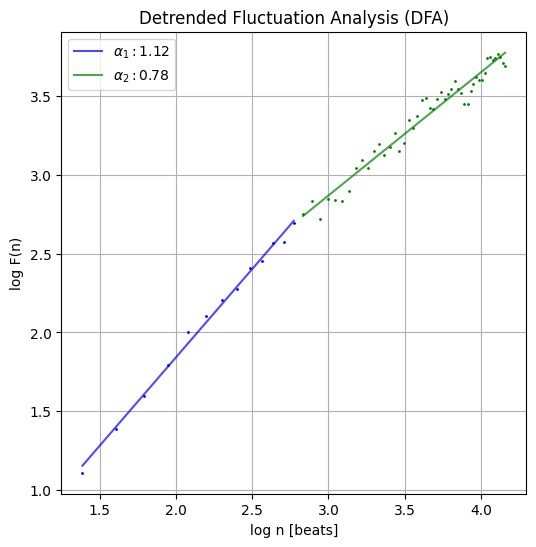

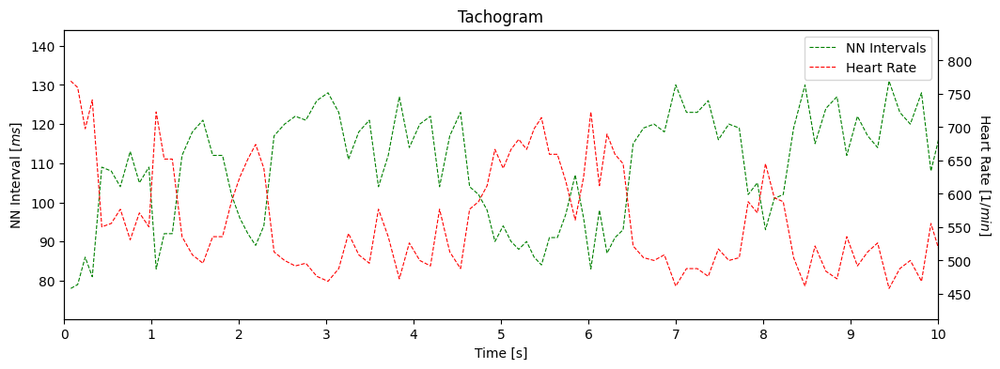

(H)029_20230506_110428_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


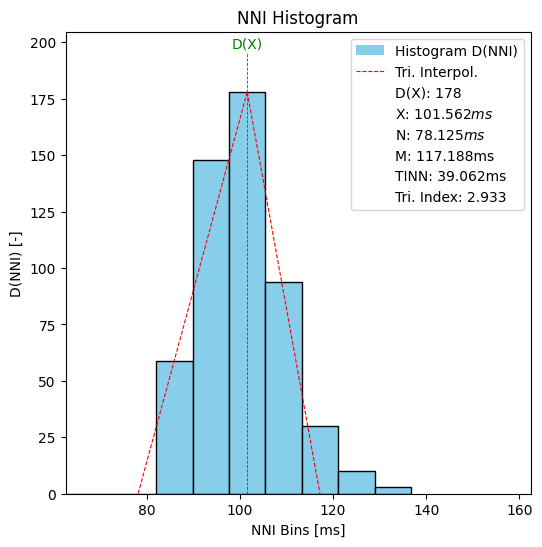

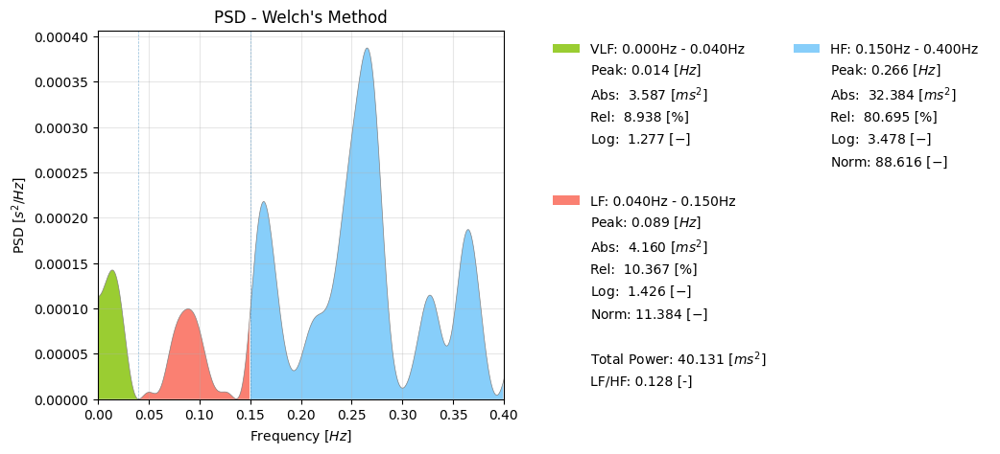

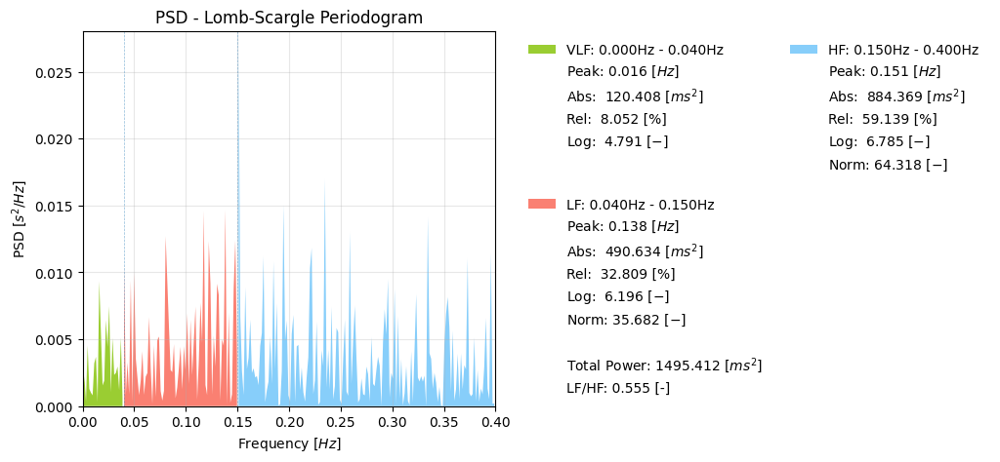

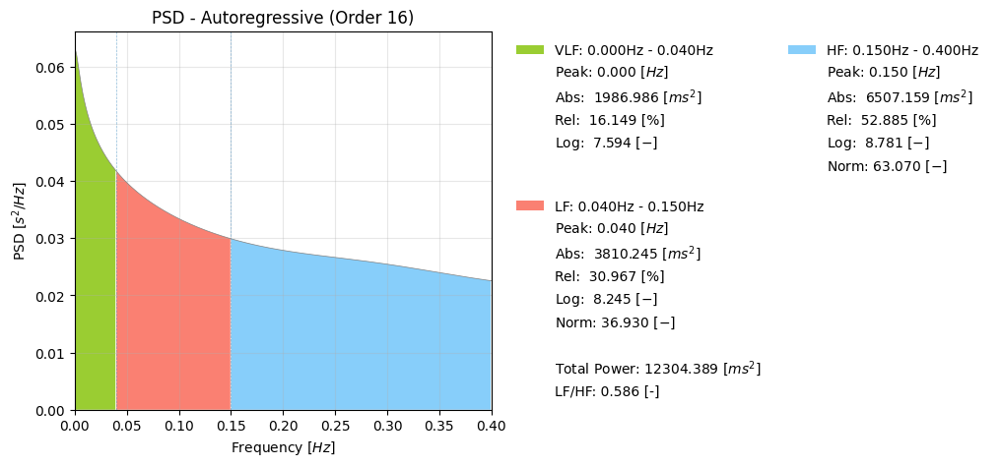

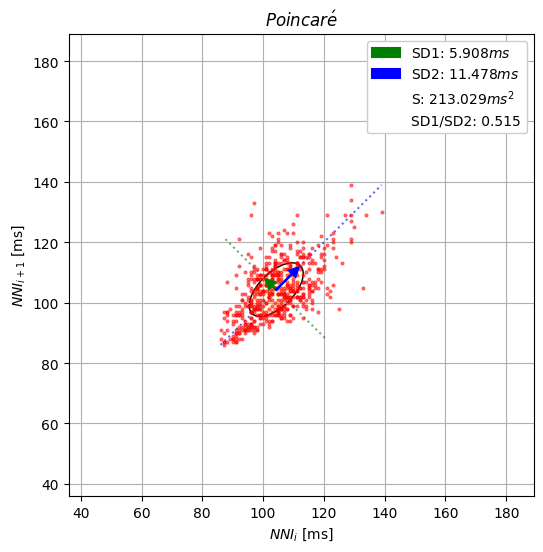

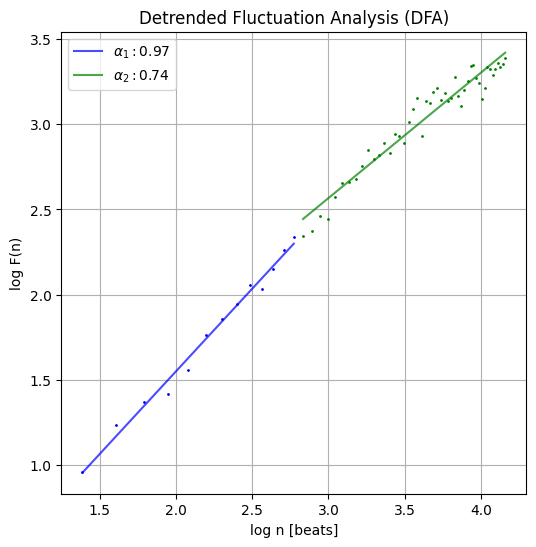

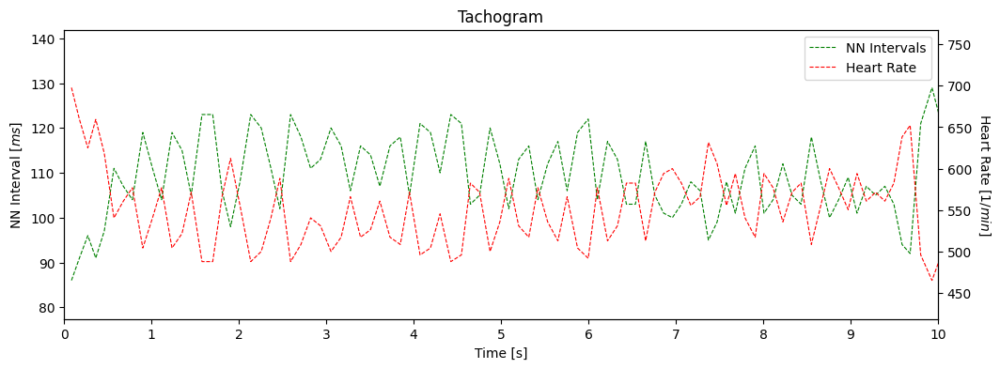

(H)030_20230506_111835_H10.csv
55115


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


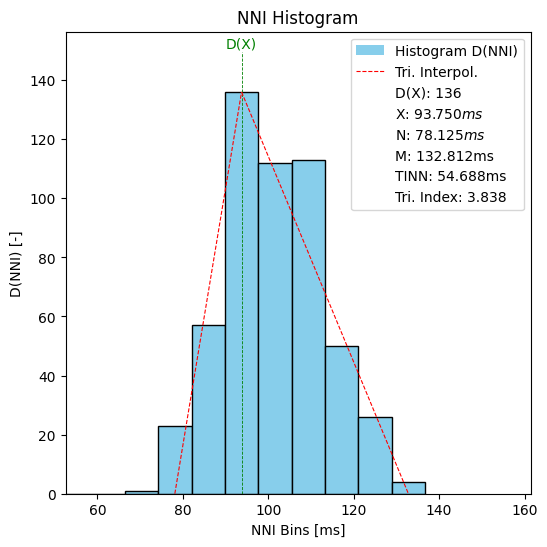

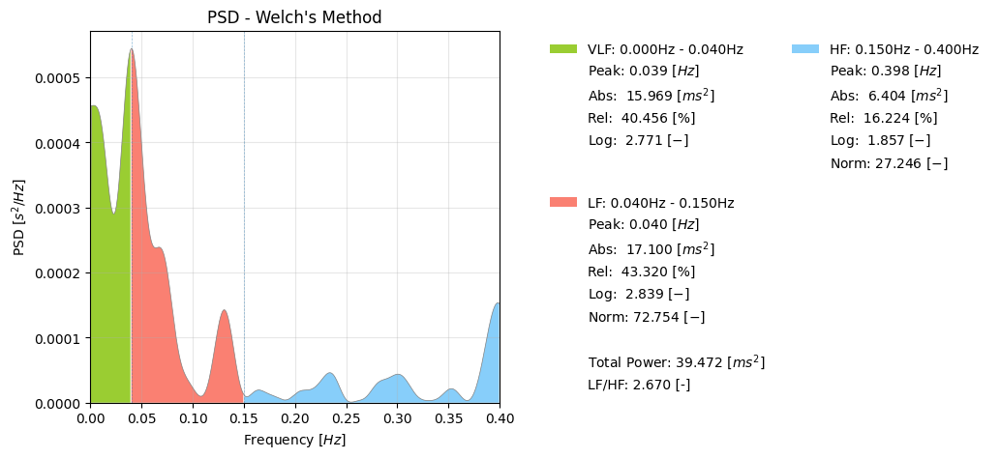

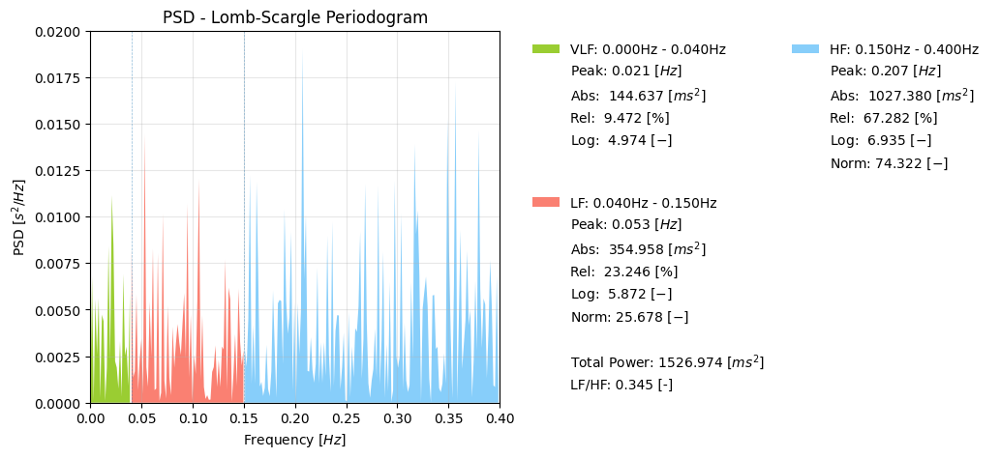

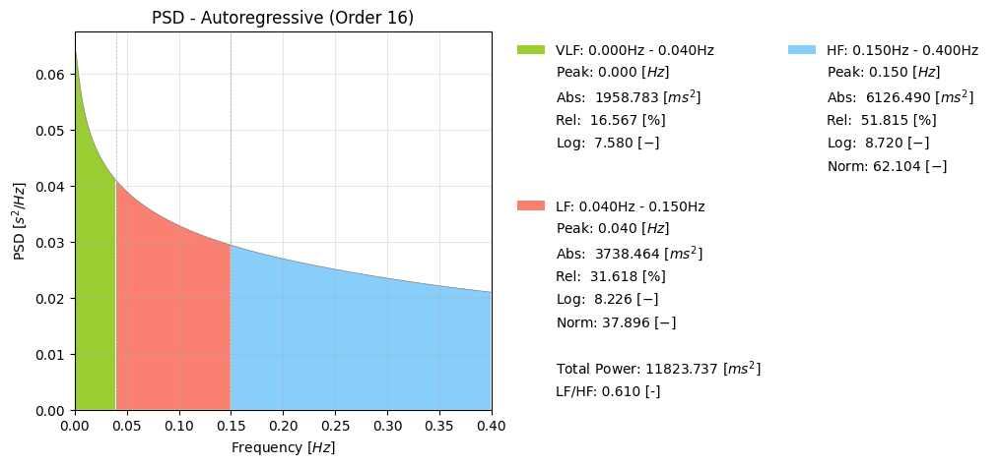

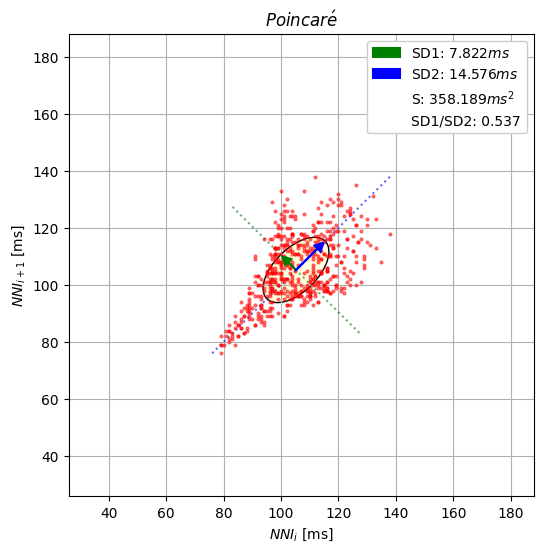

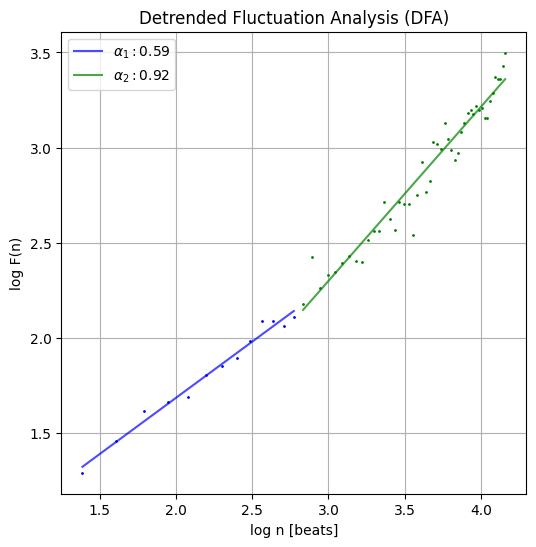

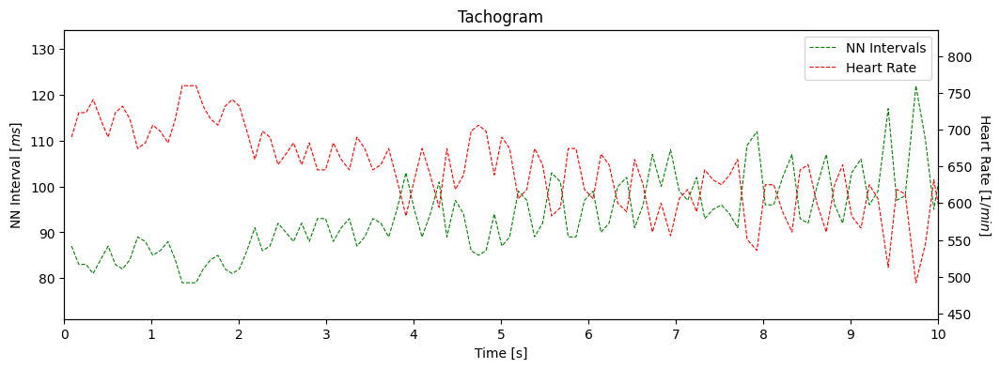

(H)031_20230506_115214_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


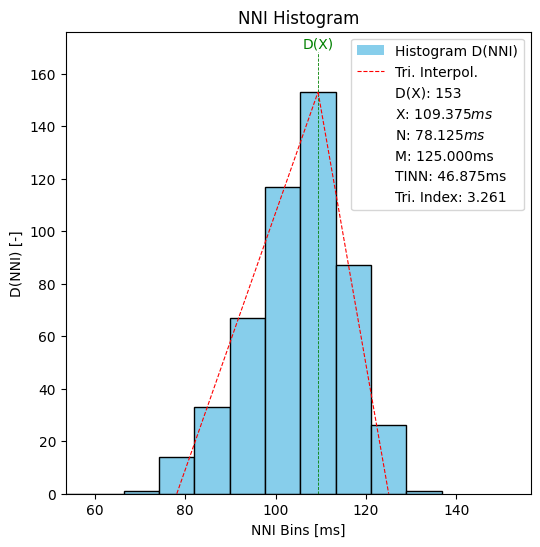

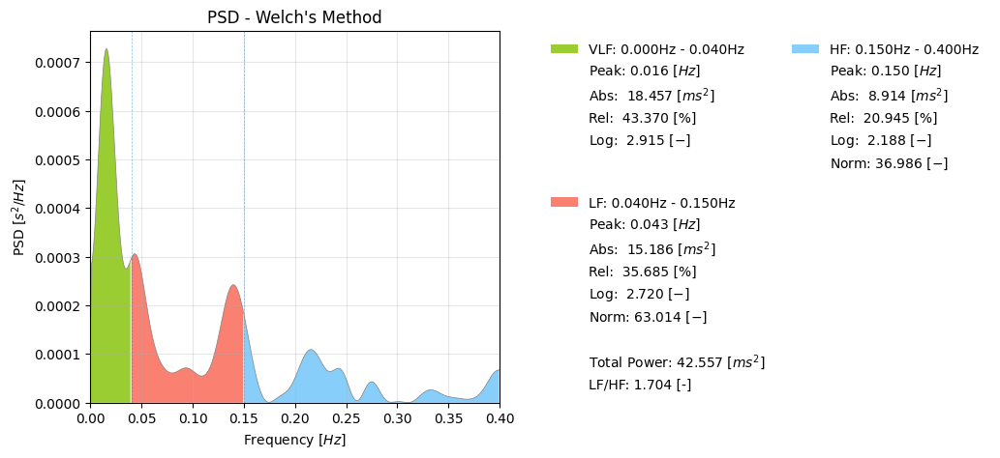

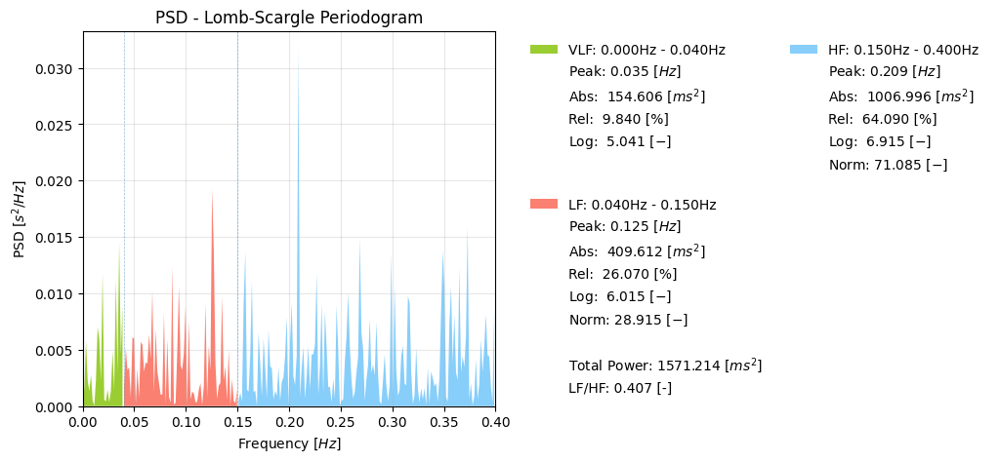

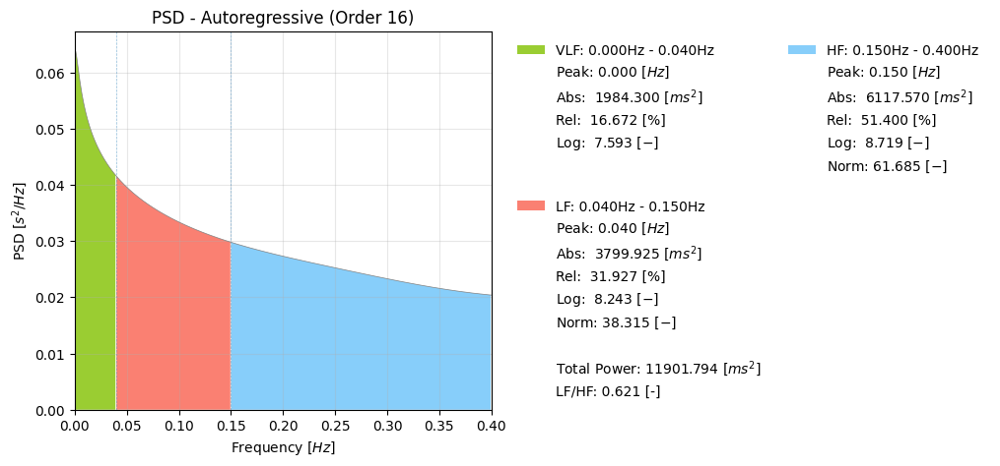

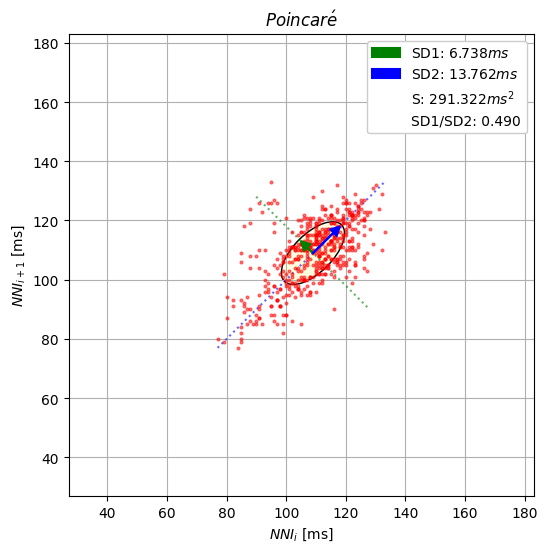

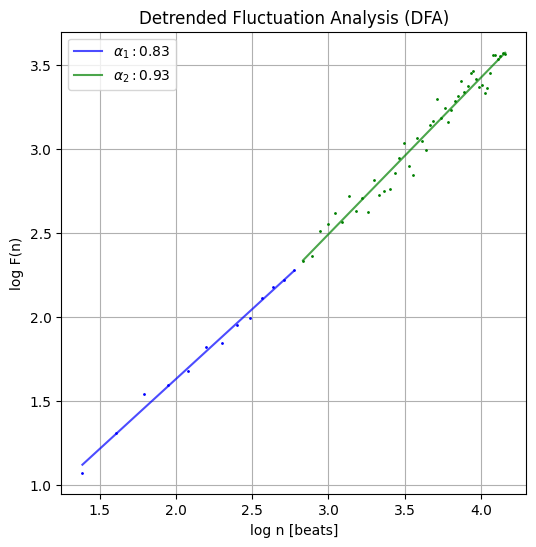

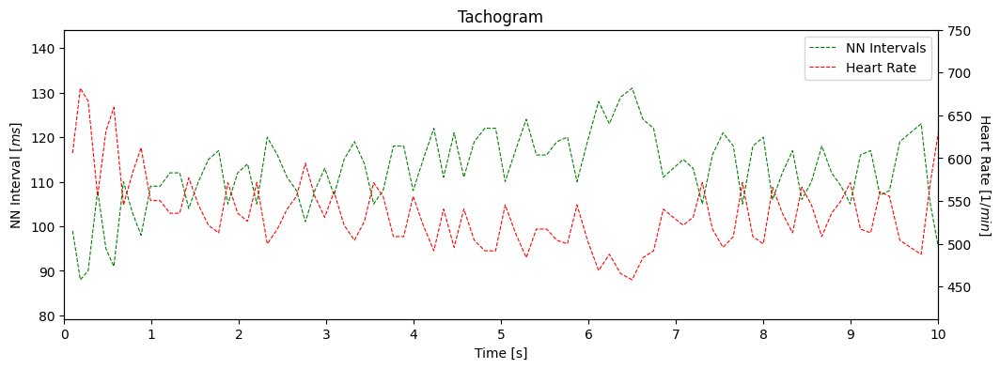

(H)032_20230506_110936_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


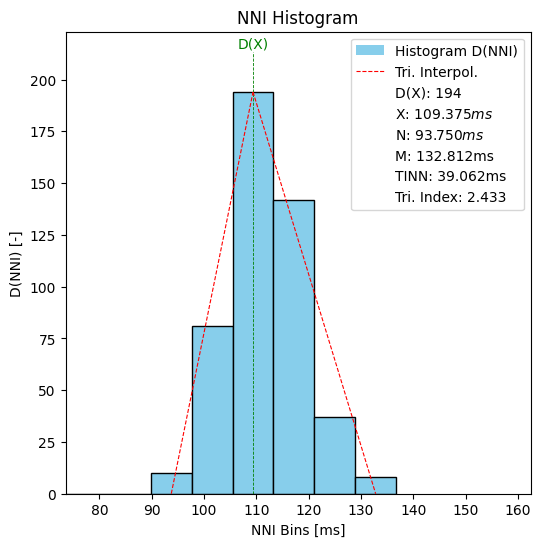

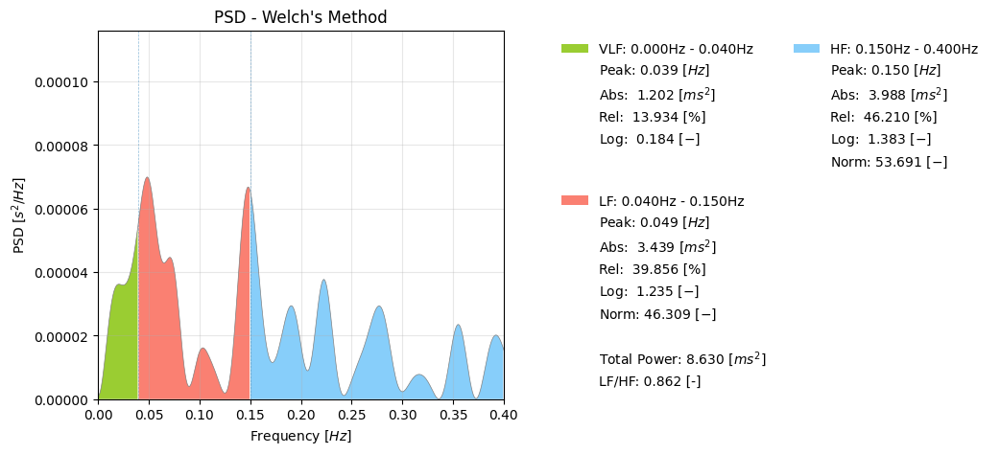

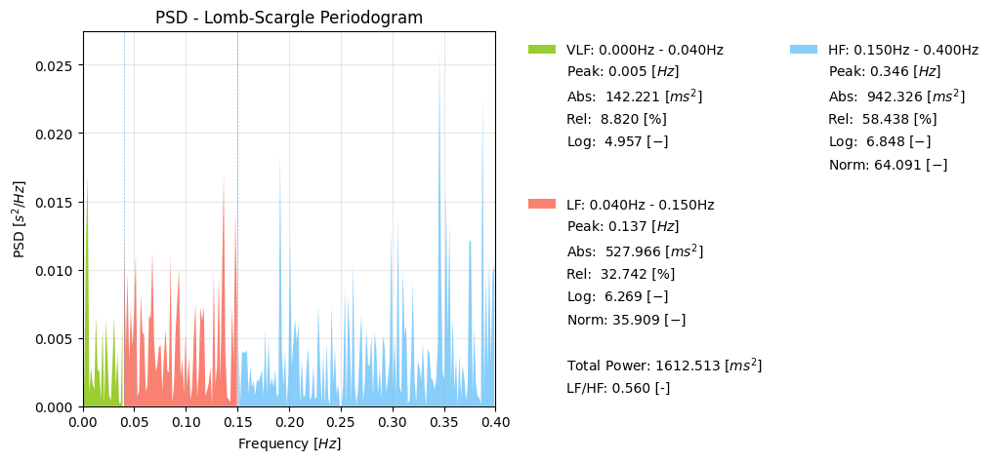

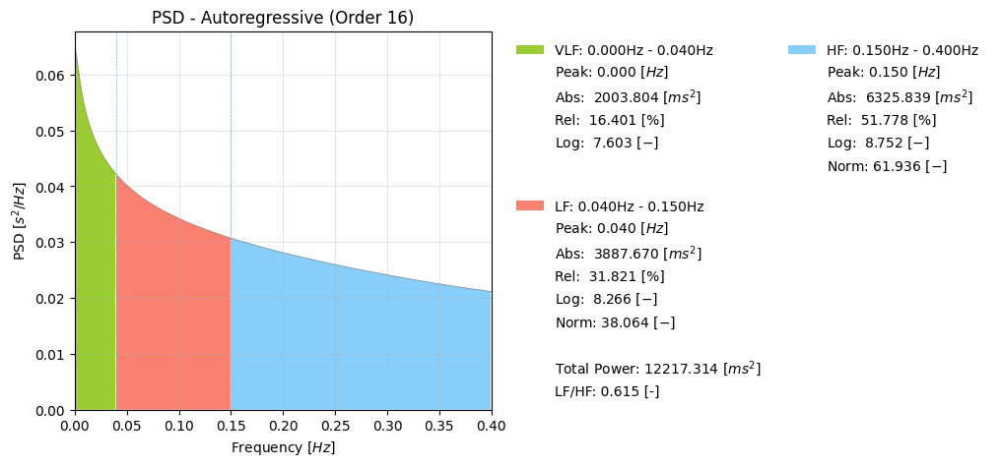

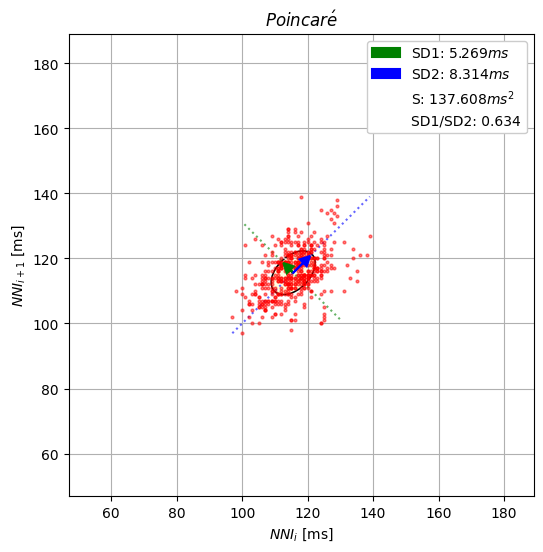

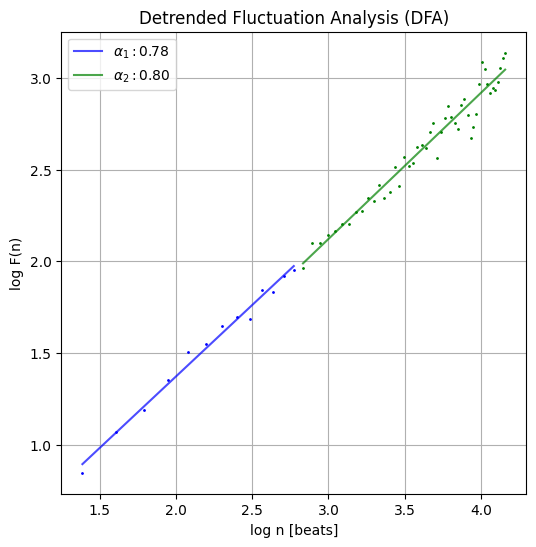

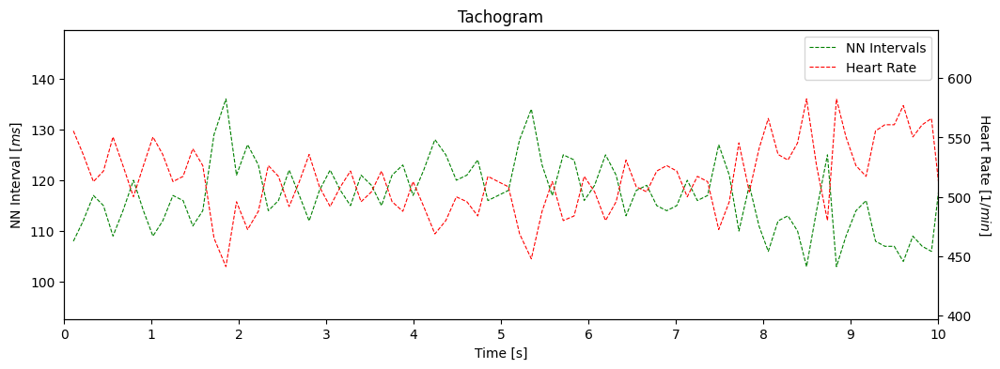

(H)033_20230506_113121_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


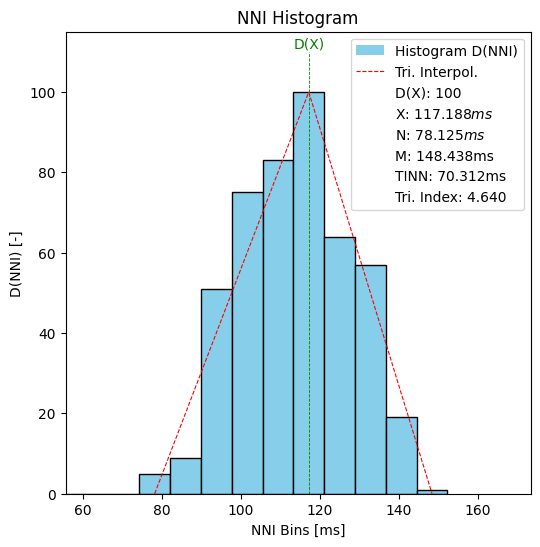

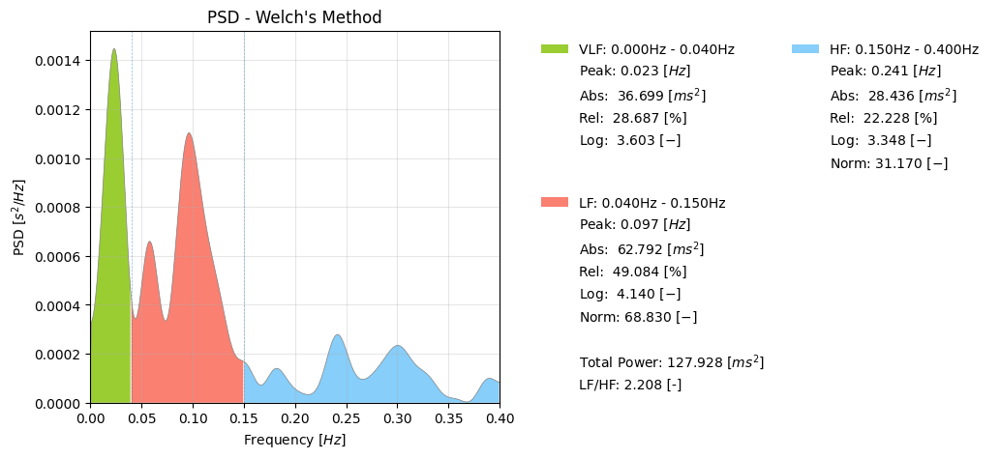

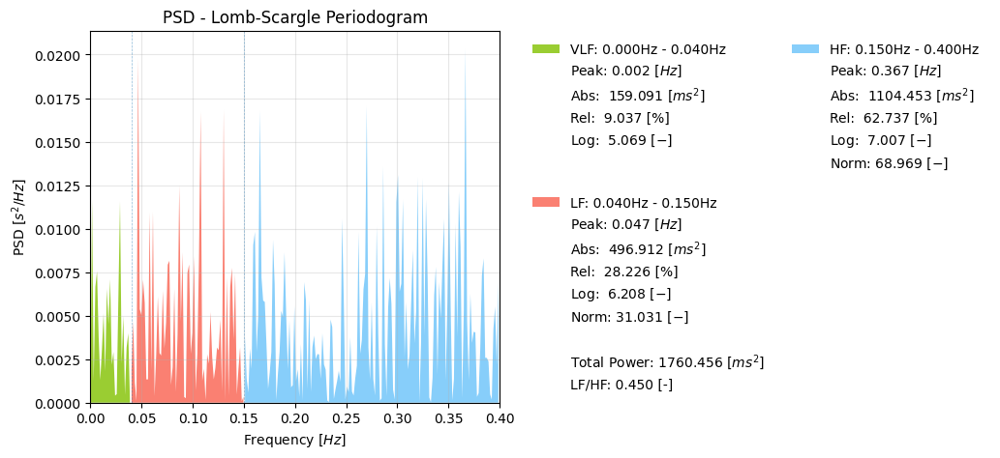

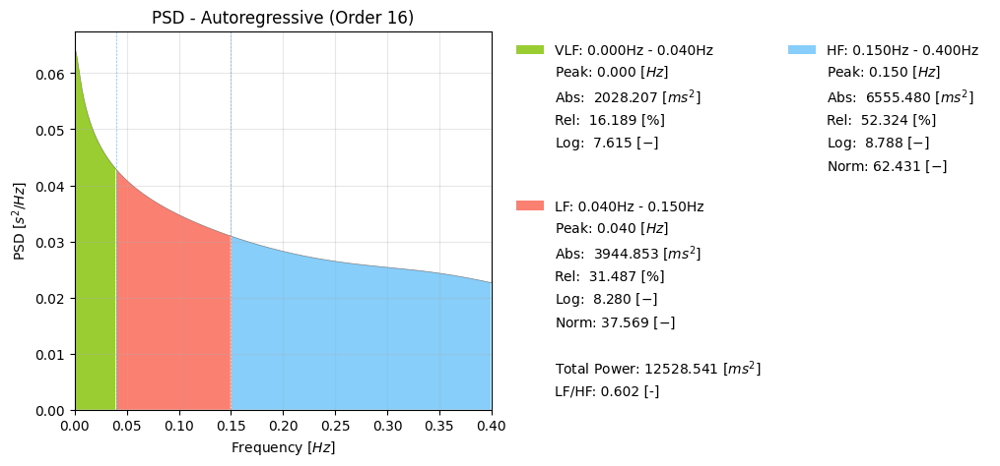

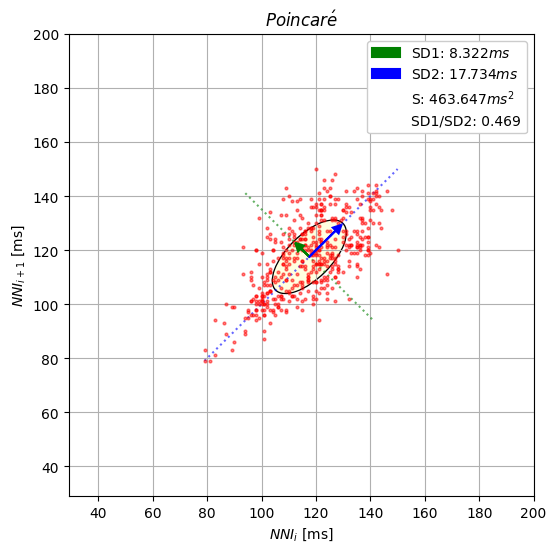

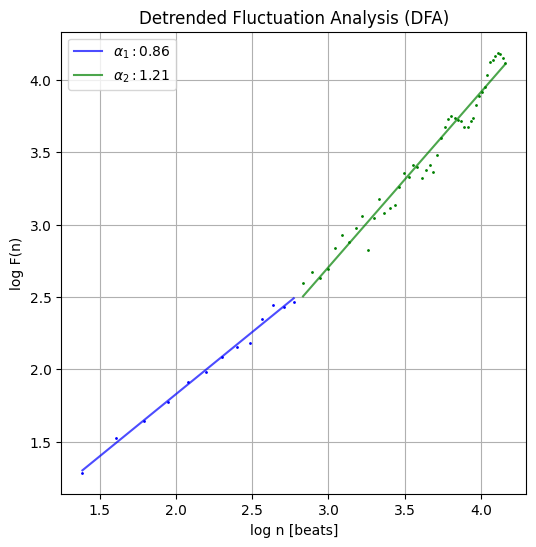

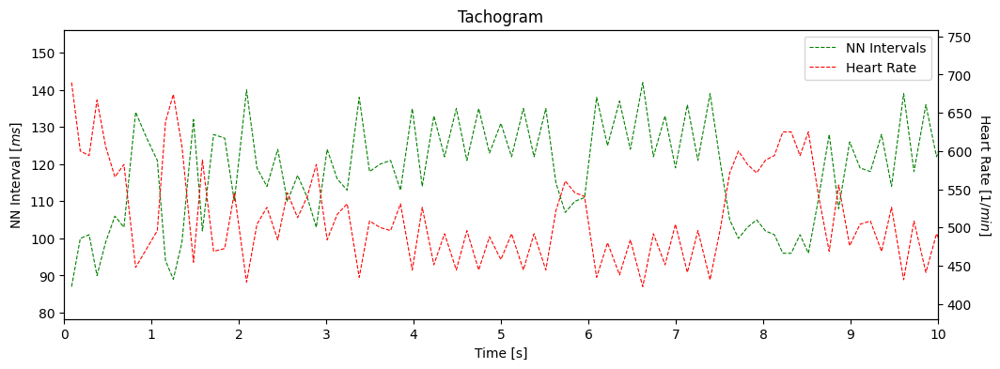

(H)034_20230506_113727_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


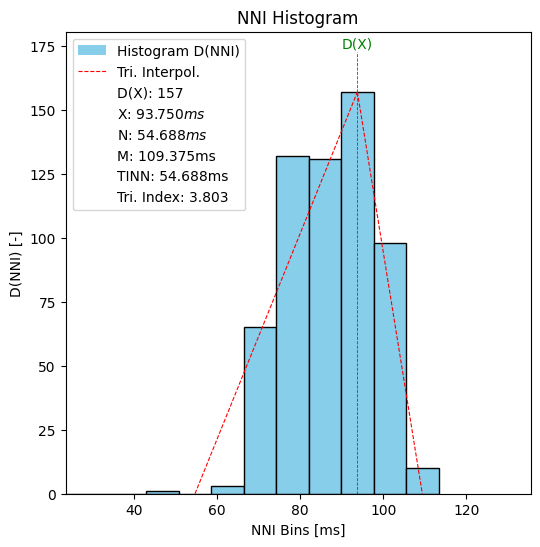

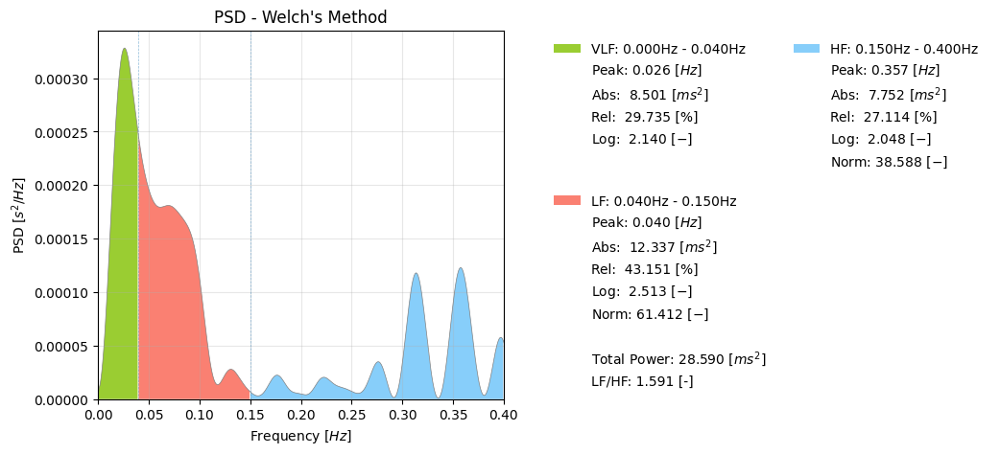

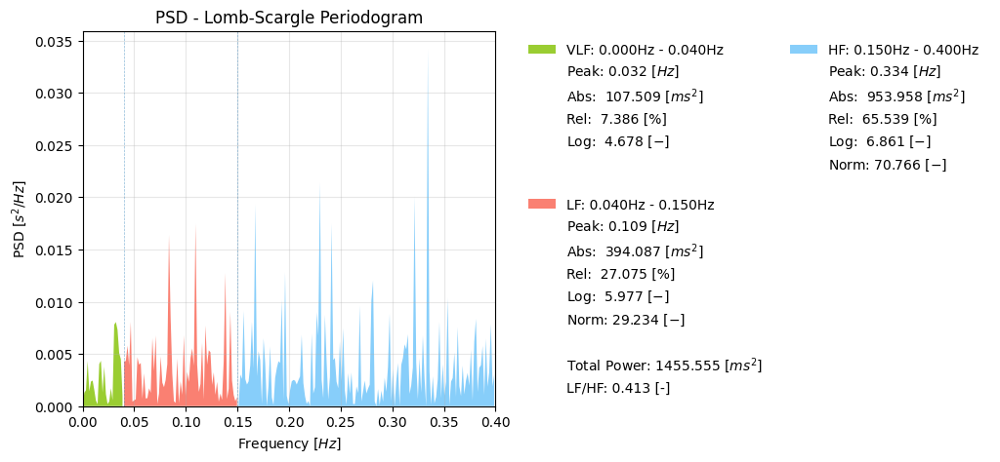

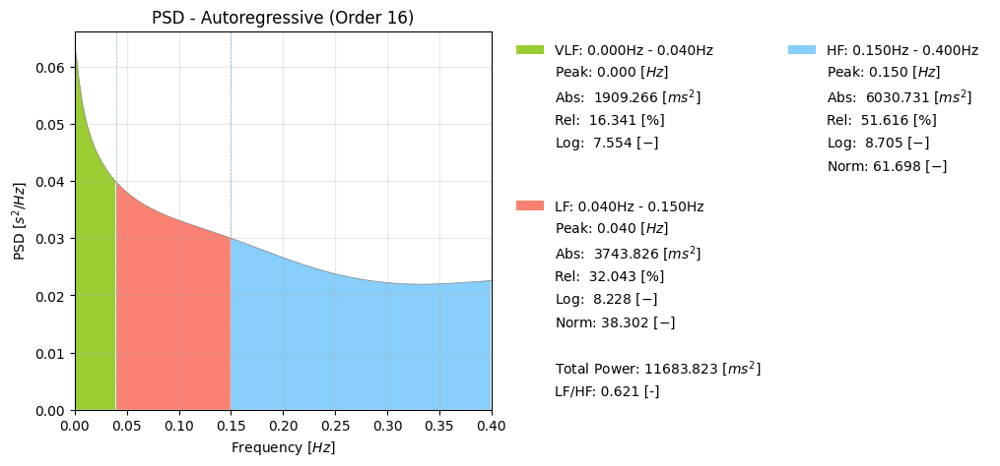

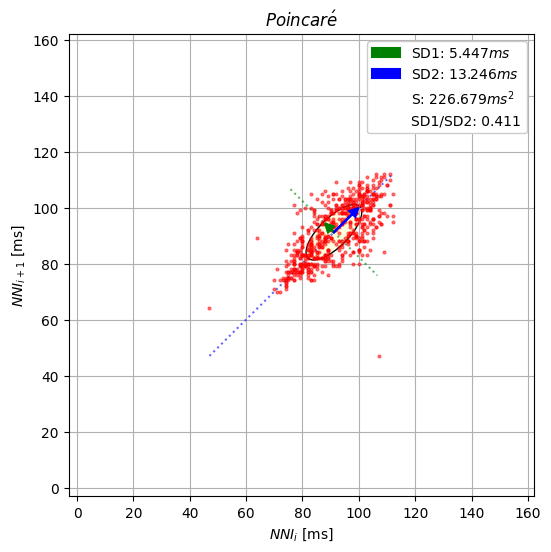

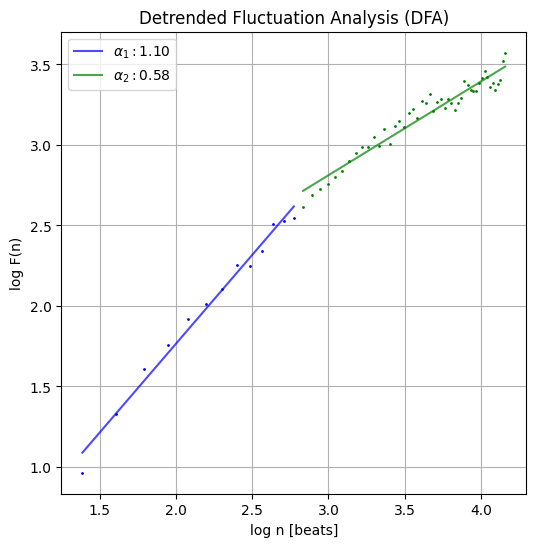

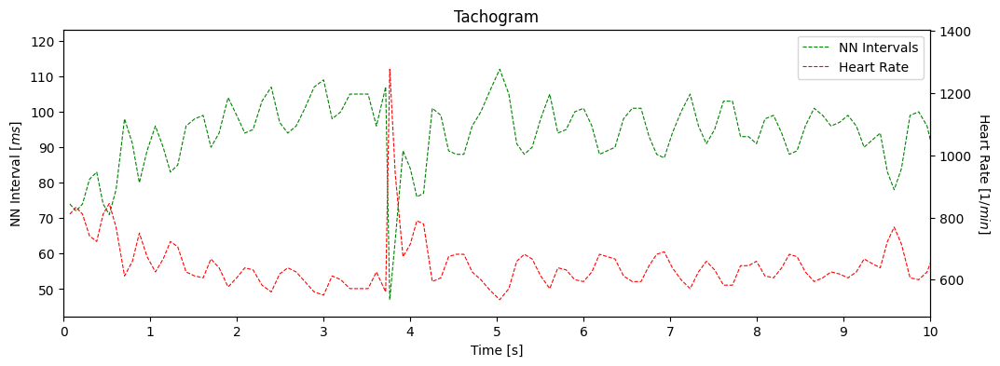

(H)035_20230506_120250_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


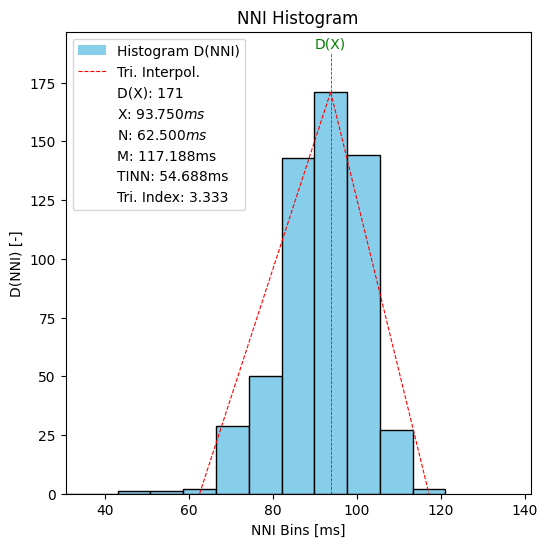

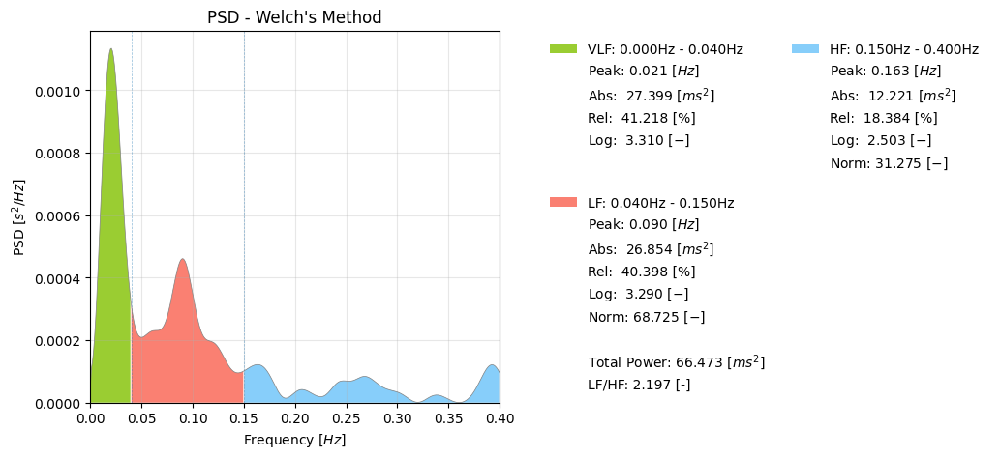

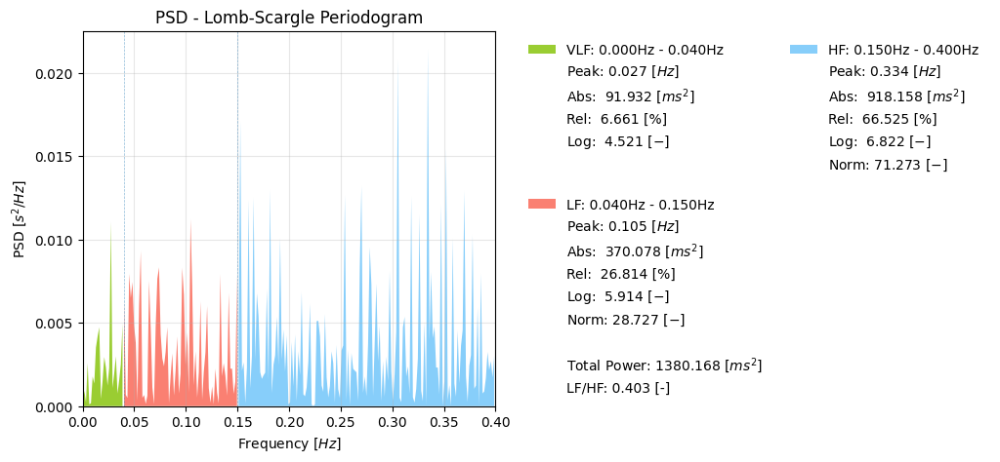

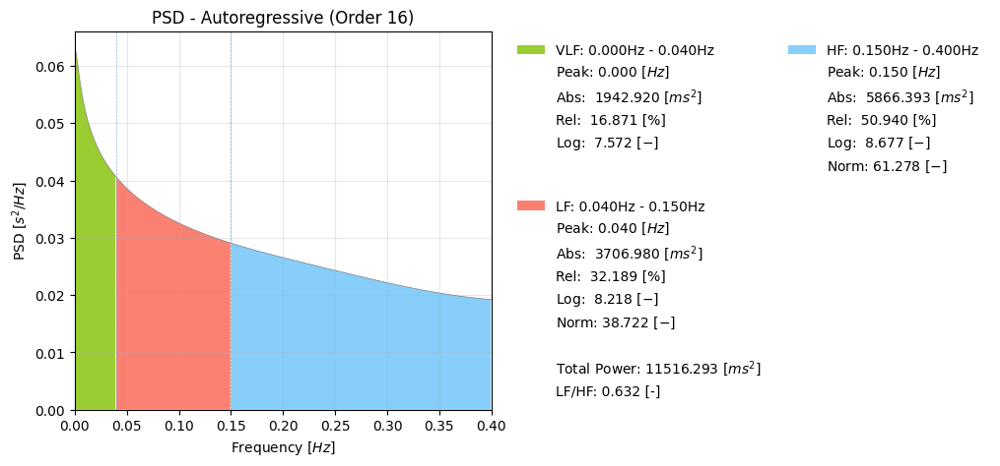

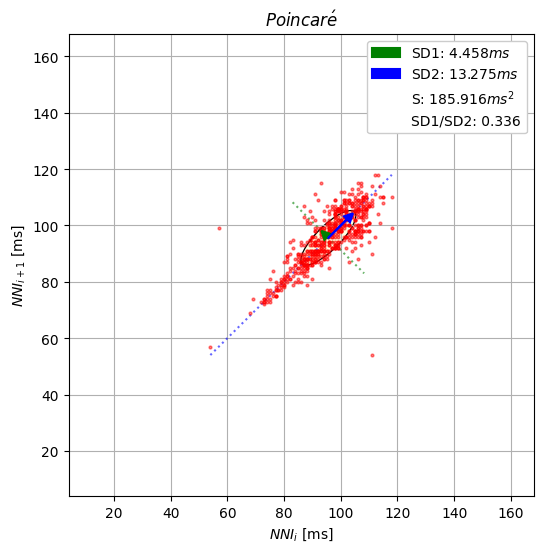

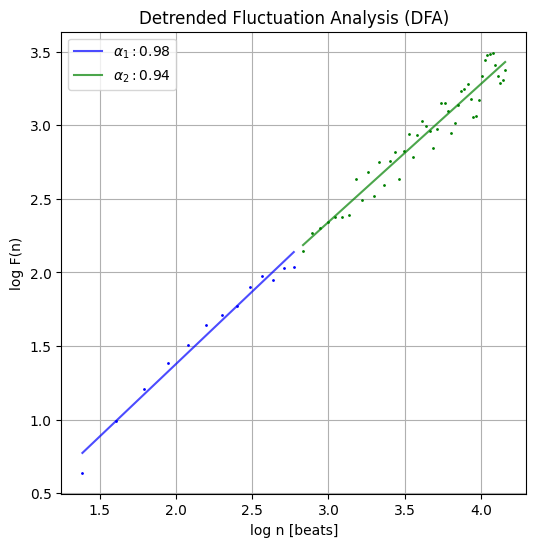

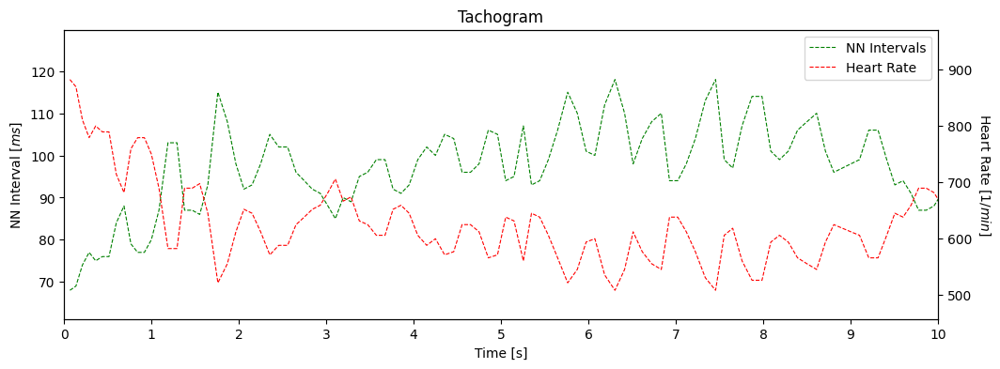

(H)036_20230506_125632_H10.csv
54604


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


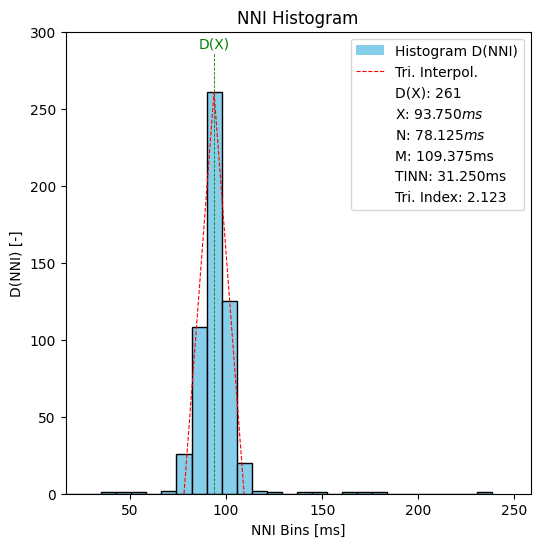

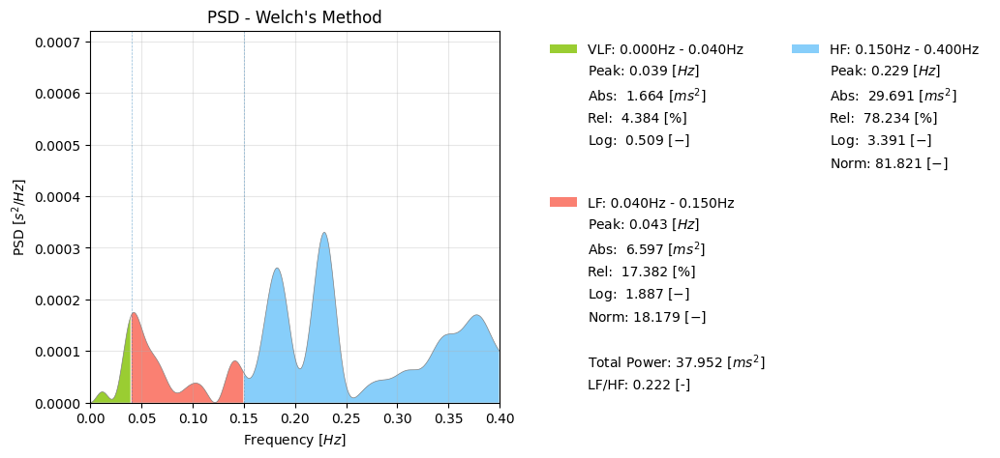

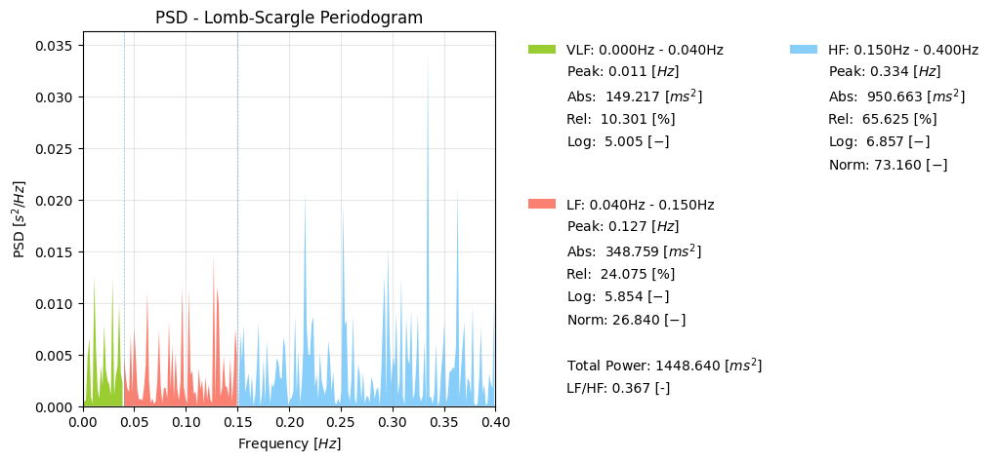

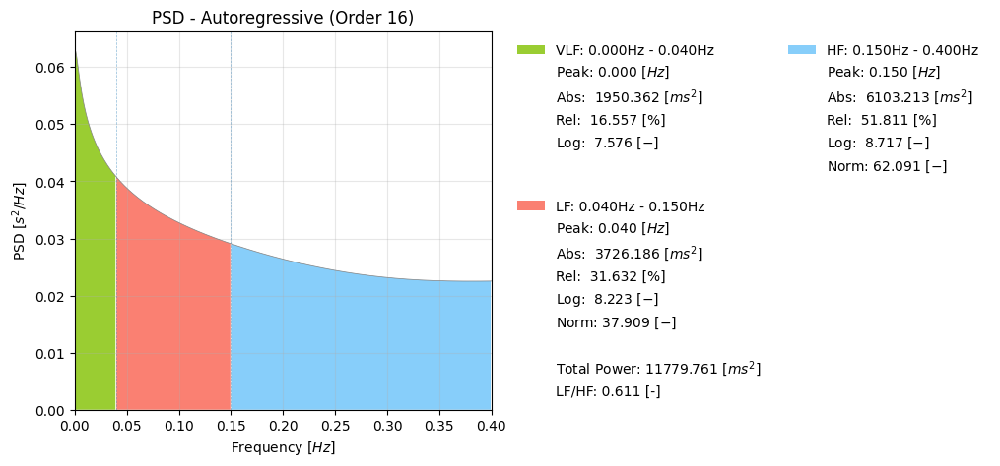

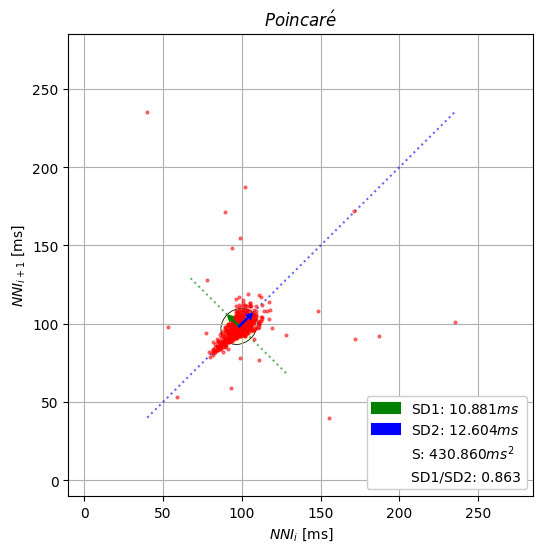

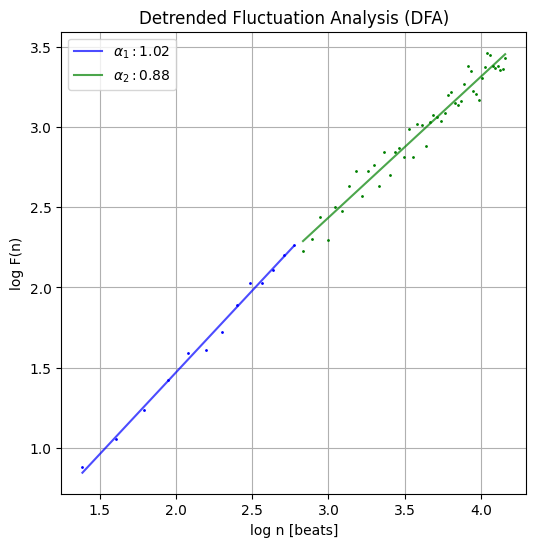

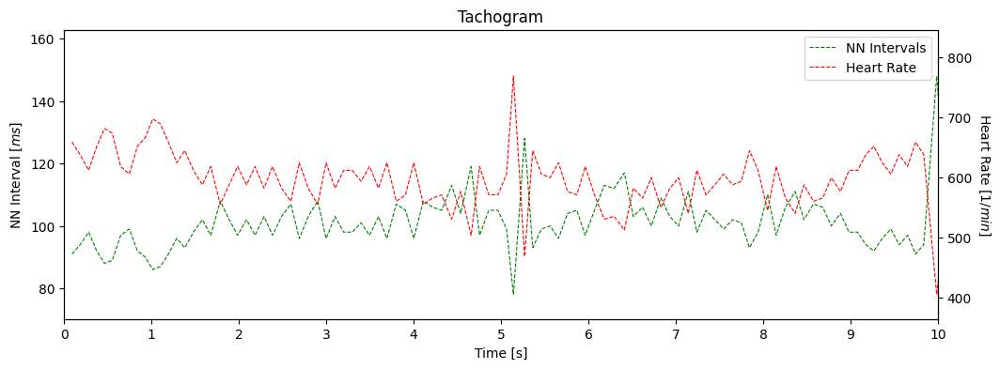

(H)037_20230506_123958_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


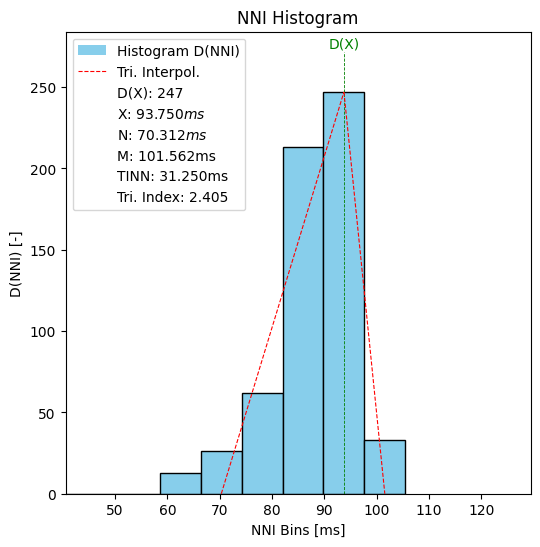

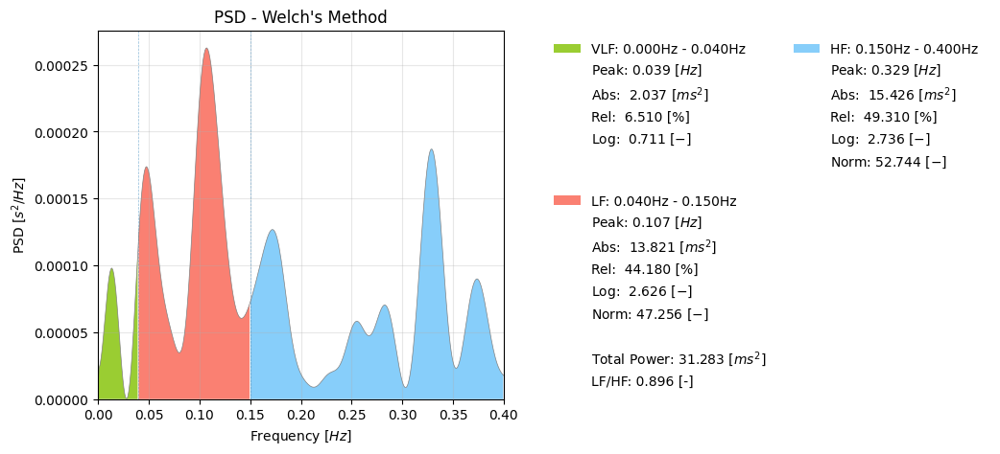

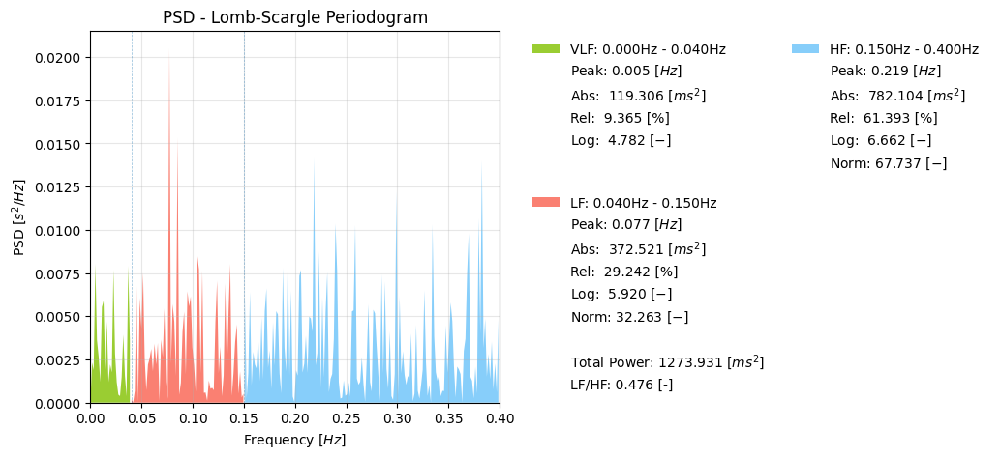

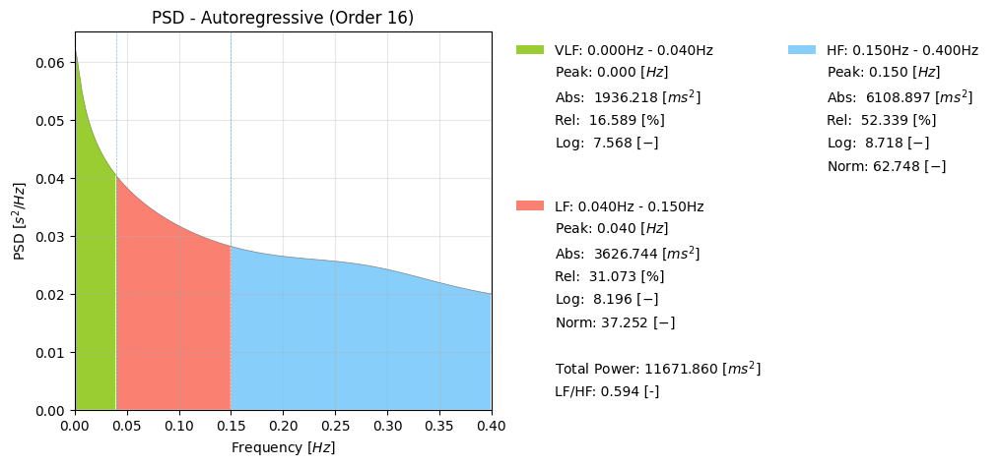

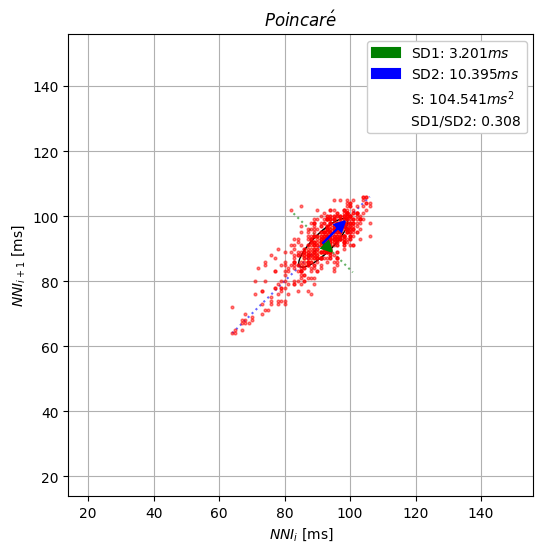

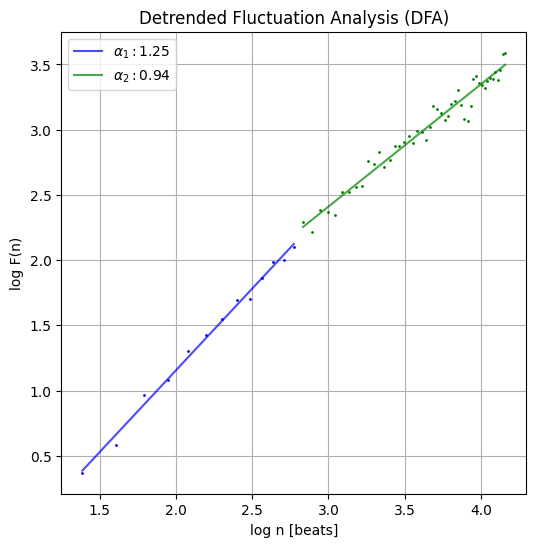

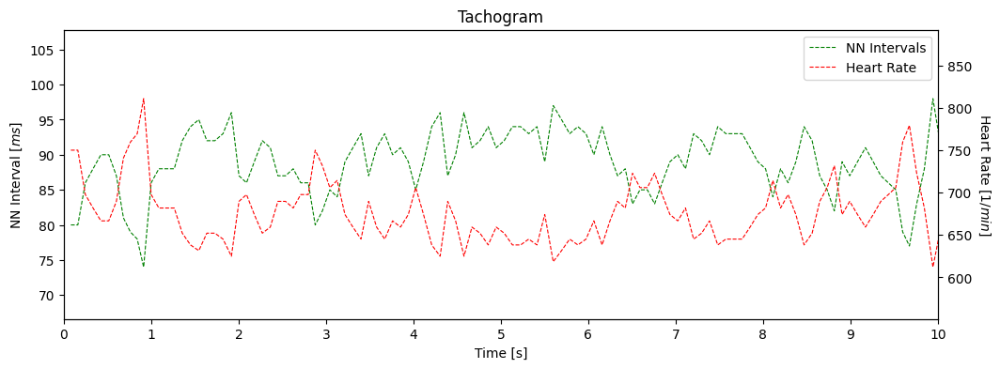

(H)039_20230506_122927_H10.csv
54677


/home/pilab/.local/lib/python3.10/site-packages/pyhrv/utils.py:367: UserWarning: Signal duration is to short for segmentation into 300000s. Input data will be returned.
  warnings.warn("Signal duration is to short for segmentation into %is. Input data will be returned." % duration)
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:303: UserWarning: Signal duration too short for SDANN computation.
  warnings.warn("Signal duration too short for SDANN computation.")
/home/pilab/.local/lib/python3.10/site-packages/pyhrv/time_domain.py:576: UserWarning: CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a malfunction of the function. This function will be reviewed over the next updates to solve this issue
  warnings.warn('CAUTION: The TINN computation is currently providing incorrect results in the most cases due to a '


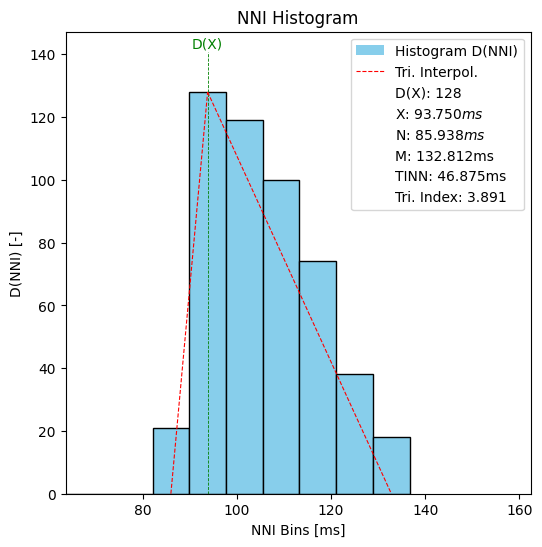

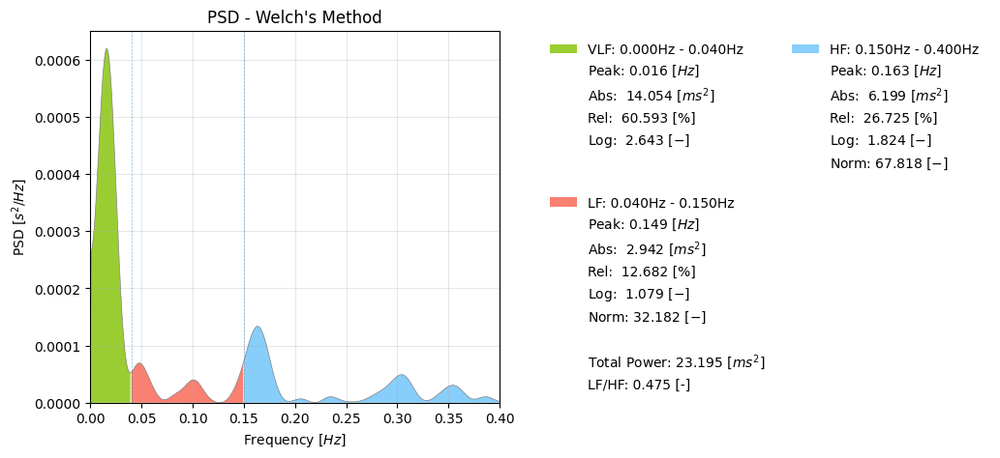

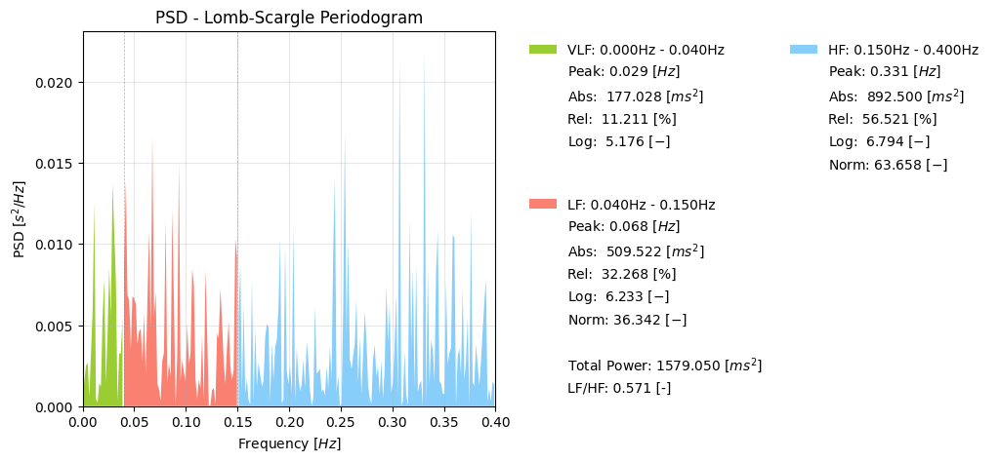

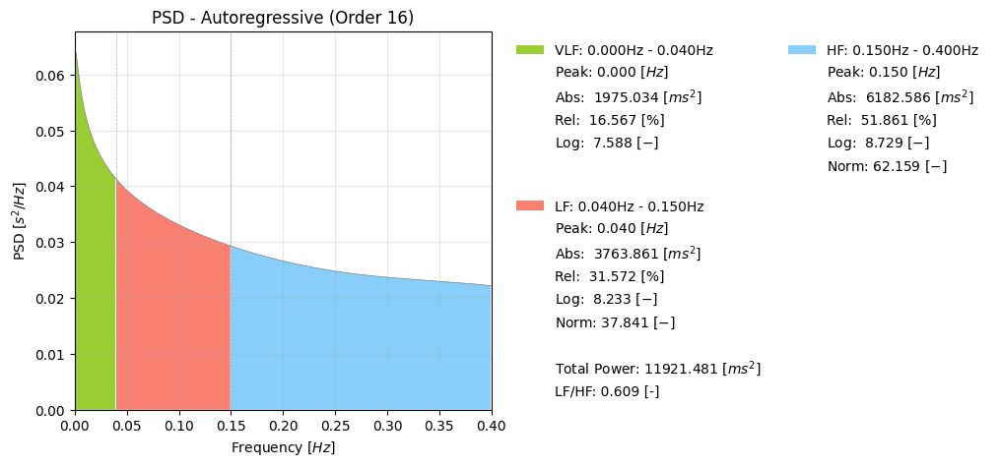

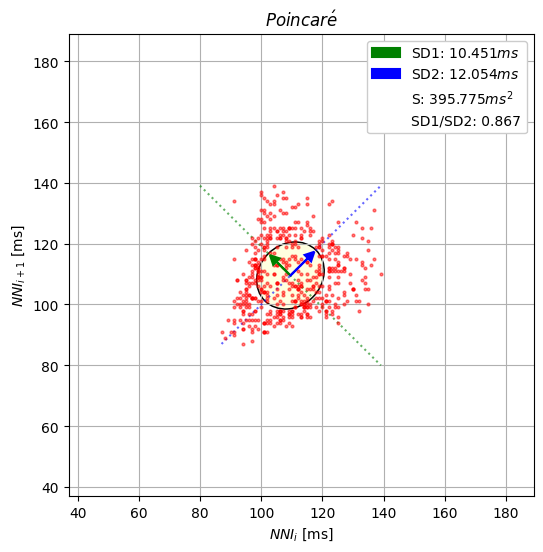

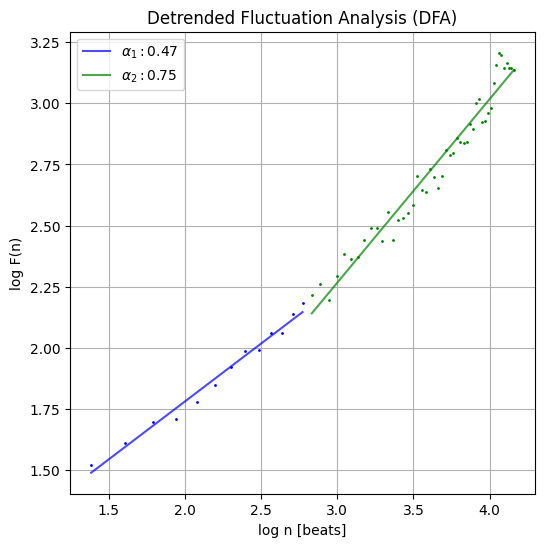

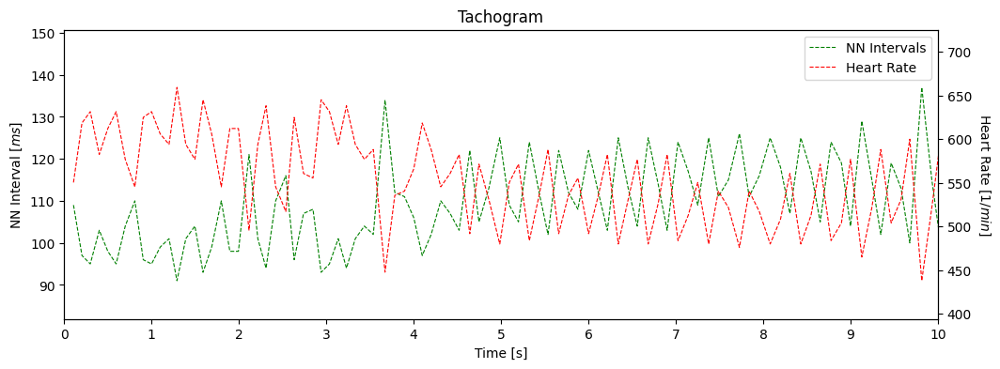

In [17]:
for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    signal, rpeaks = biosppy.signals.ecg.ecg(signal= signal, sampling_rate = 130, show=False)[1:3]
    nni = tools.nn_intervals(rpeaks)
    hrv_result = pyhrv.hrv(nni=nni, 
                               rpeaks=rpeaks, 
                               # signal=signal, 
                               sampling_rate=130., 
                               interval=[0, 10], 
                               plot_ecg=True, 
                               plot_tachogram=True, 
                               show=True, 
                               fbands=None)
    # tools.hrv_export(hrv_result, path= path+'/Stress_sensor_data_processing/resting_result_h10', plots = True)

In [ ]:
with gzip.open('h10_dicttask.pickle','rb') as f:
    df = pickle.load(f)

for i in resting_h10_dict:
    print(i)
    print(len(resting_h10_dict[i]))
    signal = resting_h10_dict[i]['sensor']
    signal, rpeaks = biosppy.signals.ecg.ecg(signal= signal, 
                                             sampling_rate = 130, 
                                             show=False)[1:3]
    nni = tools.nn_intervals(rpeaks)
    result = td.time_domain(nni)
    for i in result.keys():
        print(f'{i}: {result[i]}', )